# Group BA: DM Project
### Customer Segmentation in PVA

#### Made by:
* Catarina Candeias (m20200656@novaims.unl.pt)
* Catarina Urbano (m20200607@novaims.unl.pt)
* Rita Ferreira (m20200661@novaims.unl.pt)

## Table of Contents

* [1. Imports](#1)
* [2. Loading Data](#2)
* [3. Initial Analysis](#3)
* [4. Missing Values](#4)
    * [4.1. Removing the features that have missing values](#4.1)
* [5. Feature Engineering](#5)
    * [5.1. Function to update the Metric and Non-Metric Variables](#5.1)
* [6. Outliers](#6)
    * [6.1. Box Plots](#6.1)
* [7. Fill missing values (Data imputation)](#7)
* [8. Metric Features](#8)
    * [8.1. Low Variance](#8.1)
    * [8.2. Correlation](#8.2)
        * [8.2.1. Dealing with highly correlated Features](#8.2.1)    
        * [8.2.2. Dealing with very low correlated Features](#8.2.2)
    * [8.3. Scale/Standardize our data](#8.3)
    * [8.4. Apply kmeans on the Principal Components for feature selection](#8.4)
        * [8.4.1. Random Forest for feature selection](#8.4.1) 
        * [8.4.1. ExtraTrees for feature selection](#8.4.2)   
* [9. Dimensionality Reduction on the features we got left](#9)
    * [9.1. PCA](#9.1)
    * [9.2. Removing Outliers Again](#9.2)
        * [9.2.1. DBSCAN](#9.2.1)
        * [9.2.2. Merging IQR, Z score and DBSCAN to detect outleirs](#9.2.2)
* [10. Categorical Features](#10)
    * [10.1. Single Value Features](#10.1)
    * [10.2. Remove the variables that for one category have more than 90% of the observations](#10.2)
    * [10.3. Drop the categorical features with high variability , in case none of its categories have more than 10%](#10.3)
    * [10.4. Plotting the cardinality of each variable](#10.4)
    * [10.5. Plotting pie charts of each variable](#10.5)
    * [10.6. Reducing the cardinality](#10.6)
    * [10.7. Getting Dummies](#10.7)
* [11. Reassigning df to contain pca variables so we can use them for our clustering](#11)
* [12 Clustering](#12)
    * [<font color='red'> 12.1. Final Clustering solution - Kmeans </font>](#12.1) 
        * [12.1.1. Checking the optimal number of clusters using the kmeans silhouette analysis](#12.1.1)
        * [12.1.2. Defining Kmeans](#12.1.2)
      
        * [12.1.3. Visual Analysis of the metric features´ results](#12.1.3)
        
        * [12.1.4. Kmeans Clustering solution interpretation for the Categorical Variables](#12.1.4)    
        
            * [12.1.4.1. Contingency table: Categories vs Clusters and Chi-square test of independence ](#12.1.4.1)  
            * [12.1.4.2. Frequency and Proportion barcharts of the categorical features and clusters](#12.1.4.2)   
        
            * [12.1.4.3. Visual representation of the choosen categorical features](#12.1.4.3)
        * [12.1.5. R^2](#12.1.5)
        * [12.1.6. Visualizing the Clusters](#12.1.6)
        * [12.1.7. Visualizing the outliers in the clustering solution](#12.1.7)
        * [12.1.8. Labelling our Clusters](#12.1.8)
    * [12.2. Other Clustering Solutions](#12.2)
        * [12.2.1. Kmeans+HC](#12.2.1)
        * [12.2.2. Density Based Clustering](#12.2.2)
            * [12.2.2.1. Mean Shift Clustering](#12.2.2.1)
            * [12.2.2.2. DBSCAN (Density-based spatial clustering of applications with noise)](#12.2.2.2)
        * [12.2.3. Gaussian Mixture Model](#12.2.3)
        * [12.2.4. SOM (Self Organizing Maps)](#12.2.4)


# 1. Imports <a class="anchor" id="1"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
# from pandas_profiling import ProfileReport 

%matplotlib inline

from math import ceil
from sklearn.cluster import KMeans


import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from datetime import datetime
from datetime import date
from scipy.stats import chi2_contingency
from sklearn.ensemble.forest import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

import matplotlib.cm as cm
# import graphviz
from sklearn.manifold import TSNE


# 2. Loading Data <a class="anchor" id="2"></a>

In [2]:
df = pd.read_csv('donors.csv', header=0, index_col=[0,'CONTROLN'], low_memory=False, 
                 dtype={'TCODE':'str','HPHONE_D':'str','RFA_2F':'str','WEALTH1':'str','WEALTH2':'str','INCOME':'str'})
df.head()

,,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,TIMELAG,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,4.0,7.741935,0,L,4,E,X,X,X,C
1,148535,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,18.0,15.666667,0,L,2,G,X,X,X,A
2,15078,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,12.0,7.481481,1,L,4,E,X,X,X,C
3,172556,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,9.0,6.812500,1,L,4,E,X,X,X,C
4,7112,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,14.0,6.864865,1,L,2,F,X,X,X,A


In [3]:
df.shape

(95412, 474)


# 3. Initial Analysis <a class="anchor" id="3"></a>

Are there duplicated observations?

In [4]:
# Checking for duplicates:
df.duplicated().sum()

0

Data types:

In [5]:
# check df data types:
df.dtypes

ODATEDW     object
OSOURCE     object
TCODE       object
STATE       object
ZIP         object
             ...  
RFA_2A      object
MDMAUD_R    object
MDMAUD_F    object
MDMAUD_A    object
GEOCODE2    object
Length: 474, dtype: object

 Replace "" by nans:

In [6]:
df.replace("", np.nan, inplace=True)

In [7]:
# The variable 'NOEXCH' has the values of '0' and '1' which aren´t supposed to be there (according to the meta data), so we are
# going to replace them with nan´s:
df['NOEXCH'].replace("0", np.nan, inplace=True)
df['NOEXCH'].replace("1", np.nan, inplace=True)

In [8]:
# Dealing with the white spaces where they aren´t supposed to be according to the MetaData:
lst = []
for column in df.columns:
    if (df[column].isin([' ']).sum()>0):
        lst.append(column)
# Decide which ones to replace by NaN or not 
for feature in lst:
    print(df[feature].value_counts())        

#variables in which i´ll replace the ' ' by Nan:
to_be_replaced=['OSOURCE','PVASTATE','DOMAIN','HOMEOWNR','GENDER','DATASRCE','LIFESRC','RFA_3','RFA_4','RFA_5','RFA_6','RFA_7','RFA_8',
                'RFA_9','RFA_10','RFA_11','RFA_12','RFA_13','RFA_14','RFA_15','RFA_16','RFA_17','RFA_18','RFA_19','RFA_20',
               'RFA_21','RFA_22','RFA_23','RFA_24','GEOCODE2']

for feature in to_be_replaced:
    df[feature].replace(" ", np.nan, inplace=True)
    
# For the variables CHILD03, CHILD07, CHILD12, and CHILD18 was considered the white space as the absence of children and not as missing values
# Therefore, the with spaces will be replaced by the letter 'A' (Absence)
for feature in ['CHILD03','CHILD07','CHILD12','CHILD18']:
    df[feature].replace(" ", 'A', inplace=True)

# In the variables 'COLLECT1'-'PLATES' the white space corresponds to the category 'N':
for feature in df.columns[52:70]:
    df[feature].replace(" ", 'N', inplace=True)

MBC    4539
SYN    3563
AML    3430
BHG    3324
IMP    2986
       ... 
TAB       1
EAR       1
BBO       1
HCA       1
MSP       1
Name: OSOURCE, Length: 896, dtype: int64
     94013
B     1399
Name: MAILCODE, dtype: int64
     93954
P     1453
E        5
Name: PVASTATE, dtype: int64
X    35
      7
Name: NOEXCH, dtype: int64
     88709
X     6703
Name: RECINHSE, dtype: int64
     93395
X     2017
Name: RECP3, dtype: int64
     95298
X      114
Name: RECPGVG, dtype: int64
     93795
X     1617
Name: RECSWEEP, dtype: int64
R2    13623
T2    12369
S1    11503
S2     8530
C2     8264
C1     6145
C3     5280
T1     4982
R3     4809
U1     4510
U2     3254
U3     2598
       2316
T3     2176
S3     1891
U4     1804
R1     1358
Name: DOMAIN, dtype: int64
H    52354
     22228
U    20830
Name: HOMEOWNR, dtype: int64
     94266
M      869
F      237
B       40
Name: CHILD03, dtype: int64
     93846
M     1061
F      408
B       97
Name: CHILD07, dtype: int64
     93601
M     1149
F      520
B

Sorted count of missing values:

In [9]:
pd.DataFrame(df.isnull().sum()[df.isnull().sum()>0].sort_values(ascending=False),columns=['Missing Values Count'])

,Missing Values Count
RAMNT_5,95403
RDATE_5,95403
NOEXCH,95370
RAMNT_3,95170
RDATE_3,95170
...,...
GEOCODE2,319
MSA,132
ADI,132
DMA,132


Checking descriptive statistics:

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
NUMCHLD,12386.0,1.527773,0.806861,1.000000,1.000000,1.000000,2.000000,7.0
HIT,95412.0,3.321438,9.306899,0.000000,0.000000,0.000000,3.000000,241.0
MBCRAFT,42558.0,0.152075,0.470023,0.000000,0.000000,0.000000,0.000000,6.0
MBGARDEN,42558.0,0.059166,0.262078,0.000000,0.000000,0.000000,0.000000,4.0
MBBOOKS,42558.0,1.116382,1.669967,0.000000,0.000000,0.000000,2.000000,9.0
...,...,...,...,...,...,...,...,...
MINRAMNT,95412.0,7.933656,8.784231,0.000000,3.000000,5.000000,10.000000,1000.0
MAXRAMNT,95412.0,19.999790,25.067746,5.000000,14.000000,17.000000,23.000000,5000.0
LASTGIFT,95412.0,17.313127,13.956630,0.000000,10.000000,15.000000,20.000000,1000.0
TIMELAG,85439.0,8.093739,8.213242,0.000000,4.000000,6.000000,11.000000,1088.0


# 4. Missing Values <a class="anchor" id="4"></a>

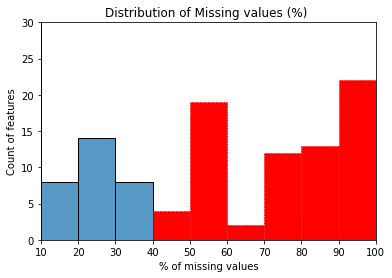

In [11]:
# Plotting the distribution of missing values(greater than 10%)
ax = sns.histplot(df.isnull().mean()*100, bins=10)
ax.set_title('Distribution of Missing values (%) ')
ax.set(xlabel='% of missing values', ylabel='Count of features',xlim=(10,100),ylim=(0,30))
# Colloring red the bars that represent the count of features with % of missing values >= 40% :
for i in range(4,10):
    ax.patches[i].set_color('r')
    ax.patches[i].set_linestyle(':')
plt.show(ax)


## 4.1. Removing the features that have missing values <a class="anchor" id="4.1"></a>

We are removing all the columns that have more than 40% of Missing Values

In [12]:
cols = df.columns[df.isnull().mean() > 0.4]

display(pd.DataFrame(df[cols].isnull().mean()*100, columns=['% Missing Values']).sort_values(by='% Missing Values',ascending=False))

df = df.drop(cols, axis=1)

print('The removed variables are the following: ',cols)

,% Missing Values
RAMNT_5,99.990567
RDATE_5,99.990567
NOEXCH,99.955980
RAMNT_3,99.746363
RDATE_3,99.746363
...,...
RFA_20,52.613927
WEALTH1,46.882992
WEALTH2,45.930281
ADATE_13,42.152979


The removed variables are the following:  Index(['PVASTATE', 'NOEXCH', 'NUMCHLD', 'WEALTH1', 'MBCRAFT', 'MBGARDEN',
       'MBBOOKS', 'MBCOLECT', 'MAGFAML', 'MAGFEM', 'MAGMALE', 'PUBGARDN',
       'PUBCULIN', 'PUBHLTH', 'PUBDOITY', 'PUBNEWFN', 'PUBPHOTO', 'PUBOPP',
       'WEALTH2', 'LIFESRC', 'ADATE_13', 'ADATE_15', 'ADATE_20', 'ADATE_23',
       'RFA_13', 'RFA_15', 'RFA_20', 'RFA_23', 'RDATE_3', 'RDATE_4', 'RDATE_5',
       'RDATE_6', 'RDATE_7', 'RDATE_8', 'RDATE_9', 'RDATE_10', 'RDATE_11',
       'RDATE_12', 'RDATE_13', 'RDATE_14', 'RDATE_15', 'RDATE_16', 'RDATE_17',
       'RDATE_18', 'RDATE_19', 'RDATE_20', 'RDATE_21', 'RDATE_22', 'RDATE_23',
       'RDATE_24', 'RAMNT_3', 'RAMNT_4', 'RAMNT_5', 'RAMNT_6', 'RAMNT_7',
       'RAMNT_8', 'RAMNT_9', 'RAMNT_10', 'RAMNT_11', 'RAMNT_12', 'RAMNT_13',
       'RAMNT_14', 'RAMNT_15', 'RAMNT_16', 'RAMNT_17', 'RAMNT_18', 'RAMNT_19',
       'RAMNT_20', 'RAMNT_21', 'RAMNT_22', 'RAMNT_23', 'RAMNT_24'],
      dtype='object')



# 5. Feature Engineering <a class="anchor" id="5"></a>

#### Gender

In [13]:
df["GENDER"] = df["GENDER"].apply(lambda x: "U" if (x != "F" and x != "M") else x)

#### Dates Variables

In [14]:
date_vars=[]
# Features that refer to dates:
for feature in df.columns.values:
    if 'DATE' in feature:
        date_vars.append(feature)
        #Converting all the dates to datetime type:
        df[feature] = df[feature].map(lambda x: pd.to_datetime(x, format="%Y-%m-%d", errors="coerce").date()) #We have NaN variables, as when defining errors="coerce".

# displaying the changes
df[date_vars]

,,ODATEDW,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,...,ADATE_19,ADATE_21,ADATE_22,ADATE_24,MAXADATE,MINRDATE,MAXRDATE,LASTDATE,FISTDATE,NEXTDATE
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,2009-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2014-09-01,2014-06-01,2017-02-01,2012-08-01,2014-02-01,2015-12-01,2009-11-01,2010-03-01
1,148535,2014-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2014-09-01,2014-06-01,2017-02-01,2013-10-01,2015-12-01,2015-12-01,2013-10-01,2015-04-01
2,15078,2010-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaT,...,2014-11-01,NaT,2014-09-01,2014-06-01,2017-02-01,2011-11-01,2012-07-01,2015-12-01,2010-01-01,2011-01-01
3,172556,2007-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaT,...,2014-11-01,2014-10-01,2014-09-01,NaT,2017-02-01,2007-11-01,2014-11-01,2015-12-01,2007-02-01,2007-11-01
4,7112,2006-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2015-12-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2015-06-01,2014-06-01,2017-02-01,2013-10-01,2016-01-01,2016-01-01,1999-03-01,2000-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,184568,2016-01-01,2017-06-01,2016-06-01,2016-04-01,NaT,2016-03-01,2016-01-01,2015-12-01,NaT,NaT,...,NaT,NaT,NaT,NaT,2017-02-01,2016-02-01,2016-02-01,2016-02-01,2016-02-01,NaT
95408,122706,2016-01-01,2017-06-01,NaT,NaT,NaT,NaT,2016-01-01,2016-01-01,NaT,NaT,...,NaT,NaT,NaT,NaT,2017-02-01,2016-03-01,2016-03-01,2016-03-01,2016-03-01,NaT
95409,189641,2015-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,NaT,2016-01-01,2015-11-01,2015-10-01,...,NaT,2014-09-01,2014-08-01,NaT,2017-02-01,2016-03-01,2015-01-01,2016-10-01,2014-10-01,2015-01-01


#### DOB to Age

Transforming "DOB" feature into "AGE" feature, with the "ADATE_2" feature, knowing that 25% of the observations are NAN's

In [15]:
date_vars.append("DOB")
df["DOB"] = df["DOB"].map(lambda x: pd.to_datetime(x, format="%Y-%m-%d", errors="coerce").date()) 

#*We have NaN variables, as when defining errors="coerce"

In [16]:
df["DOB"].isna().sum()/df.shape[0]

0.2503144258583826

In [17]:
df['DOB'] = ((df["ADATE_2"] - df['DOB'])/365).dt.days
df.rename(columns={'DOB':'AGE'},inplace=True)

In [18]:
date_vars.remove("DOB")
df[date_vars]

,,ODATEDW,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,...,ADATE_19,ADATE_21,ADATE_22,ADATE_24,MAXADATE,MINRDATE,MAXRDATE,LASTDATE,FISTDATE,NEXTDATE
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,2009-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2014-09-01,2014-06-01,2017-02-01,2012-08-01,2014-02-01,2015-12-01,2009-11-01,2010-03-01
1,148535,2014-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2014-09-01,2014-06-01,2017-02-01,2013-10-01,2015-12-01,2015-12-01,2013-10-01,2015-04-01
2,15078,2010-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaT,...,2014-11-01,NaT,2014-09-01,2014-06-01,2017-02-01,2011-11-01,2012-07-01,2015-12-01,2010-01-01,2011-01-01
3,172556,2007-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaT,...,2014-11-01,2014-10-01,2014-09-01,NaT,2017-02-01,2007-11-01,2014-11-01,2015-12-01,2007-02-01,2007-11-01
4,7112,2006-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2015-12-01,2016-01-01,2015-11-01,2015-10-01,...,2014-11-01,2014-10-01,2015-06-01,2014-06-01,2017-02-01,2013-10-01,2016-01-01,2016-01-01,1999-03-01,2000-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,184568,2016-01-01,2017-06-01,2016-06-01,2016-04-01,NaT,2016-03-01,2016-01-01,2015-12-01,NaT,NaT,...,NaT,NaT,NaT,NaT,2017-02-01,2016-02-01,2016-02-01,2016-02-01,2016-02-01,NaT
95408,122706,2016-01-01,2017-06-01,NaT,NaT,NaT,NaT,2016-01-01,2016-01-01,NaT,NaT,...,NaT,NaT,NaT,NaT,2017-02-01,2016-03-01,2016-03-01,2016-03-01,2016-03-01,NaT
95409,189641,2015-01-01,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,NaT,2016-01-01,2015-11-01,2015-10-01,...,NaT,2014-09-01,2014-08-01,NaT,2017-02-01,2016-03-01,2015-01-01,2016-10-01,2014-10-01,2015-01-01


#### ADATES_X_Diff

Creating the ADATES_x_diff variables as the days between the ADATES_ and MAXADATE

In [19]:
for feature in df.columns.values:
    if 'ADATE_' in feature:
        df[feature] = (df["MAXADATE"] - df[feature]).dt.days
        df.rename(columns={feature: (feature + '_diff')},inplace=True)

In [20]:
df.loc[:,"ADATE_2_diff":"ADATE_24_diff"]

,,ADATE_2_diff,ADATE_3_diff,ADATE_4_diff,ADATE_5_diff,ADATE_6_diff,ADATE_7_diff,ADATE_8_diff,ADATE_9_diff,ADATE_10_diff,ADATE_11_diff,ADATE_12_diff,ADATE_14_diff,ADATE_16_diff,ADATE_17_diff,ADATE_18_diff,ADATE_19_diff,ADATE_21_diff,ADATE_22_diff,ADATE_24_diff
,CONTROLN,,,,,,,,,,,,,,,,,,,
0,95515,-120,245.0,306.0,306.0,337.0,366.0,397.0,458.0,489.0,489.0,550.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0
1,148535,-120,245.0,306.0,306.0,337.0,366.0,397.0,458.0,489.0,489.0,519.0,NaN,703.0,NaN,NaN,823.0,854.0,884.0,976.0
2,15078,-120,245.0,306.0,306.0,337.0,366.0,397.0,458.0,NaN,489.0,550.0,611.0,703.0,NaN,762.0,823.0,NaN,884.0,976.0
3,172556,-120,245.0,306.0,306.0,337.0,366.0,397.0,458.0,NaN,489.0,550.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,NaN
4,7112,-120,245.0,306.0,306.0,337.0,428.0,397.0,458.0,489.0,519.0,550.0,611.0,703.0,731.0,793.0,823.0,854.0,611.0,976.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,184568,-120,245.0,306.0,NaN,337.0,397.0,428.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95408,122706,-120,NaN,NaN,NaN,NaN,397.0,397.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95409,189641,-120,245.0,306.0,306.0,337.0,NaN,397.0,458.0,489.0,489.0,519.0,611.0,703.0,NaN,762.0,NaN,884.0,915.0,NaN


We are checking if there are any inconsistencies in the new variables by counting the negatives values in each column.

We can assess that 'ADATE_2_diff' has 95412 negative vales, which is 'impossible' according to the interpretation of the variable and according to the way how it was obtained (knowing that the MAXDATE corresponds the dates when the most recent promotion was received), so there were pre-existing problems in the original variables used to create it

Therefore, this feature will be removed.

In [21]:
(df.loc[:,"ADATE_2_diff":"ADATE_24_diff"])[(df.loc[:,"ADATE_2_diff":"ADATE_24_diff"]) < 0].count()

ADATE_2_diff     95412
ADATE_3_diff         0
ADATE_4_diff         0
ADATE_5_diff         0
ADATE_6_diff         0
ADATE_7_diff         0
ADATE_8_diff         0
ADATE_9_diff         0
ADATE_10_diff        0
ADATE_11_diff        0
ADATE_12_diff        0
ADATE_14_diff        0
ADATE_16_diff        0
ADATE_17_diff        0
ADATE_18_diff        0
ADATE_19_diff        0
ADATE_21_diff        0
ADATE_22_diff        0
ADATE_24_diff        0
dtype: int64

In [22]:
df.drop(columns="ADATE_2_diff", inplace=True)

According to the metadata the variables 'ODATEDW' and 'FIRSTDATE' refer to the same, so we are checking if in terms of values they are in fact equal

In [23]:
(df.loc[:,["ODATEDW","FISTDATE"]]).groupby(by = ["ODATEDW","FISTDATE"]).agg({"ODATEDW": "count"}).rename(
    columns = {"ODATEDW":"Count of"}).sort_values(by = "Count of", ascending = False)

Count of
ODATEDW    FISTDATE            
2015-01-01 2015-01-01      2944
2014-01-01 2014-01-01      2768
           2013-10-01      2618
2015-01-01 2014-10-01      2421
2016-01-01 2016-01-01      2390
...                         ...
2010-01-01 2009-08-01         1
           2009-03-01         1
           2007-12-01         1
           2007-11-01         1
2017-01-01 2016-02-01         1

[633 rows x 1 columns]

In [24]:
df[df["ODATEDW"]==df["FISTDATE"]]

,,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,AGE,RECINHSE,RECP3,RECPGVG,...,TIMELAG,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
2,15078,2010-01-01,AMH,1,NC,27017,,NaN,,,,...,12.0,7.481481,1,L,4,E,X,X,X,C
5,47784,2014-01-01,CWR,0,AL,35603,,NaN,,,,...,6.0,12.750000,0,L,1,F,X,X,X,C
6,62117,2007-01-01,DRK,0,IN,46755,,37.0,,,,...,4.0,7.642857,1,L,1,E,X,X,X,D
7,109359,2014-01-01,NWN,0,LA,70611,,NaN,,,,...,6.0,6.200000,1,L,3,E,X,X,X,C
8,75768,2008-01-01,LIS,1,IA,51033,,NaN,,,,...,8.0,18.090909,1,L,1,F,X,X,X,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95386,157506,2007-01-01,STR,28,CA,92870,,46.0,,,,...,34.0,25.000000,0,L,1,G,X,X,X,A
95389,139193,2015-01-01,ARG,1,NM,87031,,48.0,,,,...,11.0,15.000000,1,L,1,F,X,X,X,D
95393,17039,2012-01-01,SSS,1,NC,27534,,68.0,,,,...,6.0,9.818182,1,L,3,F,X,X,X,C


In [25]:
(df[df["ODATEDW"]==df["FISTDATE"]]).shape[0]/df.shape[0] # 17.4% of the observations are the same between both variables

0.17419192554395674

In [26]:
df.drop(columns = ["ODATEDW"], inplace=True)

#### Interval Time

New variable created = Date associated with the most recent gift(LASTDATE) - Date of the first gift(FISTDATE) 

Interval of time between these two features -> New feature informs us about the days between the first and last gifts

In [27]:
df["Interval_Time"] = (df["LASTDATE"] - df["FISTDATE"]).dt.days

In [28]:
df["Interval_Time"][df["Interval_Time"]<0] # checking for inconsistencies

Series([], Name: Interval_Time, dtype: float64)

#### LASTDATE and FISTDATE

As we have already a variable which gives us the infomation about the interval time, we can discard the information about the First and Last date.

In [29]:
df.drop(columns = ["LASTDATE","FISTDATE"], inplace=True)

#### NEXTDATE

As we can see, the NEXTDATE, which represents the date of the second gift, doesn't bring any further information among the remaining variables. So, we decide, subjectively, to drop this variable.

In [30]:
df.drop(columns = ["NEXTDATE"], inplace=True)

### 5.1. Function to update the Metric and Non-Metric Variables <a class="anchor" id="5.1"></a>

In [31]:
def update_metric_feat(df):
    metric_features = df.select_dtypes(include=np.number).columns
    non_metric_features = df.select_dtypes(exclude=np.number).columns
    return metric_features.tolist(),non_metric_features.tolist()

metric_features = update_metric_feat(df)[0]
non_metric_features = update_metric_feat(df)[1]

# 6. Outliers <a class="anchor" id="6"></a>

#### 6.1. Box Plots <a class="anchor" id="6.1"></a>

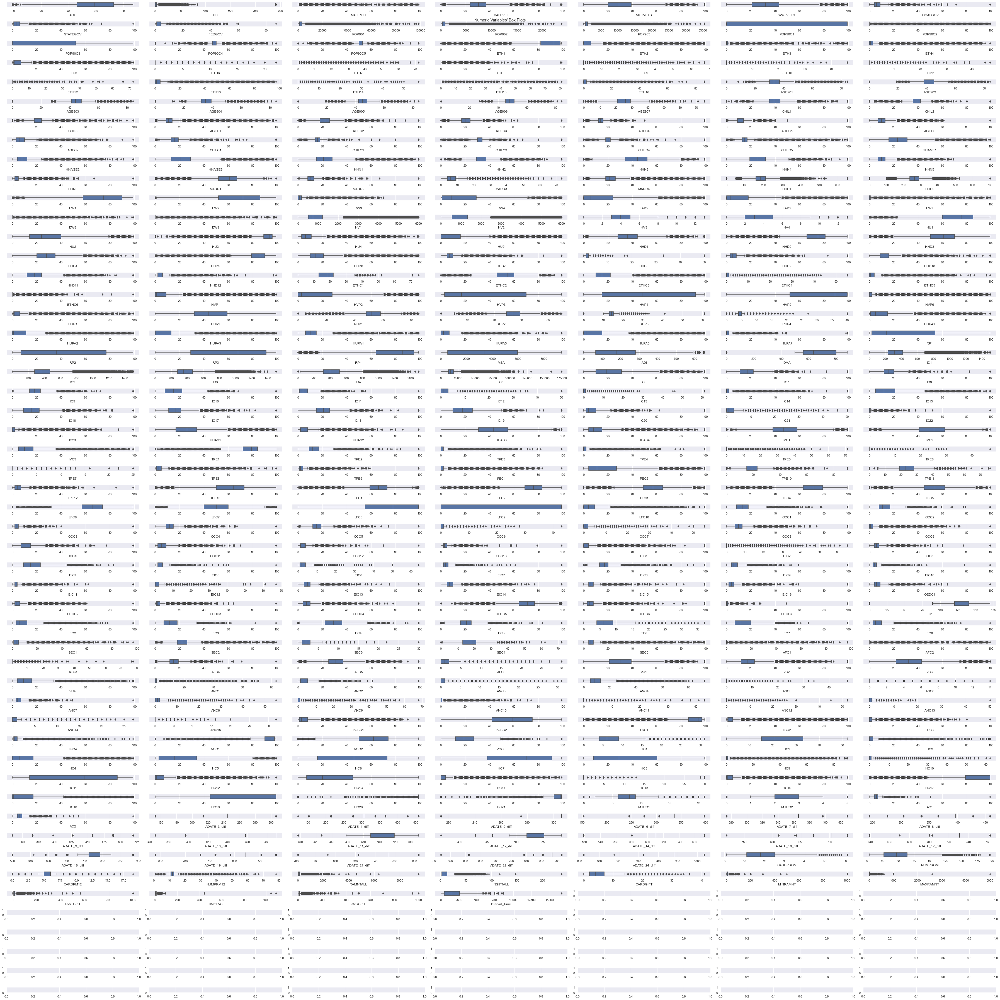

In [32]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(52, ceil(len(metric_features) / 52), figsize=(50, 50), squeeze=True)

# Plot data
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=df[feat], ax=ax)
#     ax.set_title(feat, y=-0.21)

# Adjusting my subplots:
fig.tight_layout()

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"
plt.suptitle(title)

plt.show()

Steps:
- 1) Impute temporarily the missing values with the median for the metric features and mode for the non-metric features, because those measures are robust to outliers
- 2) Drop outliers using the Local Outlier Factor method 
- 3) Now that we don´t have outliers anymore we can use a better method for the missing data imputation-> knn imputer
- 4) After the feature selection we can go back and make a 2nd outlier removal only on the variables that we kept using the intersection of the methods IQR, z-score and and DBSCAN 

#### Naive Imputation of the missing values

Creating an auxiliary df ( so that later we can use another method for the data imputation), and Filling the Categorical Variables with the mode and the Numeric Variables with the Median.

In [33]:
aux_df = df.copy()

for column in metric_features:
    aux_df[column] = aux_df[column].fillna(aux_df[column].median())
for column in non_metric_features:
    aux_df[column] = aux_df[column].fillna(aux_df[column].mode()[0])

Now, we can drop the outliers on our original df, based on our aux_df without missing values:

In [34]:
# Dealing with outliers on the metric features:
from sklearn.neighbors import LocalOutlierFactor

# Note that: we are only finding out outliers among the metric features:
# identifying outliers in our dataset
lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(aux_df[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1

# Data Frame that contains the observations that are outliers so that after the clustering we can assign them to the clusters:
outliers_df = aux_df.iloc[~mask, :].copy()

# variable that contains the original number of observations:
numero_obs_original = df.shape[0]
df = df.drop(index=aux_df.iloc[~mask, :].index)


print('% eliminated =',(1-len(df)/numero_obs_original)*100,'%')

% eliminated = 0.8499979038276151 %


Now our df is free of outliers, so we can make a better imputation of the missing values in the metric features.

#### Later when we have done all of our feature selection, we can go back here and apply the following methods:

In [35]:
def z_score_outlier_detection(df,column):
    mean = df[column].mean()
    std = df[column].std()
    threshold = 3
    z_s = (df[column]-mean)/std
    return z_s.apply(lambda z: z>threshold) # true if outlier

In [36]:
# Defining a function that removes the outliers from the metric features, using the IQR method:
def iqr_outlier_detection(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = (q3 - q1) 
    lower_lim = q1 - 2 * iqr
    upper_lim = q3 + 2 * iqr
    return df[column].apply(lambda x: (x < lower_lim or x > upper_lim))   # true if outlier

## 7. Fill missing values (Data imputation) <a class="anchor" id="7"></a>

##### Imputation of the NON metric features
Filling the Categorical Variables with the mode:

In [37]:
# Non Metric features:
for column in non_metric_features:
    df[column] = df[column].fillna(df[column].mode()[0])

##### Imputation of the metric features
For each metric variable with missing values, we performed the KNN imputer using as a subset of variables to find the neighbors the top 10 variables correlated to the one we want to impute.

In [38]:
corr = df.corr().abs()

# metric features with nans:
vars_with_nan = (df.isna().sum()[df.isna().sum()!=0].index)&metric_features
indices_nan= df[metric_features].isna().any(axis=1) # list so that in the end we can check the changes made

for feature in vars_with_nan:
    
    # group of the top 10 vars correlated to the feature
    group_correlated=corr[feature].sort_values(ascending=False)[:10].index 
    
    df_neighbors = df[group_correlated].copy()

    # KNNImputer using the group we found before
    imputer = KNNImputer(n_neighbors=5, weights="uniform")
    df_neighbors[group_correlated] = imputer.fit_transform(df_neighbors[group_correlated])

    df[feature]=df_neighbors[feature].copy()
    
# Displaying the changes:
df.loc[indices_nan,vars_with_nan]

,,AGE,MSA,ADI,DMA,ADATE_3_diff,ADATE_4_diff,ADATE_5_diff,ADATE_6_diff,ADATE_7_diff,ADATE_8_diff,...,ADATE_12_diff,ADATE_14_diff,ADATE_16_diff,ADATE_17_diff,ADATE_18_diff,ADATE_19_diff,ADATE_21_diff,ADATE_22_diff,ADATE_24_diff,TIMELAG
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
1,148535,45.0,4480.0,13.0,803.0,245.0,306.0,306.0,337.0,366.0,397.0,...,519.0,611.0,703.0,731.0,768.2,823.0,854.0,884.0,976.0,18.0
2,15078,54.4,0.0,281.0,518.0,245.0,306.0,306.0,337.0,366.0,397.0,...,550.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0,12.0
3,172556,69.0,9340.0,67.0,862.0,245.0,306.0,306.0,337.0,366.0,397.0,...,550.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0,9.0
5,47784,62.6,2030.0,185.0,691.0,245.0,306.0,306.0,337.0,366.0,397.0,...,519.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0,6.0
6,62117,37.0,0.0,91.0,509.0,245.0,306.0,306.0,337.0,366.0,397.0,...,550.0,611.0,703.0,731.0,762.0,823.0,854.0,915.0,976.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95405,156106,59.8,6780.0,577.0,804.0,245.0,306.0,306.0,337.0,366.0,397.0,...,519.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0,19.0
95406,35088,49.0,5960.0,329.0,534.0,245.0,306.0,306.0,337.0,366.0,397.0,...,550.0,611.0,703.0,731.0,762.0,823.0,854.0,884.0,976.0,3.0
95407,184568,53.0,380.0,0.0,743.0,245.0,306.0,306.0,337.0,397.0,428.0,...,543.8,611.0,703.0,762.0,793.0,884.0,884.0,902.6,976.0,0.0


Confirming that there aren't null observations:

In [39]:
df[df.isnull().any(axis=1)]

,,OSOURCE,TCODE,STATE,ZIP,MAILCODE,AGE,RECINHSE,RECP3,RECPGVG,RECSWEEP,...,AVGGIFT,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,Interval_Time
,CONTROLN,,,,,,,,,,,,,,,,,,,,,


#### First backup df

In [40]:
df_after_imputation = df.copy()

# 8. Metric Features <a class="anchor" id="8"></a>

## 8.1. Low Variance <a class="anchor" id="8.1"></a>

Here we are removing variables with low Variance. 

Done on a MinMaxScaler scaled data. 

If the variance is too low, it means that it does not change much and hence it can be ignored.

To define the threshold for the variance we ploted histograms(with auto binning) of the variables to be removed

#### -> Function that plots Histograms of a set of variables:

In [41]:
def histograms(df,features, bins='auto',figsize=(15, 8)):
    # Put this Variables' Histograms in one figure
    sns.set()

    # Prepare figure. Create individual axes where each histogram will be placed
    fig, axes = plt.subplots(ceil(len(features) / 4),4, figsize=figsize)

    # Plot data
    # Iterate across axes objects and associate each histogram:
    for ax, feat in zip(axes.flatten(), features):
        ax.hist(df[feat], bins=bins)
        ax.set_title(feat, y=-0.17)

    # Layout
    # Add a centered title to the figure:
    title = "Variables' Histograms"
    plt.suptitle(title)
    plt.show()

In [42]:
# Scalling our data:
scaler = MinMaxScaler()
# transform data:
scaled = scaler.fit_transform(df[metric_features])
scaled = pd.DataFrame(scaled,columns = metric_features)

The following are redundant variables because of their low variance:
 ['ETH8', 'ETH10', 'ETH11', 'ETH12', 'ETH14', 'HHD8', 'RHP4', 'IC22', 'TPE6', 'TPE7', 'OCC3', 'OCC6', 'OEDC7', 'AFC3', 'ANC1', 'ANC5', 'ANC10', 'ANC11', 'ANC13', 'ANC15', 'HC15', 'AC1', 'ADATE_3_diff', 'ADATE_4_diff', 'ADATE_5_diff', 'ADATE_6_diff', 'ADATE_14_diff', 'ADATE_16_diff', 'ADATE_24_diff', 'MINRAMNT', 'MAXRAMNT', 'LASTGIFT', 'AVGGIFT']


,Variance
MINRAMNT,0.000074
AVGGIFT,0.000091
OEDC7,0.000110
ANC15,0.000143
LASTGIFT,0.000167
...,...
HVP3,0.136615
HVP4,0.137436
POP90C3,0.163693
LFC9,0.203667


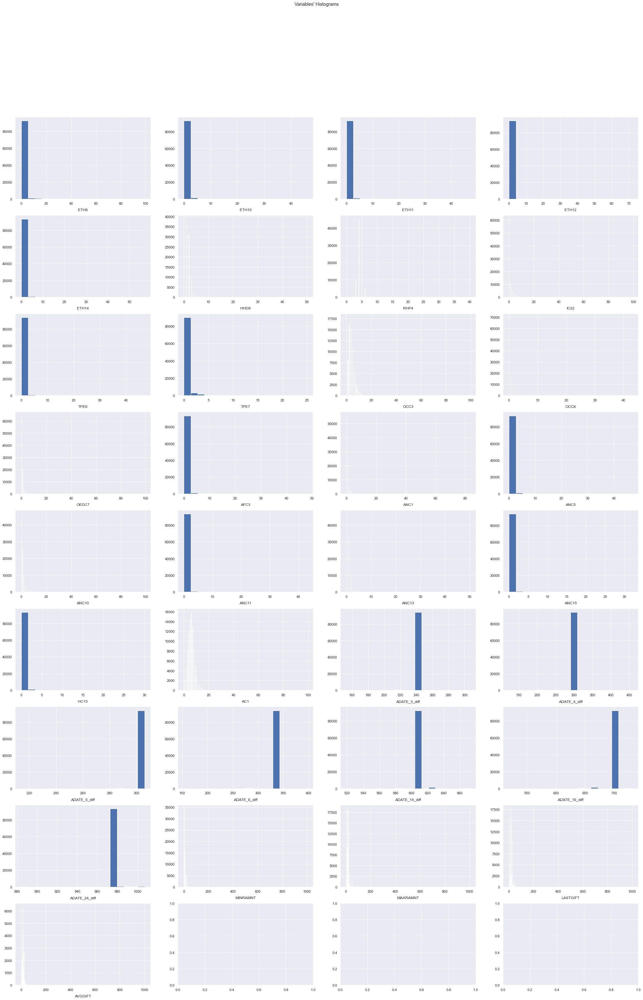

In [43]:
low_variance_features = []
for feature in metric_features:
    if (scaled[feature].var())<0.0009:
        low_variance_features.append(feature)

print('The following are redundant variables because of their low variance:\n',low_variance_features)

# Displaying the variances of the scaled features
display(pd.DataFrame(scaled[metric_features].var(), columns=['Variance']).sort_values(by='Variance'))

#Plotting an histogram of those variables:
histograms(df,low_variance_features, bins='auto',figsize=(35, 50))

# Dropping (note: I wont drop the boolean variable HPHONE_D because it only takes 0 and 1 values so it will easily have a std 
# value above my threshold, but I won´t consider it has being redundant):
df.drop(columns=low_variance_features, inplace=True)

#updating metric features list:
metric_features = update_metric_feat(df)[0]

## 8.2. Correlation <a class="anchor" id="8.2"></a>

Here we are removing the features that have high correlation values (threshold of 85%) -> To avoid multicollinearity

After that, we'll remove the features that have very low correlation values (threshold of 5%)

For each pair of correlated features, our method identifies one of the features for removal (because we only need to remove one of them).

We made a visualization with the high correlations (ex: heatmap that shows all the features that have at least one correlation above the threshold)

Then we made a list of correlated features that will be removed, or show the highly correlated pairs of features in a dataframe

Features with high correlation are more linearly dependent and hence have almost the same effect on the dependent variable. So, when two features have a high correlation, we can drop one of the two features.

In [44]:
def corr_heatmap(corr):    
    # Prepare figure
    fig = plt.figure(figsize=(50, 30))
    # Build annotation matrix (values above |0.85| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.85
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))
    # Plot heatmap of the correlation matrix
    sns.heatmap(data=corr, annot=annot, cmap=['black'], cbar= False,
                fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5, annot_kws={"size": 10}, 
                mask = (np.abs(corr.values) >= 0.85))
    # Layout
    fig.subplots_adjust(top=0.95)
    fig.suptitle("Correlation Matrix", fontsize=20)
    plt.show()

### 8.2.1. Dealing with highly correlated Features <a class="anchor" id="8.2.1"></a>

Taking into consideration that the black color refers to the most correlated features, that is, the features that have a correlation greater than 85%.

The features to be removed because of their high correlation are:
 ['POP902', 'POP903', 'ETH13', 'AGE902', 'AGE903', 'AGE904', 'AGE905', 'AGE906', 'CHILC1', 'HHAGE1', 'HHAGE2', 'HHAGE3', 'HHN3', 'HHN4', 'HHN5', 'HHN6', 'MARR3', 'HHP1', 'HHP2', 'DW2', 'DW5', 'DW6', 'HV2', 'HV4', 'HU2', 'HHD1', 'HHD2', 'HHD3', 'HHD4', 'HHD5', 'HHD9', 'HHD11', 'ETHC3', 'ETHC4', 'ETHC5', 'HVP1', 'HVP2', 'HVP3', 'HVP4', 'HVP5', 'HVP6', 'RHP1', 'RHP2', 'RHP3', 'HUPA2', 'HUPA5', 'HUPA6', 'RP1', 'RP2', 'RP3', 'RP4', 'IC2', 'IC3', 'IC4', 'IC5', 'IC15', 'IC16', 'IC17', 'IC18', 'IC19', 'IC20', 'IC21', 'IC23', 'HHAS1', 'HHAS4', 'TPE4', 'LFC2', 'LFC3', 'LFC4', 'LFC5', 'EIC1', 'OEDC2', 'SEC4', 'AFC2', 'AFC5', 'LSC2', 'LSC3', 'HC5', 'HC7', 'HC8', 'HC18', 'HC21', 'ADATE_19_diff', 'ADATE_21_diff', 'NUMPROM', 'CARDGIFT', 'Interval_Time']


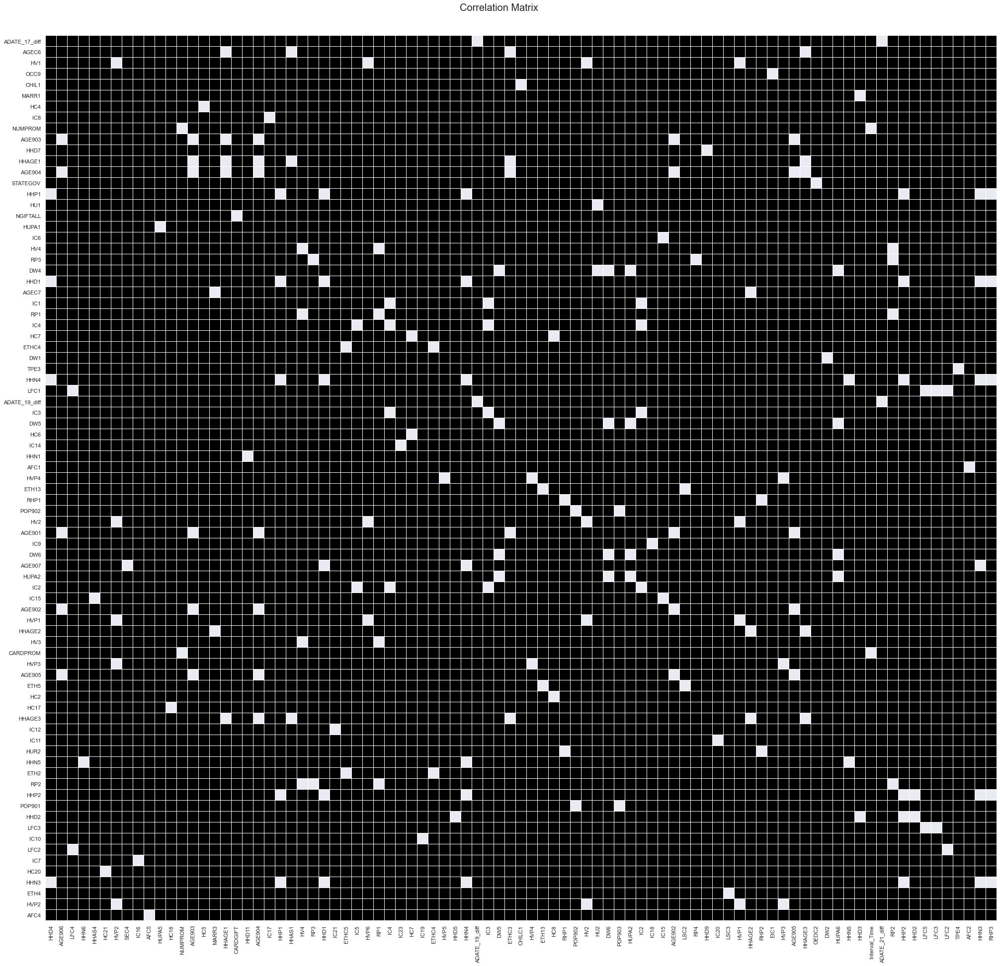

In [45]:
# Creating correlation matrix with the absolute values of the corr:
corr = df.corr().abs()

# Selecting upper triangle of the correlation matrix:
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))

# Finding the index of the feature's columns with correlation greater than 0.85 (>=very strong correlation)
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]

print('The features to be removed because of their high correlation are:\n',to_drop)

# Saving the pairs of correlated features so I can plot an heatmap of their correlations:

# I´ll save both the dropped feature and the one that was correlated with it:
records = pd.DataFrame(columns = ['dropped_feat', 'corr_feat'])
for column in to_drop:
    corr_features = list(upper.index[upper[column].abs() > 0.85])
    drop_features = [column for _ in range(len(corr_features))]
    # Record the information (need a temp df for now)
    aux_df = pd.DataFrame.from_dict({'dropped_feat': drop_features,'corr_feat': corr_features})

    # Add to dataframe
    records = records.append(aux_df, ignore_index = True)


corr_matrix_plot = corr.loc[list(set(records['corr_feat'])),list(set(records['dropped_feat']))]
title = "Correlations Above Threshold"
# * the features on the x axis are the ones that are going to be removed


# Plotting an heatmap:
corr_heatmap(np.round(corr_matrix_plot,decimals=2))


# Dropping the highly correlated features 
df.drop(columns = to_drop, inplace=True)

# updating metric features list:
metric_features = update_metric_feat(df)[0]

### 8.2.2. Dealing with very low correlated Features <a class="anchor" id="8.2.2"></a>

In [46]:
# using the percentile 90 of the correlations of the feature 
# if 90 % of the correlation is bellow 0.05, the variable will be dropped
low_corr=[]
for feature in metric_features:
    if (corr[feature].quantile(0.90)<0.05):
        low_corr.append(feature)
df.drop(columns=low_corr, inplace=True)
print('The following',len(low_corr),'variables were dropped due to their low correlation with the other variables:\n',low_corr)

The following 12 variables were dropped due to their low correlation with the other variables:
 ['HIT', 'ADATE_7_diff', 'ADATE_8_diff', 'ADATE_9_diff', 'ADATE_11_diff', 'ADATE_12_diff', 'ADATE_17_diff', 'ADATE_18_diff', 'ADATE_22_diff', 'CARDPM12', 'NUMPRM12', 'TIMELAG']


#### Saving df not standardized

We are saving this df so that in the end we can interpret our clusters based on the original values of our variables (of course selecting the observations and variables we kept).

In [47]:
df_not_standardized = df.copy()

### 8.3. Scale/Standardize our data <a class="anchor" id="8.3"></a>

In [48]:
#updating metric features list:
metric_features = update_metric_feat(df)[0]
#updating non metric features list:
non_metric_features = update_metric_feat(df)[1]

df_standard = df.copy()
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(df_standard[metric_features])
scaled_feat

array([[ 0.05060998, -0.21125179,  0.74474644, ...,  1.00092484,
         1.41218095,  2.55181884],
       [-0.87293092, -0.21125179, -1.36059494, ..., -0.74941296,
        -0.56954586, -0.78012072],
       [-0.25283917, -0.21125179, -0.92198215, ...,  0.88423565,
         1.0219964 ,  2.07582747],
       ...,
       [-0.7409965 , -0.21125179,  0.04296598, ..., -1.68292645,
        -0.84678226, -1.0181164 ],
       [ 0.05060998, -0.21125179, -1.09742727, ..., -0.51603459,
        -0.4565977 , -0.30412935],
       [-0.08132443, -0.21125179, -0.22020169, ...,  2.05112752,
         4.06132872,  3.74179725]])

In [49]:
# See what the fit method is doing :
print("Parameters fitted:\n", scaler.mean_, "\n", scaler.var_)

Parameters fitted:
 [5.82328009e+01 1.02510544e+00 3.05102060e+01 2.97463240e+01
 3.26836820e+01 6.84447310e+00 4.56082917e+00 3.10471348e+00
 3.25115409e+03 5.85959874e+01 1.36298348e+01 2.61879473e+01
 4.82055898e+01 5.10000951e+01 8.49941227e+01 7.42913923e+00
 7.59949683e-01 2.87804569e+00 7.43071426e+00 2.15462839e-01
 3.92553990e-01 5.55808078e-01 3.28495470e-01 1.50640057e+00
 3.45014852e+01 2.45707234e+01 3.95946449e+01 3.84071521e+01
 2.10292914e+01 1.21363516e+01 2.21784231e+01 2.06867052e+01
 1.40925254e+01 1.18831408e+01 1.05620554e+01 7.67033118e+00
 1.61559286e+01 3.16839251e+01 1.97900445e+01 1.52243739e+01
 2.27467257e+01 3.36815573e+01 5.82463399e+01 1.06830055e+01
 2.28519783e+01 7.03208634e+01 2.89501168e+00 1.92850498e+01
 1.69001385e+00 1.12830731e+00 5.53440238e-01 1.05862483e+03
 4.22660437e+00 6.99478652e+01 9.00478853e+01 9.13995624e+00
 1.37390620e+01 1.70633926e+01 7.88162916e+00 1.35473198e+01
 4.79563641e+00 1.68111225e+01 5.08440503e+01 8.32824177e-01
 4.7

In [50]:
df_standard[metric_features] = scaled_feat
df_standard.head()

,,OSOURCE,TCODE,STATE,ZIP,MAILCODE,AGE,RECINHSE,RECP3,RECPGVG,RECSWEEP,...,MINRDATE,MAXRDATE,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,GRI,0,IL,61081,,0.050610,,,,,...,2012-08-01,2014-02-01,0,L,4,E,X,X,X,C
1,148535,BOA,1,CA,91326,,-0.872931,,,,,...,2013-10-01,2015-12-01,0,L,2,G,X,X,X,A
2,15078,AMH,1,NC,27017,,-0.252839,,,,,...,2011-11-01,2012-07-01,1,L,4,E,X,X,X,C
3,172556,BRY,0,CA,95953,,0.710282,,,,,...,2007-11-01,2014-11-01,1,L,4,E,X,X,X,C
5,47784,CWR,0,AL,35603,,0.288092,,,,,...,2014-07-01,2014-12-01,0,L,1,F,X,X,X,C


In [51]:
# Checking mean and variance of standardized variables
df_standard[metric_features].describe().round(2)

,AGE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,POP901,POP90C1,...,HC17,HC19,HC20,MHUC1,MHUC2,AC2,ADATE_10_diff,CARDPROM,RAMNTALL,NGIFTALL
count,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,...,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00,94601.00
mean,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,...,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-3.91,-0.21,-2.68,-1.98,-1.85,-1.58,-0.89,-0.75,-0.57,-1.24,...,-2.91,-2.02,-10.59,-2.32,-2.73,-1.86,-16.11,-2.03,-0.92,-1.02
25%,-0.68,-0.21,-0.48,-0.65,-0.66,-0.66,-0.70,-0.51,-0.39,-1.24,...,-0.13,-0.76,0.15,-0.61,-0.39,-0.62,0.34,-0.87,-0.64,-0.78
50%,-0.00,-0.21,0.04,-0.05,-0.04,-0.19,-0.31,-0.27,-0.29,0.85,...,0.58,0.65,0.15,-0.04,-0.39,0.00,0.34,-0.05,-0.25,-0.30
75%,0.78,-0.21,0.57,0.61,0.58,0.50,0.28,0.22,-0.03,0.85,...,0.58,0.76,0.15,0.25,0.77,0.62,0.34,0.77,0.29,0.41
max,1.90,19.78,6.01,4.60,3.76,21.26,18.53,20.37,16.66,0.85,...,0.58,0.76,0.15,3.68,3.11,28.86,0.34,4.97,23.39,10.17


In [52]:
df = df_standard.copy()


### 8.4. Apply kmeans on the Principal Components for feature selection <a class="anchor" id="8.4"></a>

- Kmeans is used to find the clusters which then are our target variable

- The feature importance is checked on the original variables and not on the Principal components

##### Firstly, we will do PCA on our metric features so that we don't incur the dimensionality curse when running kmeans

In [53]:
df_pca = df.copy()

# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features]) 

var_explained = pca.explained_variance_ratio_.cumsum()

pca.explained_variance_ratio_[:10].sum()

var_explained = var_explained*100 #percentage

# Covariance Matrix
cov_matrix = df_pca[metric_features].cov()
cov_matrix

,AGE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,POP901,POP90C1,...,HC17,HC19,HC20,MHUC1,MHUC2,AC2,ADATE_10_diff,CARDPROM,RAMNTALL,NGIFTALL
AGE,1.000011,-0.047733,0.098324,-0.124961,0.162413,0.024293,0.001178,-0.033176,-0.024693,-0.013885,...,0.036161,0.039874,0.038520,-0.039652,-0.012055,0.133945,0.011971,0.232452,0.147300,0.209624
MALEMILI,-0.047733,1.000011,0.000650,0.112103,-0.150613,-0.015679,0.012433,0.542419,0.035735,0.039646,...,0.044480,0.031835,0.001054,-0.029448,-0.043126,-0.099315,0.006995,-0.035241,-0.024348,-0.026234
MALEVET,0.098324,0.000650,1.000011,0.092746,0.426365,0.219511,0.049350,0.184544,-0.067715,-0.037694,...,-0.001369,-0.037947,0.112415,-0.033646,0.033169,0.360144,0.048569,0.029178,-0.001285,0.013609
VIETVETS,-0.124961,0.112103,0.092746,1.000011,-0.420583,0.089126,0.093872,0.212955,0.012447,0.019726,...,-0.021332,-0.052881,0.066869,0.073144,0.026950,-0.289148,0.022211,-0.049008,-0.050312,-0.054921
WWIIVETS,0.162413,-0.150613,0.426365,-0.420583,1.000011,0.146324,0.044937,-0.105731,-0.043611,-0.022381,...,0.059712,0.063974,0.075535,-0.021938,0.012901,0.435693,-0.015743,0.053388,0.022913,0.040091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC2,0.133945,-0.099315,0.360144,-0.289148,0.435693,0.078815,-0.030633,-0.048409,-0.051290,-0.085904,...,-0.012296,-0.044613,0.161499,-0.018248,0.065266,1.000011,0.009860,0.046592,0.029787,0.037712
ADATE_10_diff,0.011971,0.006995,0.048569,0.022211,-0.015743,-0.007778,0.027641,0.014480,-0.020066,-0.058388,...,-0.039662,-0.048204,0.002424,-0.079157,-0.004386,0.009860,1.000011,0.062722,0.034943,0.068846
CARDPROM,0.232452,-0.035241,0.029178,-0.049008,0.053388,0.013225,0.004828,-0.032080,-0.015036,-0.046796,...,-0.017591,-0.009376,0.012953,-0.029184,-0.005146,0.046592,0.062722,1.000011,0.645390,0.782317
RAMNTALL,0.147300,-0.024348,-0.001285,-0.050312,0.022913,-0.008328,-0.013498,-0.032256,0.005224,0.001046,...,0.007464,0.013301,0.007766,0.027879,0.016622,0.029787,0.034943,0.645390,1.000011,0.671605


In [54]:
# Obtaining the projected observations on the principal components axes (linear combinations) and storing them on df_pca
df_pca = pd.DataFrame(df_pca[metric_features].values @ pca.components_.T, 
             index=df_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

In [55]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
).head(57)
# By kaiser´s rule (keep eigenvalue>1) ->>>> we should keep 40 PC
# By pearson´s rule (retain 80% of the variance) ->>>> we should keep 57 PC
# By merging these 2 rules , we decided to keep 45 PC´s

,Eigenvalue,Difference,Proportion,Cumulative
1,21.629773,0.000000,0.111492,0.111492
2,17.120146,-4.509627,0.088247,0.199740
3,12.526500,-4.593646,0.064569,0.264309
4,9.460724,-3.065776,0.048766,0.313075
5,8.072781,-1.387943,0.041612,0.354687
6,6.301320,-1.771461,0.032481,0.387167
7,5.330421,-0.970899,0.027476,0.414643
8,5.124410,-0.206012,0.026414,0.441058
9,3.934250,-1.190160,0.020279,0.461337
10,3.364647,-0.569603,0.017343,0.478680


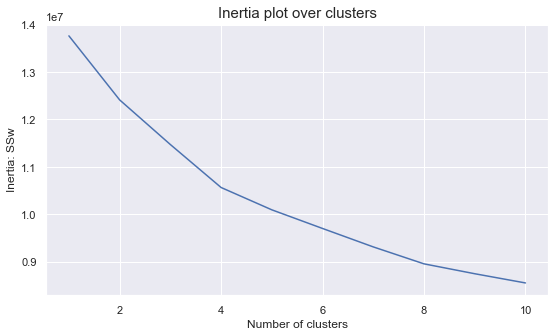

In [56]:
# Defining the number of clusters:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca.iloc[:,:45]) #df_pca.iloc[:,:45] is the dataframe that contains the first 45 principal components
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution
    
# The figure:
plt.figure(figsize=(9,5))
#This following step is to make sure that we plot the correct x axis´labels:
plot_df=pd.DataFrame(columns=['x','y'])
plot_df['x']=range(1, 11)
plot_df['y']=inertia

# The inertia plot:
plt.plot('x', 'y',data = plot_df)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

# By looking at the plot we conclude that the best number of clusters would be 4

In [57]:
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=0)
km_labels = kmclust.fit_predict(df_pca.iloc[:,:45])

# Data Frame with the original variables where we will store the clusters we obtained applying the kmeans on the Principal 
# components
df_concat = df.copy() 
df_concat['labels']=km_labels
df_concat

,,OSOURCE,TCODE,STATE,ZIP,MAILCODE,AGE,RECINHSE,RECP3,RECPGVG,RECSWEEP,...,MAXRDATE,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,labels
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,GRI,0,IL,61081,,0.050610,,,,,...,2014-02-01,0,L,4,E,X,X,X,C,0
1,148535,BOA,1,CA,91326,,-0.872931,,,,,...,2015-12-01,0,L,2,G,X,X,X,A,1
2,15078,AMH,1,NC,27017,,-0.252839,,,,,...,2012-07-01,1,L,4,E,X,X,X,C,0
3,172556,BRY,0,CA,95953,,0.710282,,,,,...,2014-11-01,1,L,4,E,X,X,X,C,0
5,47784,CWR,0,AL,35603,,0.288092,,,,,...,2014-12-01,0,L,1,F,X,X,X,C,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,LHJ,0,FL,32776-,,-0.609062,,,,,...,2011-03-01,0,L,4,D,X,X,X,C,0
95407,184568,ASE,1,AK,99504,,-0.345193,,,,,...,2016-02-01,0,L,1,G,X,X,X,C,1
95408,122706,DCD,1,TX,77379,,-0.740997,,,,,...,2016-03-01,1,L,1,F,X,X,X,A,1


#### Separating the cluster label variable from the independent numeric variables

In [58]:
# separating the target variable from the independent numeric variables:
data = df_concat[metric_features]
target = df_concat.iloc[:,-1]


### 8.4.1. Random Forest for feature selection <a class="anchor" id="8.4.1"></a>

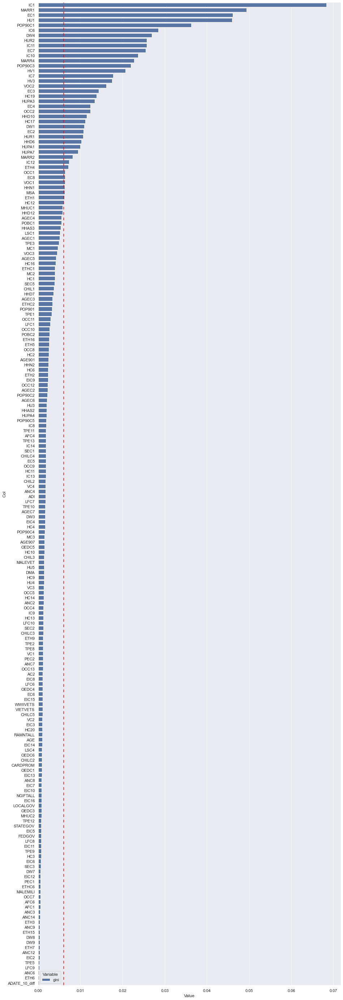

In [59]:
# Splitting the data into 30% test and 70% training (we are doing this step in order to check the accuracy score before and 
# after removing the features)
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.3, random_state=0, stratify=target)

# Create a random forest classifier
clf = RandomForestClassifier(n_estimators=500, random_state=0, n_jobs=-1)

# Training the classifier
clf.fit(X_train, y_train)
    
# Checking the attribute gini importance
gini_importance = clf.feature_importances_
zippy = pd.DataFrame(gini_importance, columns =['gini'])
zippy['col'] = data.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

# Plotting
plt.figure(figsize=(15,50))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)
plt.axvline(x=0.006, color='red', linestyle=(0,(5,5)))

In [60]:
# We are going to select the features that have an importance of more than 0.006
sfm = SelectFromModel(clf,threshold=0.006)

sfm.fit(X_train, y_train)

# which features are important:
selected_feat= data.columns[(sfm.get_support())]
print('The following ',len(selected_feat),'features were selected according to the random forest:')

# get the name of the features selected:
print(selected_feat)

# Dropped features:
print('\nThe following ',len(data.columns[~(sfm.get_support())]),'features should be dropped according to the random forest:')
print(data.columns[~(sfm.get_support())])

# Clusters prediction using all the features and checking its Accuracy score using the random forest
y_pred = clf.predict(X_test)
print('Score of the Random Forest using all features:',accuracy_score(y_test, y_pred))

The following  40 features were selected according to the random forest:
Index(['POP90C1', 'POP90C3', 'ETH1', 'ETH4', 'HHN1', 'MARR1', 'MARR2', 'MARR4',
       'DW1', 'DW4', 'HV1', 'HV3', 'HU1', 'HHD6', 'HHD10', 'HUR1', 'HUR2',
       'HUPA1', 'HUPA3', 'HUPA7', 'MSA', 'IC1', 'IC6', 'IC7', 'IC10', 'IC11',
       'IC12', 'OCC1', 'OCC2', 'EC1', 'EC2', 'EC3', 'EC4', 'EC7', 'EC8',
       'VOC1', 'VOC2', 'HC12', 'HC17', 'HC19'],
      dtype='object')

The following  154 features should be dropped according to the random forest:
Index(['AGE', 'MALEMILI', 'MALEVET', 'VIETVETS', 'WWIIVETS', 'LOCALGOV',
       'STATEGOV', 'FEDGOV', 'POP901', 'POP90C2',
       ...
       'HC14', 'HC16', 'HC20', 'MHUC1', 'MHUC2', 'AC2', 'ADATE_10_diff',
       'CARDPROM', 'RAMNTALL', 'NGIFTALL'],
      dtype='object', length=154)
Score of the Random Forest using all features: 0.9737852788837602


### 8.4.2. ExtraTrees for feature selection <a class="anchor" id="8.4.2"></a>

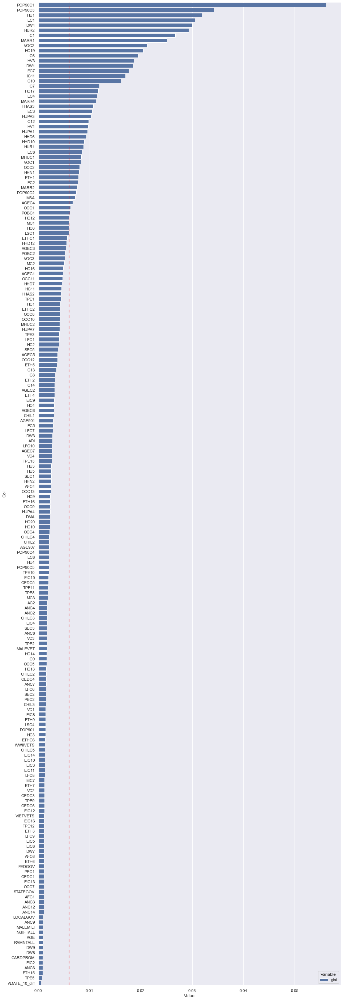

In [61]:
rtree_dr = ExtraTreesClassifier(n_estimators=500, random_state=0, n_jobs=-1)
rtree_dr = rtree_dr.fit(X_train, y_train)

# Checking the attribute gini importance
gini_importance = rtree_dr.feature_importances_
zippy = pd.DataFrame(gini_importance, columns =['gini'])
zippy['col'] = data.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

# Plotting
plt.figure(figsize=(15,50))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)
plt.axvline(x=0.006, color='red', linestyle=(0,(5,5)))

In [62]:
model2 = SelectFromModel(rtree_dr,threshold=0.006)
model2.fit(X_train, y_train)

# which features are important:
selected_feat2= data.columns[(model2.get_support())]
print('The following ',len(selected_feat2),'features were selected according to the ExtraTrees:\n', selected_feat2)

# Dropped features:
print('\nThe following ',len(data.columns[~(model2.get_support())]),'features should be dropped according to the ExtraTrees:')
print(data.columns[~(model2.get_support())])

# ExtraTreesClassifier Clusters prediction using all the features and checking its Accuracy score
y_pred = rtree_dr.predict(X_test)
print('Score using all features:',accuracy_score(y_test, y_pred))

The following  43 features were selected according to the ExtraTrees:
 Index(['POP90C1', 'POP90C2', 'POP90C3', 'ETH1', 'AGEC4', 'HHN1', 'MARR1',
       'MARR2', 'MARR4', 'DW1', 'DW4', 'HV1', 'HV3', 'HU1', 'HHD6', 'HHD10',
       'HUR1', 'HUR2', 'HUPA1', 'HUPA3', 'MSA', 'IC1', 'IC6', 'IC7', 'IC10',
       'IC11', 'IC12', 'HHAS3', 'OCC1', 'OCC2', 'EC1', 'EC2', 'EC3', 'EC4',
       'EC7', 'EC8', 'POBC1', 'VOC1', 'VOC2', 'HC12', 'HC17', 'HC19', 'MHUC1'],
      dtype='object')

The following  151 features should be dropped according to the ExtraTrees:
Index(['AGE', 'MALEMILI', 'MALEVET', 'VIETVETS', 'WWIIVETS', 'LOCALGOV',
       'STATEGOV', 'FEDGOV', 'POP901', 'POP90C4',
       ...
       'HC13', 'HC14', 'HC16', 'HC20', 'MHUC2', 'AC2', 'ADATE_10_diff',
       'CARDPROM', 'RAMNTALL', 'NGIFTALL'],
      dtype='object', length=151)
Score using all features: 0.9759698389767802


Dropping the variables based on the results of the Random Forest and the ExtraTrees (their intercept) and getting the score of the models after the removal

In [63]:
# Merging Random Forest and extraTrees results:
final_selected_feat = set(set(selected_feat2)|set(selected_feat))
variables_dropped = set(set(data.columns[~(sfm.get_support())])&set(data.columns[~(model2.get_support())]))
print(' The following', len(final_selected_feat),' variables were the final selected variables merging the 2 methods:\n',\
     final_selected_feat)

# Train and test Datasets that only contain the most important features:
X_important_train = X_train[final_selected_feat].copy()
X_important_test = X_test[final_selected_feat].copy()

# Score of the Random Forest using the final_selected_feat:
# Create a new random forest classifier for the most important features
clf_important = RandomForestClassifier(n_estimators=200, random_state=0, n_jobs=-1)
clf_important.fit(X_important_train, y_train)
y_important_pred = clf_important.predict(X_important_test)# Clusters prediction using only the selected features 
print('\nRANDOM FOREST Score using the final selected features:',accuracy_score(y_test, y_important_pred))

# Score of the ExtraTreesClassifier using the final_selected_feat:
# Create a new ExtraTreesClassifier for the most important features
clf2_important = ExtraTreesClassifier(n_estimators=200, random_state=0, n_jobs=-1)
clf2_important.fit(X_important_train, y_train)
y_important_pred2 = clf2_important.predict(X_important_test)
print('\nEXTRA TREES Score using the final selected features:',accuracy_score(y_test, y_important_pred2))

# Dropping the non important features:
df = df.drop(columns=variables_dropped)

#updating metric features list:
metric_features = update_metric_feat(df)[0]

# dropped variables print:
print('\The following', len(variables_dropped),'variables were removed:', variables_dropped)

 The following 45  variables were the final selected variables merging the 2 methods:
 {'MSA', 'HU1', 'HUPA1', 'HC17', 'AGEC4', 'HV1', 'IC12', 'OCC1', 'IC11', 'IC6', 'POBC1', 'DW4', 'HHD6', 'HUR2', 'OCC2', 'EC8', 'POP90C1', 'VOC2', 'HHAS3', 'EC4', 'VOC1', 'HUPA3', 'IC1', 'MARR2', 'EC1', 'MARR1', 'POP90C3', 'HC12', 'HC19', 'HHD10', 'EC7', 'ETH1', 'MARR4', 'DW1', 'EC3', 'HUR1', 'IC10', 'HUPA7', 'MHUC1', 'IC7', 'HV3', 'EC2', 'ETH4', 'POP90C2', 'HHN1'}

RANDOM FOREST Score using the final selected features: 0.9687114618935203

EXTRA TREES Score using the final selected features: 0.9692752193368803
\The following 149 variables were removed: {'TPE9', 'LOCALGOV', 'ETH3', 'VC1', 'LFC8', 'LFC10', 'AGEC6', 'HUPA4', 'OCC7', 'OCC9', 'VC3', 'LFC9', 'HC3', 'AGEC1', 'CHIL1', 'VIETVETS', 'POP90C4', 'ETH15', 'CHIL3', 'FEDGOV', 'ETHC2', 'HC4', 'IC8', 'SEC3', 'CHILC4', 'EIC9', 'ANC9', 'HHD7', 'EIC13', 'STATEGOV', 'ETHC1', 'NGIFTALL', 'LFC7', 'TPE10', 'AFC6', 'OEDC4', 'AGEC2', 'ETHC6', 'OCC11', 'TPE13', '

#### Second backup df:

In [64]:
df_backup=df.copy()

## 9. Dimensionality Reduction on the features we got left <a class="anchor" id="9"></a>


## 9.1. PCA <a class="anchor" id="9.1"></a>

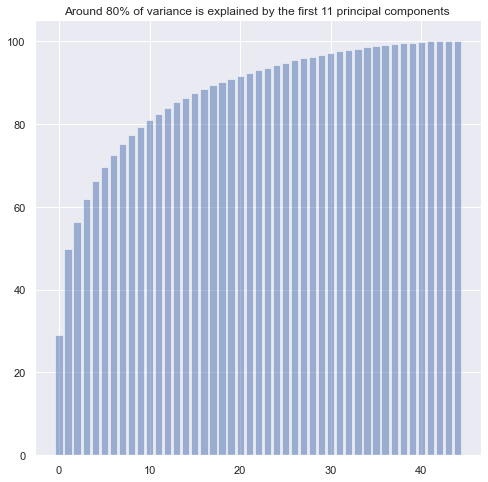

In [65]:
df_pca = df.copy()

# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])  

var_explained = pca.explained_variance_ratio_.cumsum()

pca.explained_variance_ratio_[:10].sum()

var_explained = var_explained*100 #percentage

fig, ax = plt.subplots(figsize=(8,8))
plt.bar(range(len(var_explained)), var_explained, label='Cumulative _Sum_of_Explained _Varaince', color = 'b',alpha=0.5)
plt.title("Around 80% of variance is explained by the first 11 principal components ");

In [66]:
cov_matrix = df_pca[metric_features].cov()
# cov_matrix

In [67]:
# Obtaining the projected observations on the principal components axes (linear combinations)
pd.DataFrame(df_pca[metric_features].values @ pca.components_.T, 
             index=df_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-0.687400,-3.591256,-0.318457,-0.886781,0.480250,0.686166,-0.942671,-1.786123,-0.200586,0.045678,...,-0.392135,-0.030131,-0.034292,0.311514,0.058368,-0.083538,0.165417,0.224898,-0.075969,-0.023199
1,148535,9.968580,1.858563,-1.623417,4.737038,-1.879822,2.501112,2.231748,-0.945831,-0.731943,-0.536454,...,0.150341,0.136773,0.345197,0.155869,-0.237455,1.074161,-0.035610,0.223993,0.075038,0.011941
2,15078,-2.505741,-3.611689,1.220986,1.552418,0.277542,0.428642,-0.239000,0.107558,-0.241738,-0.168198,...,-0.154670,0.257437,-0.158143,0.150203,0.024530,0.078672,-0.013196,0.035599,-0.021003,-0.012402
3,172556,-1.319154,-0.814257,0.121364,4.744801,-0.414941,1.004767,-0.249312,-1.166267,-0.934426,0.868172,...,-0.391201,-0.145827,-0.899860,-0.480527,1.273067,1.148130,0.122598,-0.084473,0.017888,-0.027759
5,47784,0.787797,-0.636401,-0.143994,-0.521818,0.176411,-0.070849,-0.603642,0.269890,0.164549,-0.193576,...,-0.180740,-0.086394,0.097583,-0.080866,0.048787,-0.027673,0.141112,-0.303719,0.003993,-0.007924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,-1.180841,-4.310509,1.576891,2.639932,-0.226059,-1.120641,-0.141523,0.513257,0.000973,-0.405684,...,-0.183293,-0.209017,-0.106394,0.064178,0.106854,-0.030993,0.294924,-0.086835,-0.042707,0.010570
95407,184568,1.916301,1.876739,0.516638,0.099140,-0.215104,-0.485770,0.209526,0.187105,1.466607,-1.093333,...,0.287758,-0.244755,-0.079855,0.402694,0.380906,0.221025,0.092593,-0.071962,0.014706,-0.000357
95408,122706,7.237965,-0.660443,1.040975,1.480457,1.041097,0.754654,0.839239,1.916971,0.011889,-1.134777,...,0.343929,0.567137,-0.082305,0.235823,-0.021128,0.776991,-0.160207,0.106742,-0.028836,-0.009804


In [68]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
).head(11)
# By kaiser´s rule (keep eigenvalue>1) ->>>> we should keep 9 PC
# By pearson´s rule (retain 80% of the variance) ->>>> we should keep 11 PC
# By merging these 2 rules , we decided to keep 10 PC´s

,Eigenvalue,Difference,Proportion,Cumulative
1,13.040098,0.000000,0.289777,0.289777
2,9.357321,-3.682777,0.207938,0.497715
3,2.898313,-6.459009,0.064406,0.562121
4,2.501873,-0.396440,0.055597,0.617718
5,2.015046,-0.486827,0.044778,0.662496
6,1.553547,-0.461499,0.034523,0.697019
7,1.316012,-0.237536,0.029244,0.726264
8,1.153530,-0.162481,0.025634,0.751897
9,0.987765,-0.165765,0.021950,0.773847
10,0.837483,-0.150282,0.018611,0.792458


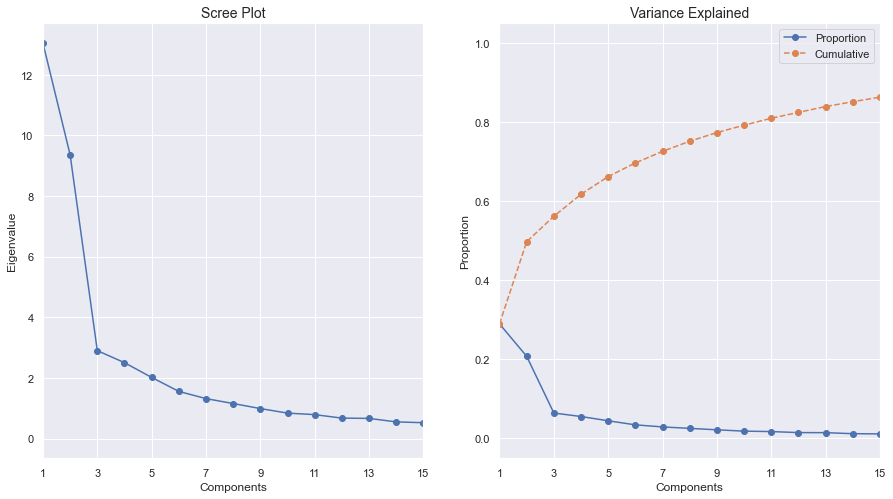

In [69]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, 15, 2))
ax1.set_xlim([0,14])
ax1.set_xticklabels(range(1, 16, 2))
ax2.set_xticks(range(0, 15, 2))
ax2.set_xticklabels(range(1, 16, 2))
ax2.set_xlim([0,14])
plt.show()

Here we are retaining 10 principal components:

In [70]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=10)
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  
pca_df

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
,CONTROLN,,,,,,,,,,
0,95515,-0.687400,-3.591257,-0.318401,-0.886766,0.480059,0.686994,-0.941811,-1.779275,-0.193402,0.040146
1,148535,9.968580,1.858562,-1.623432,4.737081,-1.880306,2.502743,2.232904,-0.934507,-0.728176,-0.541862
2,15078,-2.505741,-3.611689,1.220899,1.552296,0.277409,0.428444,-0.238713,0.107321,-0.239932,-0.170799
3,172556,-1.319154,-0.814256,0.121235,4.744637,-0.414887,1.004479,-0.248534,-1.166008,-0.933160,0.866347
5,47784,0.787797,-0.636401,-0.144008,-0.521891,0.176242,-0.070605,-0.603189,0.273283,0.168470,-0.191782
...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,-1.180842,-4.310511,1.577103,2.640190,-0.226037,-1.118162,-0.142071,0.525611,0.006379,-0.413140
95407,184568,1.916301,1.876740,0.516514,0.098975,-0.214878,-0.487245,0.209406,0.178977,1.466590,-1.090230
95408,122706,7.237966,-0.660440,1.040668,1.480215,1.042366,0.750471,0.834931,1.883412,-0.007360,-1.117352


In [71]:
# merging our PC´s to our variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca

,,OSOURCE,TCODE,STATE,ZIP,MAILCODE,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,...,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,GRI,0,IL,61081,,,,,,XXXX,...,-0.687400,-3.591257,-0.318401,-0.886766,0.480059,0.686994,-0.941811,-1.779275,-0.193402,0.040146
1,148535,BOA,1,CA,91326,,,,,,XXXX,...,9.968580,1.858562,-1.623432,4.737081,-1.880306,2.502743,2.232904,-0.934507,-0.728176,-0.541862
2,15078,AMH,1,NC,27017,,,,,,XXXX,...,-2.505741,-3.611689,1.220899,1.552296,0.277409,0.428444,-0.238713,0.107321,-0.239932,-0.170799
3,172556,BRY,0,CA,95953,,,,,,XXXX,...,-1.319154,-0.814256,0.121235,4.744637,-0.414887,1.004479,-0.248534,-1.166008,-0.933160,0.866347
5,47784,CWR,0,AL,35603,,,,,,XXXX,...,0.787797,-0.636401,-0.144008,-0.521891,0.176242,-0.070605,-0.603189,0.273283,0.168470,-0.191782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,LHJ,0,FL,32776-,,,,,,XXXX,...,-1.180842,-4.310511,1.577103,2.640190,-0.226037,-1.118162,-0.142071,0.525611,0.006379,-0.413140
95407,184568,ASE,1,AK,99504,,,,,,XXXX,...,1.916301,1.876740,0.516514,0.098975,-0.214878,-0.487245,0.209406,0.178977,1.466590,-1.090230
95408,122706,DCD,1,TX,77379,,,,,,XXXX,...,7.237966,-0.660440,1.040668,1.480215,1.042366,0.750471,0.834931,1.883412,-0.007360,-1.117352


Interpretation of the PC's and Loadings:

In [72]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

#Interpreting each Principal Component
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
POP90C1,0.328373,0.626303,-0.322940,-0.085978,-0.282668,-0.324852,-0.130255,0.234401,-0.187699,0.039125
POP90C2,-0.183057,-0.093623,0.072926,-0.368038,0.129563,0.558481,0.430996,-0.163354,0.391050,-0.019400
POP90C3,-0.204706,-0.668925,0.416313,0.338282,0.072339,0.010682,-0.214605,-0.156023,-0.098403,-0.026484
ETH1,0.309996,-0.273132,0.563936,-0.412565,-0.128694,-0.196848,0.107856,-0.204866,-0.133735,-0.147384
ETH4,0.208848,0.333218,-0.248311,0.410514,-0.233082,0.114972,0.136287,-0.336248,0.086581,0.300602
AGEC4,0.567931,-0.360044,0.097435,0.164654,-0.194411,0.227781,-0.239449,0.148098,0.109749,-0.198392
HHN1,-0.434622,0.618132,0.448851,-0.212429,0.005395,0.013244,0.045416,0.008281,-0.200151,-0.065911
MARR1,0.545276,-0.657121,0.169365,-0.148950,-0.253896,-0.015639,0.152374,-0.140363,-0.068784,0.020377
MARR2,-0.447076,0.518728,0.112607,-0.060236,-0.335926,-0.024716,-0.151051,0.285311,0.224344,-0.155882
MARR4,-0.170444,0.625252,0.029978,0.173211,-0.199129,0.243426,-0.471434,0.020564,0.157196,0.148144


### 9.2. Removing Outliers Again <a class="anchor" id="9.2"></a>

We are doing this step again in order to only use the important features to do it and not the removed ones.
#### IQR & z-score & DBSCAN 

##### 9.2.1. DBSCAN <a class="anchor" id="9.2.1"></a>

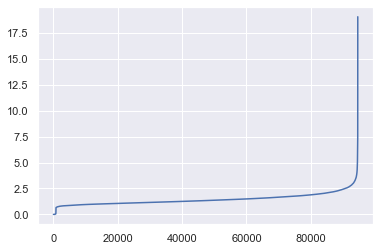

In [73]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20) # we have 10 PCAs so the number of neighbors is 2*10=20
neigh.fit(pca_df)
distances, _ = neigh.kneighbors(pca_df)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [74]:
dbscan = DBSCAN(eps=2.6, min_samples=20, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(pca_df)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 6


In [75]:
np.unique(dbscan_labels)

array([-1,  0,  1,  2,  3,  4], dtype=int64)

In [76]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,MARR4,...,EC7,EC8,POBC1,VOC1,VOC2,HC12,HC17,HC19,MHUC1,dbscan_labels
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-1.235585,0.684408,0.968989,0.335713,-0.412481,0.681127,-0.409731,0.215876,-0.826652,-0.445990,...,-1.037718,-0.621070,-0.374364,0.335795,0.884431,-0.571345,-1.748311,-0.898774,-0.608586,0
1,148535,0.851979,-0.436514,-0.653813,-0.862257,4.030433,2.086732,-1.618191,0.843044,-1.500003,0.132920,...,1.641353,1.803594,3.683136,0.583860,1.691097,-0.571345,0.575259,0.760969,3.391096,0
2,15078,-1.235585,-0.372461,1.792872,0.527389,-0.412481,0.446859,-0.150775,0.372668,-0.377751,-0.445990,...,-0.934677,-0.621070,-0.478403,0.005042,0.239099,-0.073912,-2.135572,-1.545793,0.248489,0
3,172556,-1.235585,-0.180303,1.643075,-1.149770,1.164037,0.681127,0.021862,0.372668,-0.377751,0.017138,...,-1.140760,-0.335816,2.330636,0.170418,-0.944010,1.252576,-2.100367,-1.405137,2.248329,0
5,47784,0.472422,-0.436514,-0.179456,0.383632,-0.269161,0.681127,-0.237094,0.529460,-0.377751,-0.214426,...,0.095735,0.092066,-0.582441,0.335795,0.615543,-0.073912,0.504847,-0.336149,0.248489,0


In [77]:
# Detecting noise (potential outliers)
df.loc[df_concat['dbscan_labels'] == -1]

,,OSOURCE,TCODE,STATE,ZIP,MAILCODE,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,...,MINRDATE,MAXRDATE,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
39,82335,WKB,0,MN,55066-,,,,,,XXXX,...,2008-02-01,2015-10-01,0,L,1,G,X,X,X,D
105,142846,VIK,0,CA,90024,,,,,,XXXX,...,2014-09-01,2015-12-01,0,L,2,G,X,X,X,A
296,116918,IMP,0,TX,75208,,,,,,XXXX,...,2007-02-01,2015-01-01,0,L,2,F,X,X,X,A
339,14789,MBC,4,HI,96745,,X,,,,XXXX,...,2013-04-01,2015-08-01,0,L,1,F,X,X,X,C
345,162372,L21,1,CA,94040,,,,,,XXXX,...,2015-09-01,2015-12-01,1,L,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94971,184982,HAN,28,AK,99829,,,,,,XXXX,...,2012-11-01,2015-12-01,0,L,1,G,X,X,X,A
95190,12779,SSS,1,CA,92239,,X,,,,XXXX,...,2014-11-01,2016-02-01,0,L,4,E,X,X,X,A
95217,98019,IMP,0,IL,62301,,,,,,XXXX,...,2008-04-01,2014-12-01,1,L,3,E,X,X,X,C


#### 9.2.2. Merging IQR, Z score and DBSCAN to detect outleirs  <a class="anchor" id="9.2.2"></a>

In [78]:
aux_df = df.copy()

aux_df['outlier_z_score?']=False
aux_df['outlier_iqr?']=False

for feature in metric_features:
    aux_df['outlier_z_score?'] = aux_df['outlier_z_score?']|z_score_outlier_detection(aux_df,feature)
    aux_df['outlier_iqr?'] = aux_df['outlier_iqr?']|iqr_outlier_detection(aux_df,feature)
   
aux_df['outlier_dbscan?'] = df_concat['dbscan_labels'].apply(lambda x: True if x==-1 else False)
aux_df['outliers_merging_methods']=aux_df['outlier_z_score?'] & aux_df['outlier_iqr?'] & aux_df['outlier_dbscan?']

print('% to be eliminated =',(aux_df['outliers_merging_methods'].sum()/len(df))*100,'%')

% to be eliminated = 0.9207090834134947 %


In [79]:
# Data Frame that contains the observations that are outliers:
outliers_df2 = df_after_imputation[aux_df['outliers_merging_methods']==True].copy() # we´re using df_after_imputation because
                                                                                    # we want to have the original values stored
                                                                                    # and not the scaled ones
# we only want the features that remain after the feature selection
outliers_df = outliers_df[metric_features + non_metric_features] # *outliers_df is the df where we stored the outliers we found at the beginning
outliers_df2 = outliers_df2[metric_features + non_metric_features]

# Concatenating the observations that are outliers to the ones we found initially
outliers_df = pd.concat([outliers_df, outliers_df2])

# Keeping only the observations that are not outliers:
df = df[aux_df['outliers_merging_methods']==False]

print('Total % of observations removed since the beginning=',(1-(len(df)/numero_obs_original))*100,'%')

outliers_df

Total % of observations removed since the beginning= 1.762880979331738 %


,,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,MARR4,...,MINRDATE,MAXRDATE,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
4,7112,99,0,0,2,0,15,16,42,17,33,...,2013-10-01,2016-01-01,1,L,2,F,X,X,X,A
82,116325,99,0,0,80,0,14,28,48,21,26,...,2014-09-01,2015-05-01,1,L,3,E,X,X,X,A
120,111234,0,99,0,65,4,2,2,61,4,35,...,2014-09-01,2015-04-01,0,L,4,E,X,X,X,D
168,137726,99,0,0,54,3,1,3,35,6,59,...,2016-01-01,2016-01-01,1,L,1,F,X,X,X,B
305,188966,99,0,0,58,35,12,59,30,13,48,...,2008-08-01,2014-02-01,1,L,2,E,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94971,184982,0,5,95,65,1,15,27,51,18,28,...,2012-11-01,2015-12-01,0,L,1,G,X,X,X,A
95190,12779,0,0,99,58,1,8,21,29,13,56,...,2014-11-01,2016-02-01,0,L,4,E,X,X,X,A
95217,98019,0,99,0,95,2,9,75,17,24,29,...,2008-04-01,2014-12-01,1,L,3,E,X,X,X,C



# 10. Categorical Features <a class="anchor" id="10"></a>

### 10.1. Single Value Features <a class="anchor" id="10.1"></a>

In [80]:
# get number of unique values for each column using numpy
counts = list(df.nunique())
names = list(df.nunique().index)

def create_dict(keys, values): 
    return dict(zip(keys, values + [None] * (len(keys) - len(values))))
columns = create_dict(names, counts)

# record columns to delete
to_del = dict((k, v) for k, v in columns.items() if v == 1) 
to_del

{'RFA_2R': 1}

### 10.2. Remove the variables that for one category have more than 90% of the observations <a class="anchor" id="10.2"></a>

In [81]:
to_drop=[]
for feature in non_metric_features:
    for proportion in df[feature].value_counts()/len(df):
        if proportion > 0.90:
            to_drop.append(feature)
            break

print('The non metric features that have more than 90% in one of their categories/unique values (to be dropped because \
of their redundancy) are the following:\n',to_drop)

df.drop(columns=to_drop, inplace=True)

# updating non metric features list:
non_metric_features = update_metric_feat(df)[1]

The non metric features that have more than 90% in one of their categories/unique values (to be dropped because of their redundancy) are the following:
 ['MAILCODE', 'RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'MDMAUD', 'CHILD03', 'CHILD07', 'CHILD12', 'CHILD18', 'SOLP3', 'SOLIH', 'MAJOR', 'COLLECT1', 'BIBLE', 'CATLG', 'HOMEE', 'PHOTO', 'CRAFTS', 'FISHER', 'BOATS', 'KIDSTUFF', 'CARDS', 'PLATES', 'MAXADATE', 'RFA_2R', 'MDMAUD_R', 'MDMAUD_F', 'MDMAUD_A']


### 10.3 Drop the categorical features with high variability , in case none of its categories have more than 10% 
<a class="anchor" id="10.3"></a>

In [82]:
to_drop=[]
for feature in non_metric_features:
    aux =[]
    for proportion in df[feature].value_counts()/len(df):
        if proportion < 0.10:
            aux.append(proportion)
    if len(aux)==len(df[feature].value_counts()): # if all categories have less than 10%;
        to_drop.append(feature)

print('The non metric features that have less than 10% in all of their categories/unique values (to be dropped because \
of their redundancy) are the following:\n',to_drop)

df.drop(columns=to_drop, inplace=True)

# updating non metric features list:
non_metric_features = update_metric_feat(df)[1]

The non metric features that have less than 10% in all of their categories/unique values (to be dropped because of their redundancy) are the following:
 ['OSOURCE', 'ZIP', 'MINRDATE']


### 10.4 Plotting the cardinality of each variable <a class="anchor" id="10.4"></a>

Text(0.5, 1.0, 'Cardinality')

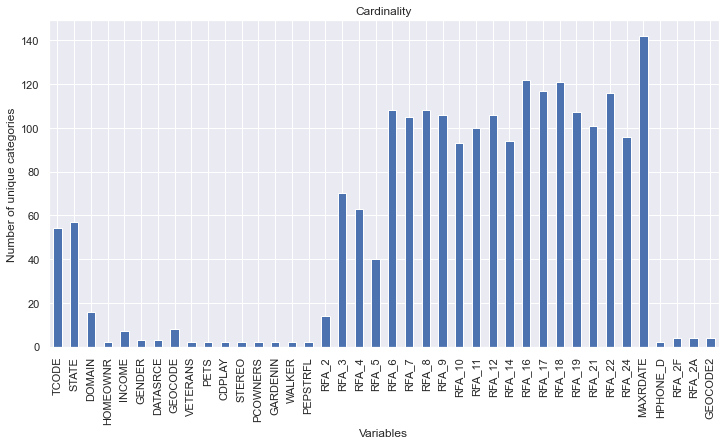

In [83]:
# plot with the cardinality of each variable

df[non_metric_features].nunique().plot.bar(figsize=(12,6))
plt.ylabel('Number of unique categories')
plt.xlabel('Variables')
plt.title('Cardinality')

### 10.5 Plotting pie charts of each variable <a class="anchor" id="10.5"></a>

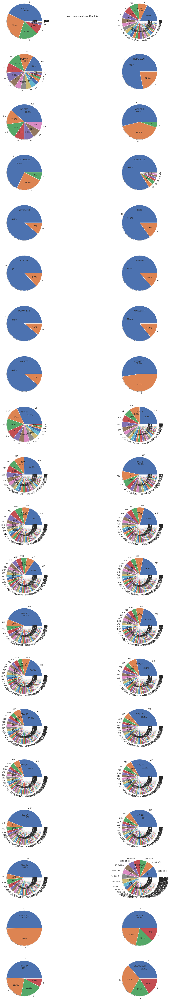

In [84]:
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(20, 2, figsize=(20, 80))

# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    ax.pie(df[feat].value_counts().values,labels=df[feat].value_counts().index,autopct='%1.1f%%', shadow=True, radius=2)
    ax.set_title(feat)
fig.tight_layout()
# Layout
# Add a centered title to the figure:
title = " Non metric features Pieplots"
plt.suptitle(title)
plt.show()

### 10.6  Reducing the cardinality <a class="anchor" id="10.6"></a>

In [85]:
# We are merging the categories that have a frequency of observations lower than 10% in the category 'OTHER'
for feature in non_metric_features:
    serie=df[feature].value_counts()/len(df)
    top = df[feature].value_counts()[:len(serie[serie>=0.10])].index
    df.loc[~df[feature].isin(top), feature] = 'OTHER'

#### Third Backup df:

In [86]:
df_backup2=df.copy()

### 10.7 Getting Dummies <a class="anchor" id="10.7"></a>

In [87]:
df_categ = pd.get_dummies(df[non_metric_features])
df_categ.head()

,,TCODE_0,TCODE_1,TCODE_2,TCODE_OTHER,STATE_CA,STATE_OTHER,DOMAIN_OTHER,DOMAIN_R2,DOMAIN_S1,DOMAIN_T2,...,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C,GEOCODE2_D
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,1,0,0,0,0,1,0,0,0,1,...,0,1,1,0,0,0,0,0,1,0
1,148535,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0
2,15078,0,1,0,0,0,1,0,1,0,0,...,0,1,1,0,0,0,0,0,1,0
3,172556,1,0,0,0,1,0,0,1,0,0,...,0,1,1,0,0,0,0,0,1,0
5,47784,1,0,0,0,0,1,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0


In [88]:
df = pd.merge(df[metric_features],df_categ.iloc[:,:-1],left_index=True,right_index=True)
df.head()

,,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,MARR4,...,RFA_2F_2,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-1.235585,0.684408,0.968989,0.335713,-0.412481,0.681127,-0.409731,0.215876,-0.826652,-0.445990,...,0,0,1,1,0,0,0,0,0,1
1,148535,0.851979,-0.436514,-0.653813,-0.862257,4.030433,2.086732,-1.618191,0.843044,-1.500003,0.132920,...,1,0,0,0,0,1,0,1,0,0
2,15078,-1.235585,-0.372461,1.792872,0.527389,-0.412481,0.446859,-0.150775,0.372668,-0.377751,-0.445990,...,0,0,1,1,0,0,0,0,0,1
3,172556,-1.235585,-0.180303,1.643075,-1.149770,1.164037,0.681127,0.021862,0.372668,-0.377751,0.017138,...,0,0,1,1,0,0,0,0,0,1
5,47784,0.472422,-0.436514,-0.179456,0.383632,-0.269161,0.681127,-0.237094,0.529460,-0.377751,-0.214426,...,0,0,0,0,1,0,0,0,0,1


## 11. Reassigning df to contain pca variables so we can use them for our clustering
<a class="anchor" id="11"></a>

In [89]:
df_preprocessed = pd.concat([pca_df,df],join='inner' ,axis=1) # merging our PC´s to our variables
df_preprocessed.head()
# *this data set contains our PC´s, metric features and categorical variables transformed into dummies

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,RFA_2F_2,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-0.687400,-3.591257,-0.318401,-0.886766,0.480059,0.686994,-0.941811,-1.779275,-0.193402,0.040146,...,0,0,1,1,0,0,0,0,0,1
1,148535,9.968580,1.858562,-1.623432,4.737081,-1.880306,2.502743,2.232904,-0.934507,-0.728176,-0.541862,...,1,0,0,0,0,1,0,1,0,0
2,15078,-2.505741,-3.611689,1.220899,1.552296,0.277409,0.428444,-0.238713,0.107321,-0.239932,-0.170799,...,0,0,1,1,0,0,0,0,0,1
3,172556,-1.319154,-0.814256,0.121235,4.744637,-0.414887,1.004479,-0.248534,-1.166008,-0.933160,0.866347,...,0,0,1,1,0,0,0,0,0,1
5,47784,0.787797,-0.636401,-0.144008,-0.521891,0.176242,-0.070605,-0.603189,0.273283,0.168470,-0.191782,...,0,0,0,0,1,0,0,0,0,1



# 12. Clustering <a class="anchor" id="12"></a> <a class="anchor" id="12"></a>

In [90]:
df = df_preprocessed.copy()

In [91]:
# Splitting feature names into groups
pc_features = df.columns[df.columns.str.startswith('PC') & ~df.columns.str.startswith('PCOWNERS')].tolist()

# non metric features as dummies:
non_metric_features = df.columns[(~df.columns.isin(metric_features)) & ~(df.columns.isin(pc_features))].tolist()

# non metric features in their categorical form:
non_metric_features_no_dummy = df_backup2.loc[:,~(df_backup2.columns.isin(metric_features))].columns.tolist()

##  <font color='red'> 12.1 Final Hierarchical clustering solution [Kmeans] <a class="anchor" id="12.1"></a>

### 12.1.1. Checking the optimal number of clusters using the kmeans silhouette analysis <a class="anchor" id="12.1.1"></a>

For n_clusters = 2, the average silhouette_score is : 0.2413900095931529
For n_clusters = 3, the average silhouette_score is : 0.25679233268255197
For n_clusters = 4, the average silhouette_score is : 0.23262824739880059
For n_clusters = 5, the average silhouette_score is : 0.23512937262442615
For n_clusters = 6, the average silhouette_score is : 0.2266026193567101
For n_clusters = 7, the average silhouette_score is : 0.21809973314031136
For n_clusters = 8, the average silhouette_score is : 0.2179978983398911
For n_clusters = 9, the average silhouette_score is : 0.21908410272924161
For n_clusters = 10, the average silhouette_score is : 0.19699321701948413


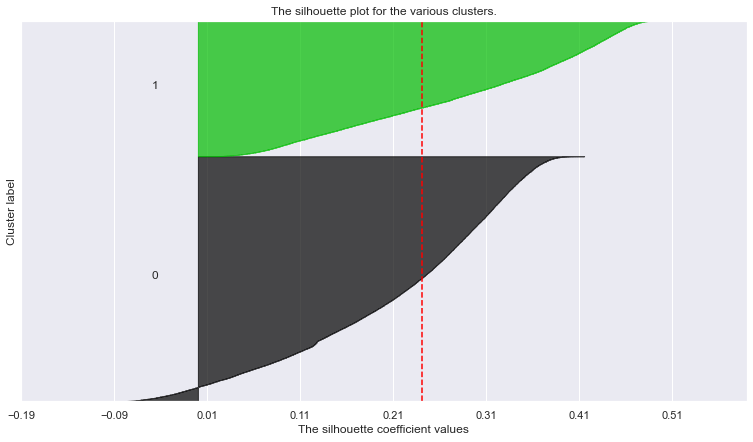

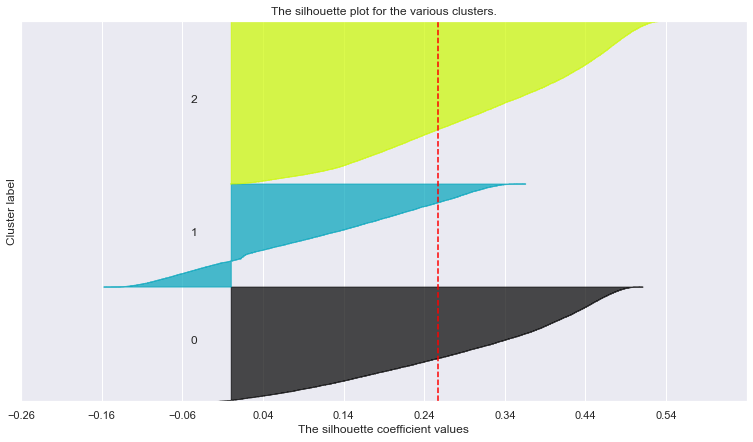

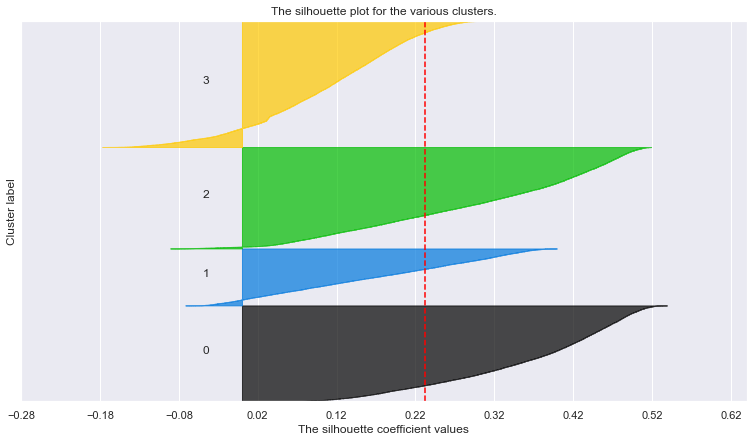

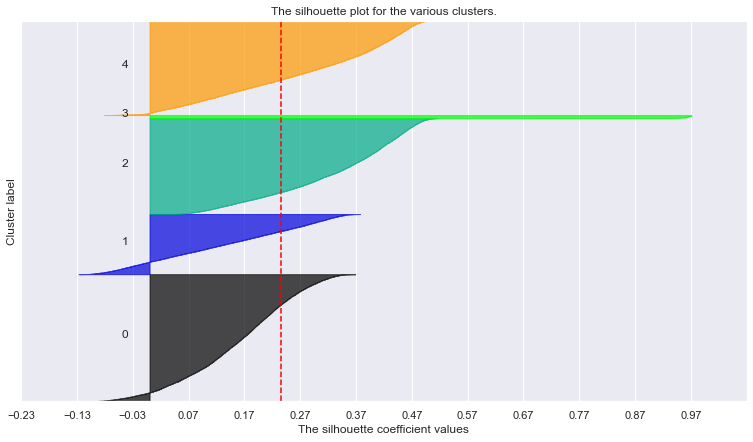

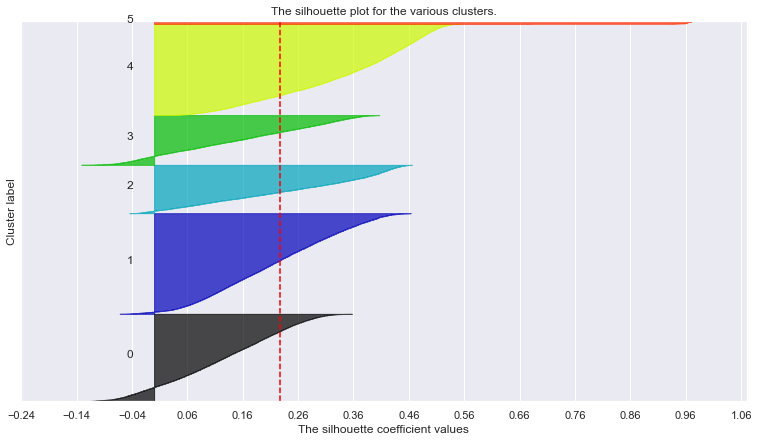

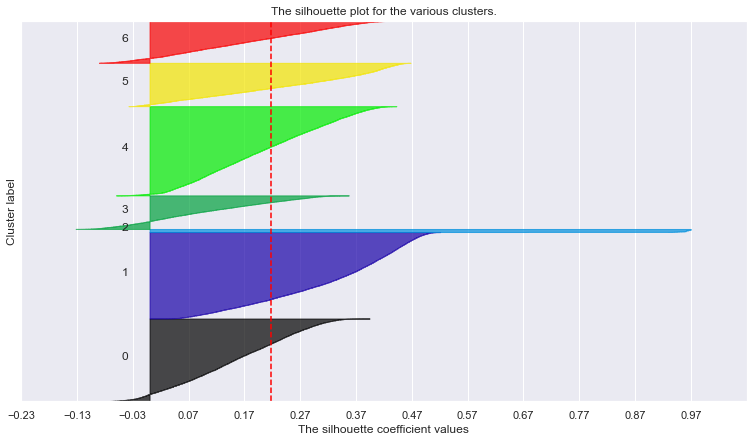

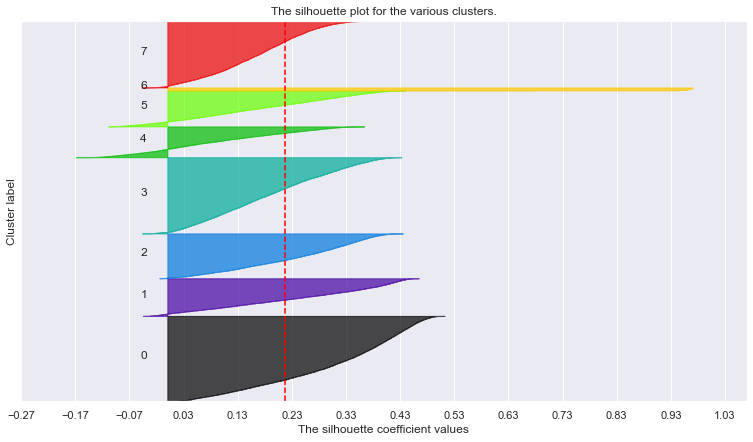

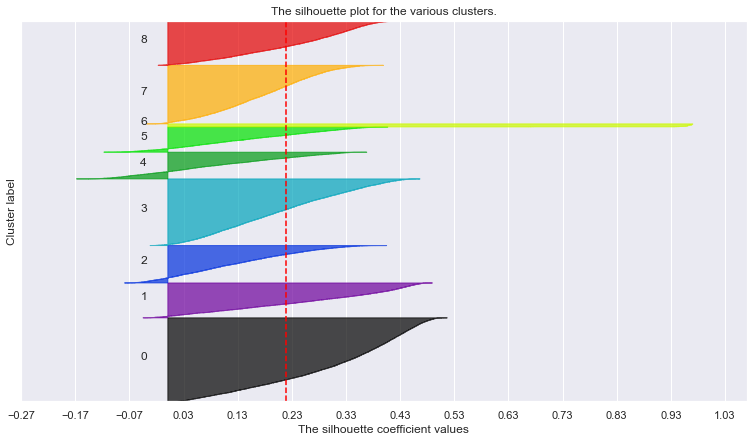

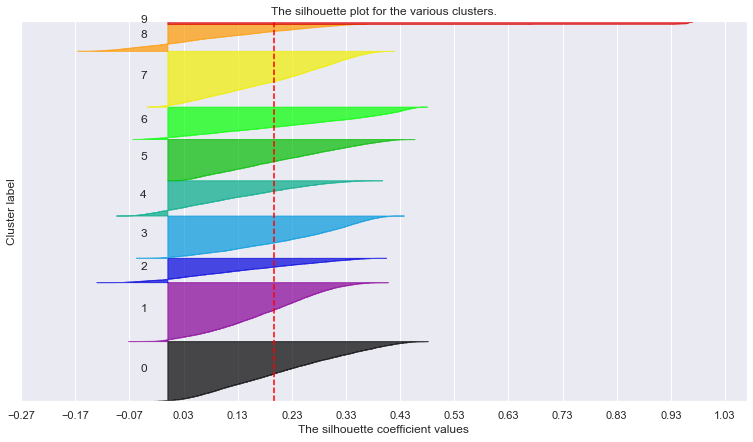

In [92]:
# Adapted from lab class
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df[pc_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df[pc_features], cluster_labels, random_state=0)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[pc_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[pc_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

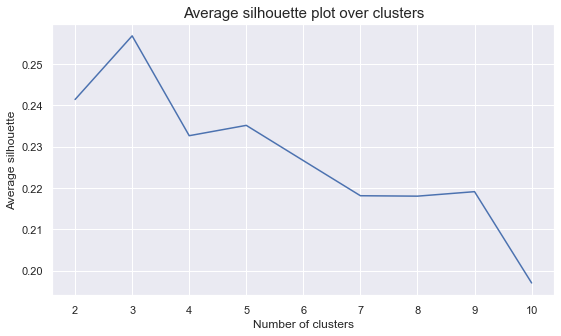

In [93]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))

#This following step is to make sure that we plot the correct x axis´labels:
plot_df=pd.DataFrame(columns=['x','y'])
plot_df['x']=range(2, 11)
plot_df['y']=avg_silhouette

# The inertia plot:
plt.plot('x', 'y',data = plot_df)#inertia
# plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

# conclusion: 3 clusters, because the average silhouette score is max for this value as we can observe by looking at the plot

### 12.1.2. Defining Kmeans <a class="anchor" id="12.1.2"></a>

Applying Kmeans clustering and getting the cluster' labels of each record

In [94]:
kmclust = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=1) 
kmeans_labels = kmclust.fit_predict(df[pc_features])
kmeans_labels

array([2, 0, 2, ..., 0, 1, 0])

Calculating the mean of our metric features for each cluster

In [95]:
df_concat = df.copy()
df_concat['k_means_labels'] = kmeans_labels

df_final_kmeans = df_not_standardized.loc[df_concat.index,:]
df_final_kmeans = pd.concat([df[pc_features],df_final_kmeans],axis=1)

df_final_kmeans['k_means_labels']=kmeans_labels

#we also want to compare the clusters with the population:
aux_merge=df_final_kmeans[metric_features].mean()
aux_merge.name='Population'

pd.concat([df_final_kmeans[metric_features+['k_means_labels']].groupby('k_means_labels').mean(),pd.DataFrame(aux_merge).T]).T

,0,1,2,Population
POP90C1,85.338524,85.071490,23.044831,58.626054
POP90C2,5.458950,9.823105,21.606826,13.546741
POP90C3,8.390473,1.245628,54.719215,26.267865
ETH1,89.375858,72.763156,89.976923,85.133138
ETH4,4.853316,4.035529,0.599940,2.812835
AGEC4,16.745806,10.752954,14.405474,14.121711
HHN1,16.345177,32.551087,20.726998,22.608663
MARR1,65.129521,43.950095,62.822423,58.406156
MARR2,8.451093,14.448873,9.801567,10.653206
MARR4,21.230837,29.429770,19.561920,22.737907


Number of records in each cluster

In [96]:
df_final_kmeans['k_means_labels'].value_counts()

2    40084
0    28258
1    25388
Name: k_means_labels, dtype: int64

Metric Features relevant to interpret based on their loadings, getting the top10 correlated features to the PC´s (in case their corr>55%)

In [97]:
variables_to_interpret=[]
for pc in loadings.columns: 
    top10 = abs(loadings[pc]).sort_values(ascending=False)[:10]
    variables_to_interpret.extend(top10[top10>0.55].index)

print('The following', len(set(variables_to_interpret)), 'variables will be used to interpret the clusters\n',variables_to_interpret)

The following 23 variables will be used to interpret the clusters
 ['IC1', 'IC11', 'HUR2', 'IC6', 'IC10', 'HHAS3', 'EC7', 'HV3', 'IC12', 'OCC2', 'DW4', 'HHD6', 'HU1', 'HC19', 'HHD10', 'POP90C3', 'MARR1', 'POP90C1', 'MARR4', 'HHN1', 'ETH1', 'VOC1', 'POP90C2']


### 12.1.3. Visual Analysis of the metric features´ results <a class="anchor" id="12.1.3"></a>

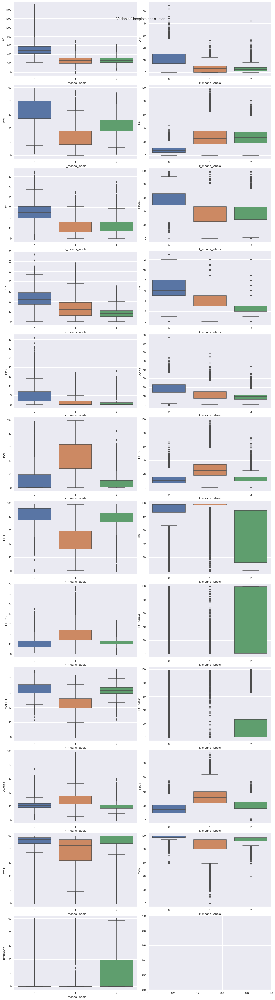

In [98]:
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(12,2, figsize=(15,55))
fig.tight_layout()
# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="k_means_labels", y=feat, data=df_final_kmeans,ax=ax)

# Layout
# Add a centered title to the figure:
title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

### 12.1.4. Kmeans Clustering solution interpretation for the Categorical Variables <a class="anchor" id="12.1.4"></a>

In [99]:
aux_df2=df_backup2[non_metric_features_no_dummy].copy()
aux_df2['k_means_labels']=df_final_kmeans['k_means_labels'].copy()

#### 12.1.4.1. Contingency table: Categories vs Clusters and Chi-square test of independence <a class="anchor" id="12.1.4.1"></a>

In [100]:
not_important=[]
for feature in non_metric_features_no_dummy:
    # Contingency table
    contingency = pd.crosstab(aux_df2[feature], aux_df2['k_means_labels'])

    # Chi-square test of independence: null hypothesis the categorical feature is independent from the cluster
    # ->if we reject then the feature is important for our model
    c, p, dof, expected = chi2_contingency(contingency)
    
    if p>0.05:
        not_important.append(feature)
        
print('The following variables were dropped according to the Chi-square test of independence:\n',not_important)

non_metric_features_no_dummy=[i for i in non_metric_features_no_dummy if i not in not_important]

for feature in non_metric_features:
    for var in not_important:
        if var in feature:
            non_metric_features.remove(feature)

The following variables were dropped according to the Chi-square test of independence:
 ['RFA_6', 'RFA_7', 'MAXRDATE']


#### 12.1.4.2. Frequency and Proportion barcharts of the categorical features and clusters obtained before <a class="anchor" id="12.1.4.2"></a>

In [101]:
# Proportions of the categories of the categorical features among donors
aux_df3=df_preprocessed[non_metric_features].copy()
aux_df3['k_means_labels']=df_final_kmeans['k_means_labels'].copy()

aux_merge2=aux_df3.mean()
aux_merge2.name='Population' # so that we can compare the proportions of the non metric with the population of donors

pd.concat([aux_df3[non_metric_features+['k_means_labels']].groupby('k_means_labels').mean()*100,pd.DataFrame(aux_merge2).T]).T.iloc[:-1,:]

,0,1,2,Population
TCODE_0,42.472928,44.544667,42.124040,0.428849
TCODE_1,28.144242,25.315110,27.015767,0.268953
TCODE_2,17.188053,16.421144,19.259555,0.178662
TCODE_OTHER,12.194777,13.719080,11.600639,0.123536
STATE_CA,29.545615,24.361903,5.850215,0.180081
...,...,...,...,...
RFA_2A_G,23.688867,20.273357,17.642950,0.201782
RFA_2A_OTHER,6.023073,7.688672,9.160762,0.078161
GEOCODE2_A,56.706066,49.393414,13.798523,0.363758
GEOCODE2_B,32.872107,33.362218,25.646143,0.299146


In [102]:
def bar_charts_categorical(df, feature, target):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
#     print(cont_tab)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    
    p3 = plt.bar(categories, cont_tab.iloc[:-1, 2].values, 0.55, bottom=cont_tab.iloc[:-1, 0]+cont_tab.iloc[:-1, 1], color="blue")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="yellowgreen")
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    plt.legend((p3[0], p2[0], p1[0]), ('$y_i=2$','$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart\n"+feature.upper())
    plt.xticks(rotation=90 )
    plt.ylabel("$Frequency$")

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 3].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 3].values),
                       np.divide(cont_tab.iloc[:-1, 2].values, cont_tab.iloc[:-1, 3].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="yellowgreen")
    p3 = plt.bar(categories, obs_pct[2], 0.55, bottom=obs_pct[0]+obs_pct[1], color="blue")
    plt.legend((p3[0],p2[0], p1[0]), ('$y_i=2$','$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart\n" + feature.upper())
    plt.xticks(rotation=90 )
    plt.ylabel("$p$")

    plt.show()

VARIABLE: TCODE


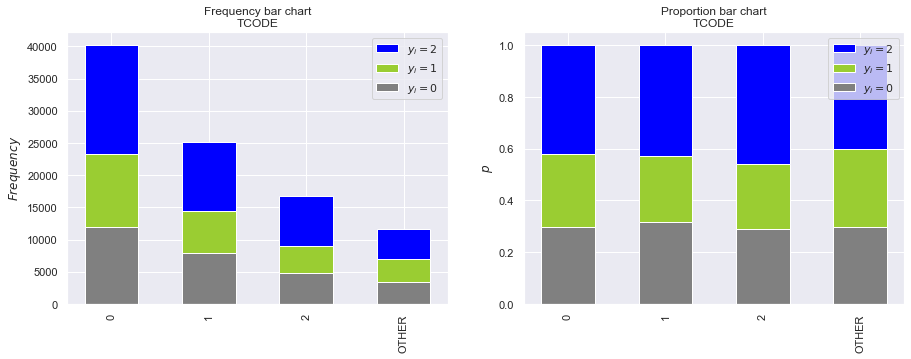

VARIABLE: STATE


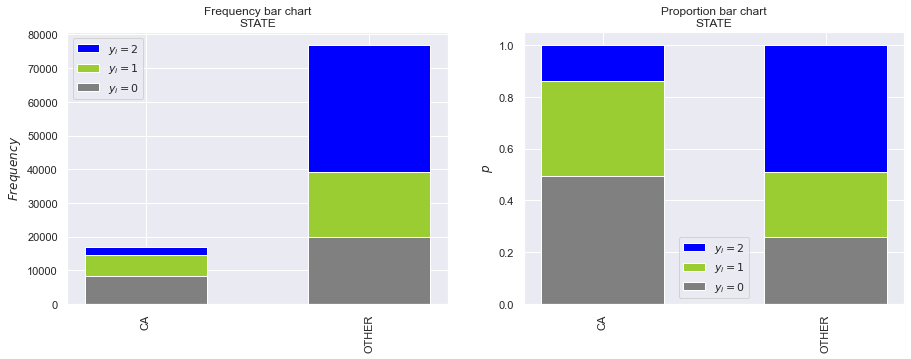

VARIABLE: DOMAIN


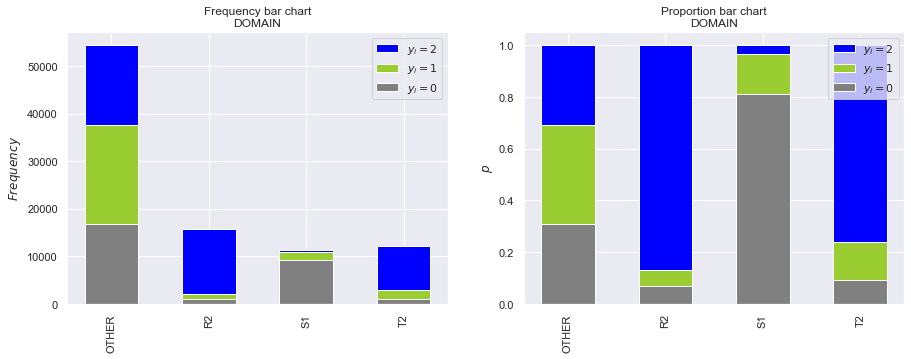

VARIABLE: HOMEOWNR


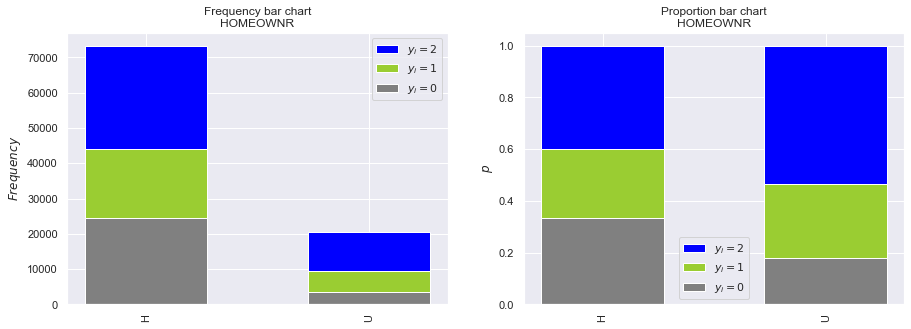

VARIABLE: INCOME


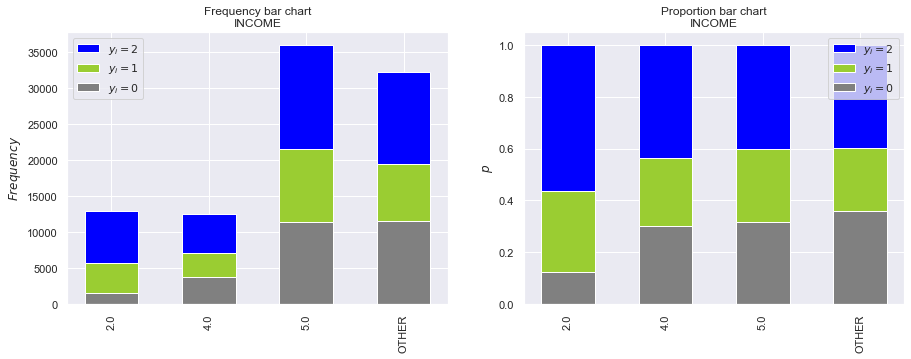

VARIABLE: GENDER


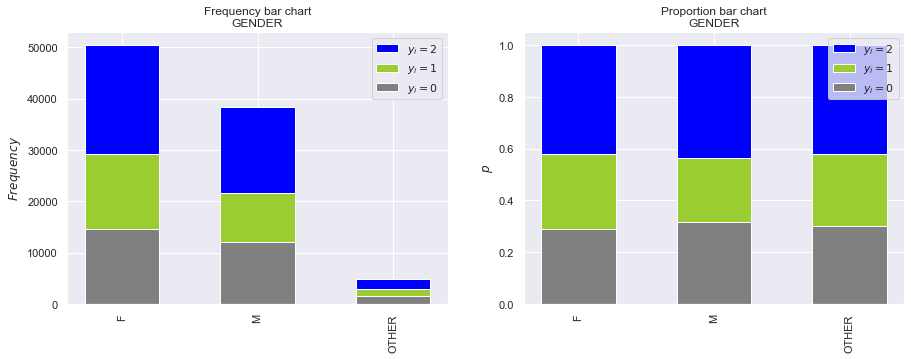

VARIABLE: DATASRCE


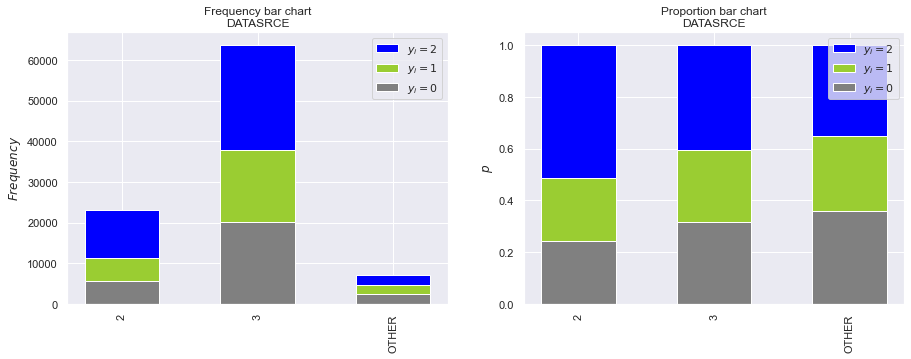

VARIABLE: GEOCODE


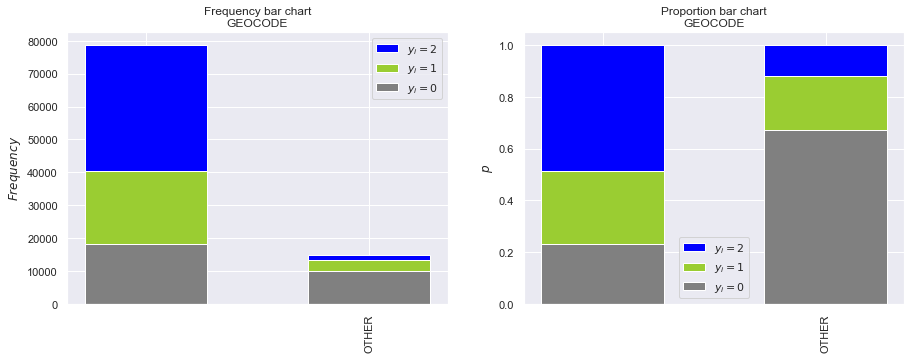

VARIABLE: VETERANS


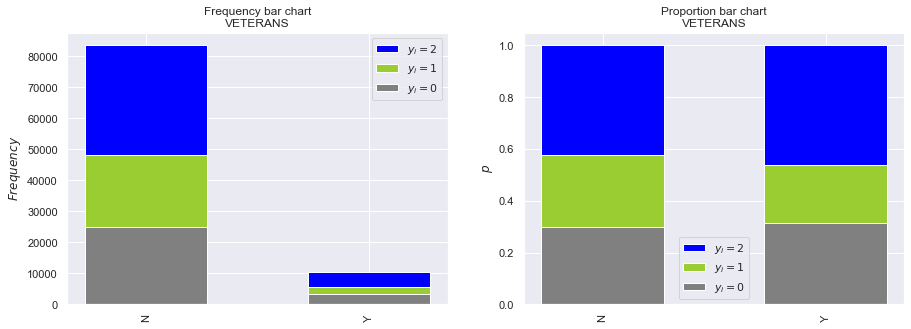

VARIABLE: PETS


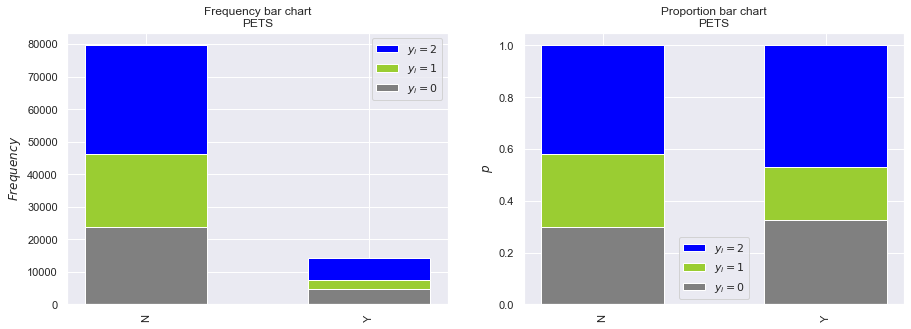

VARIABLE: CDPLAY


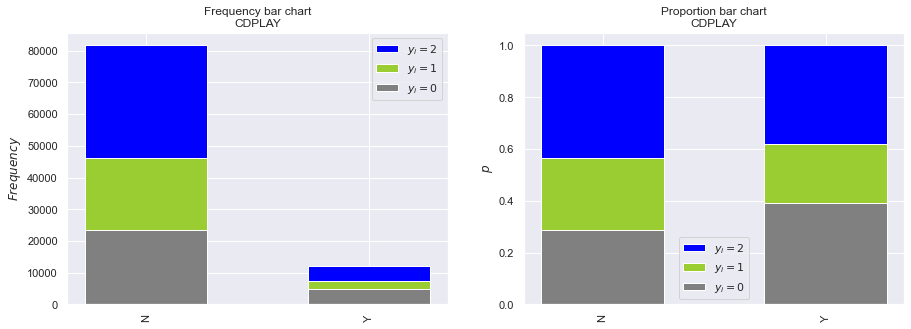

VARIABLE: STEREO


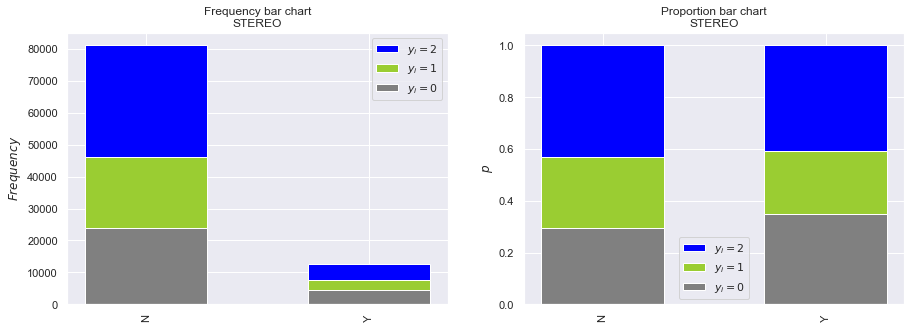

VARIABLE: PCOWNERS


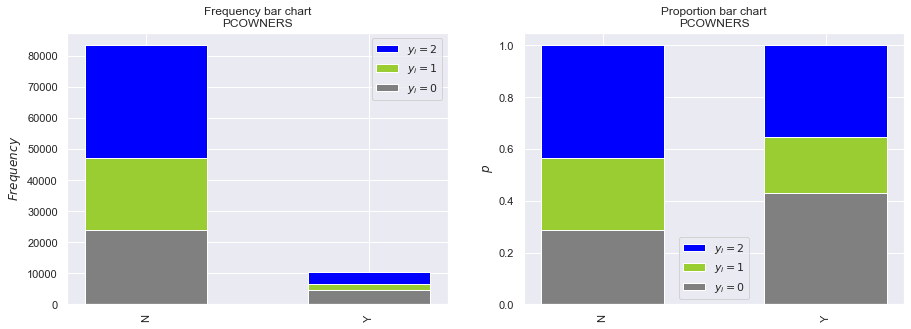

VARIABLE: GARDENIN


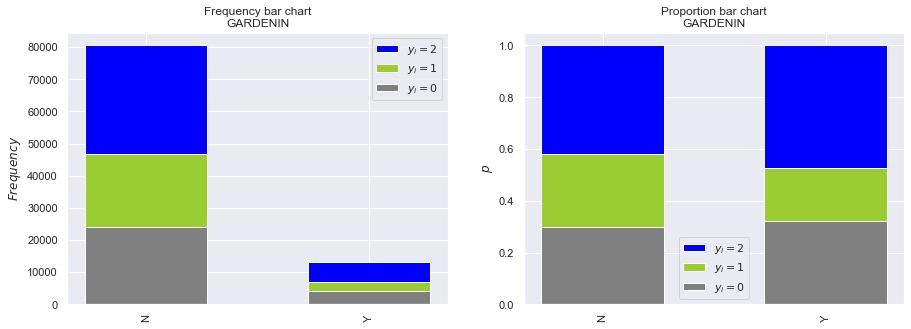

VARIABLE: WALKER


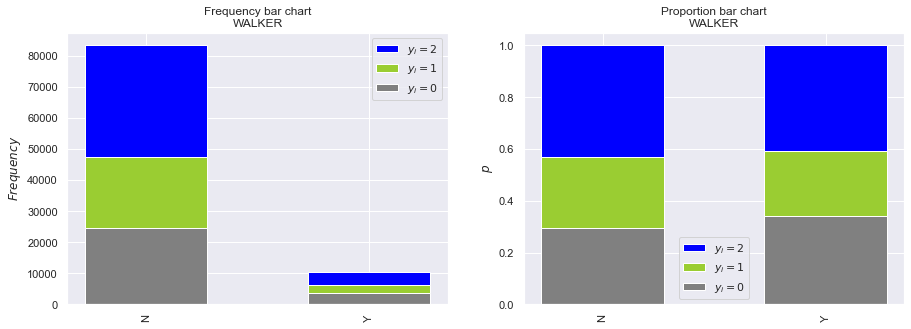

VARIABLE: PEPSTRFL


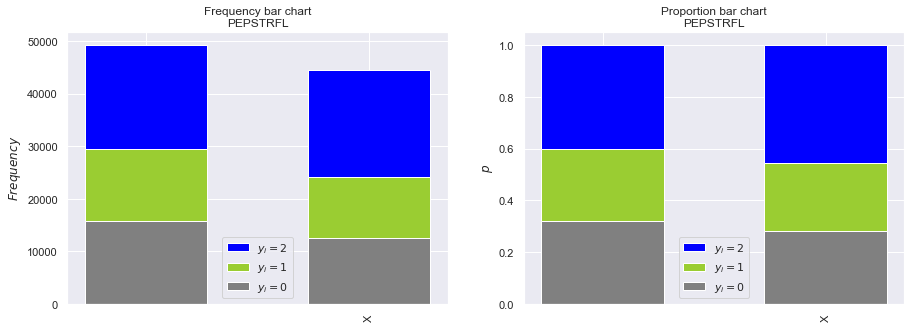

VARIABLE: RFA_2


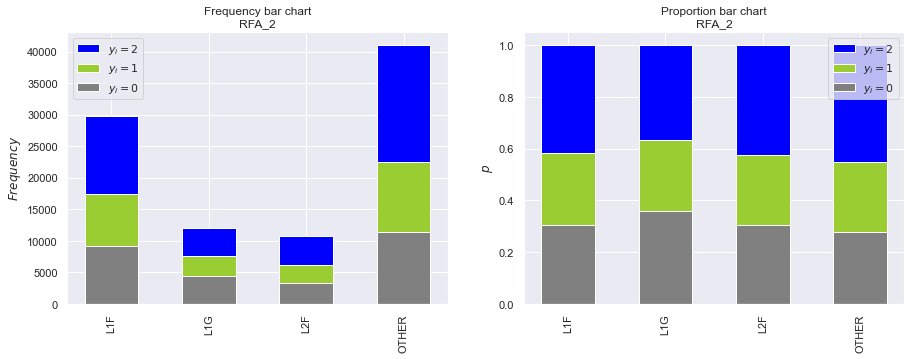

VARIABLE: RFA_3


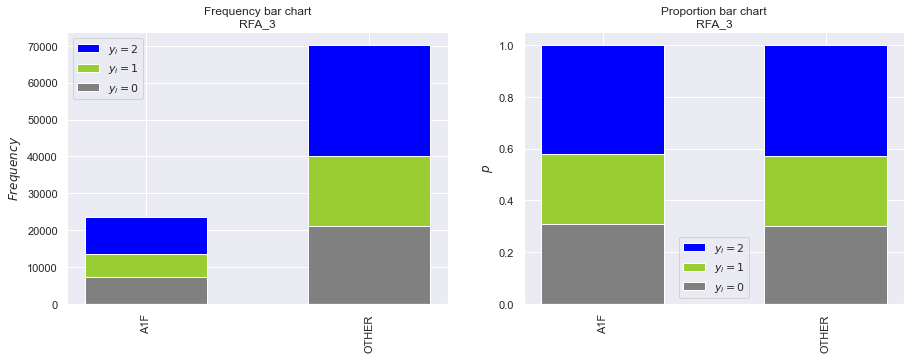

VARIABLE: RFA_4


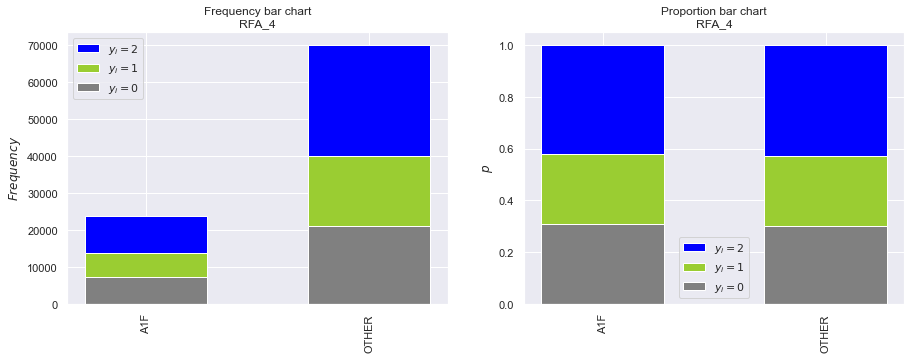

VARIABLE: RFA_5


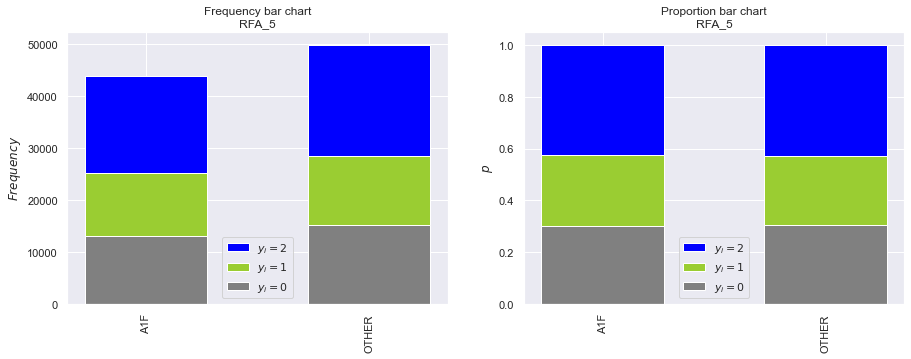

VARIABLE: RFA_8


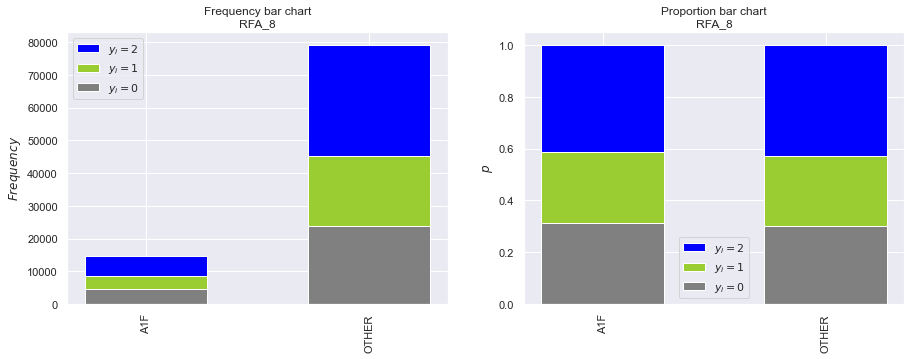

VARIABLE: RFA_9


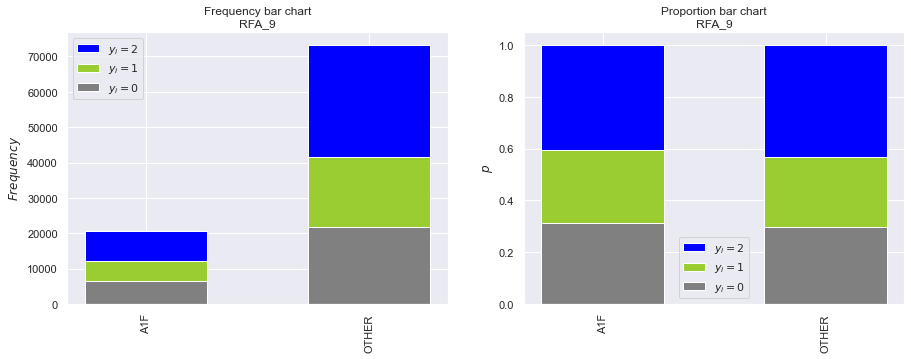

VARIABLE: RFA_10


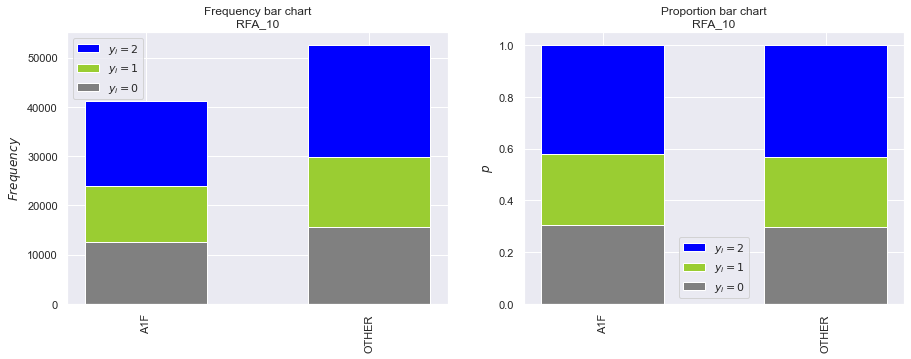

VARIABLE: RFA_11


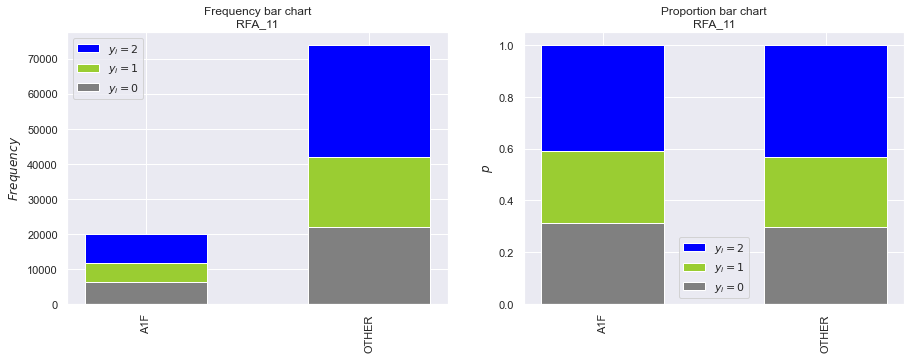

VARIABLE: RFA_12


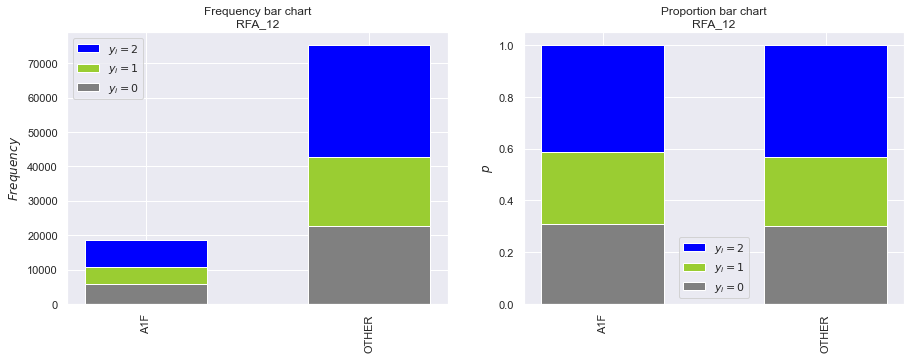

VARIABLE: RFA_14


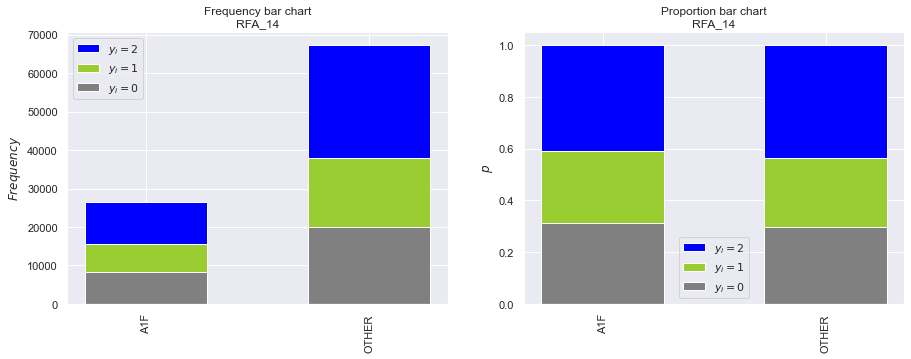

VARIABLE: RFA_16


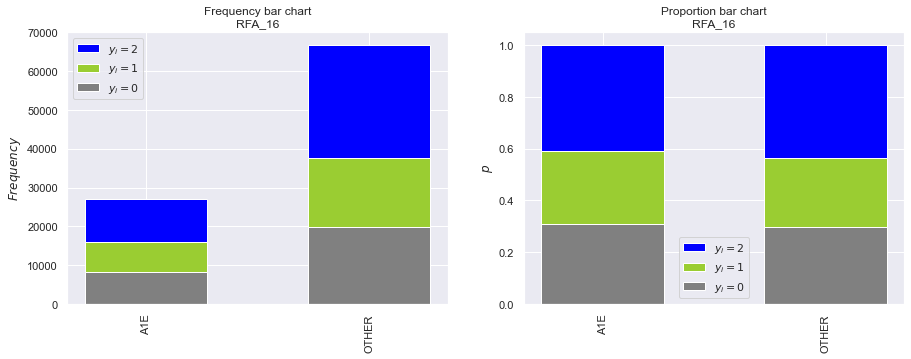

VARIABLE: RFA_17


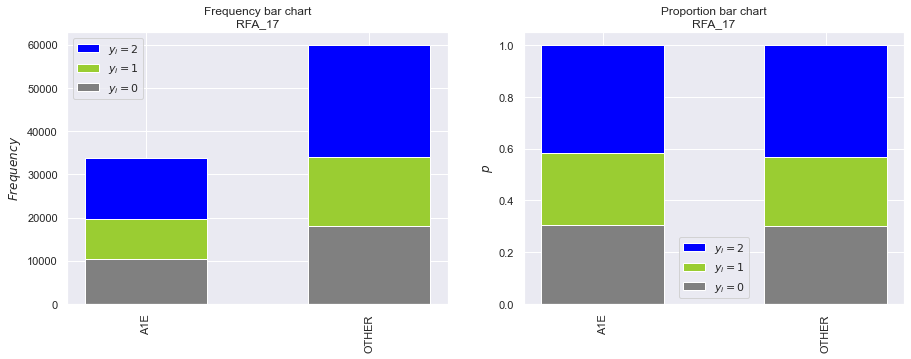

VARIABLE: RFA_18


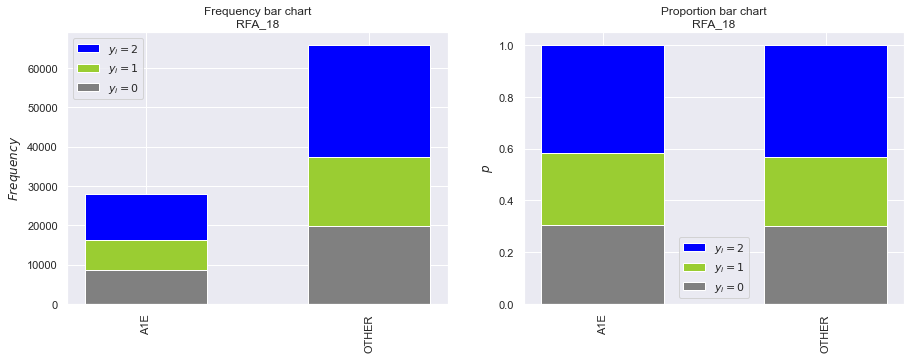

VARIABLE: RFA_19


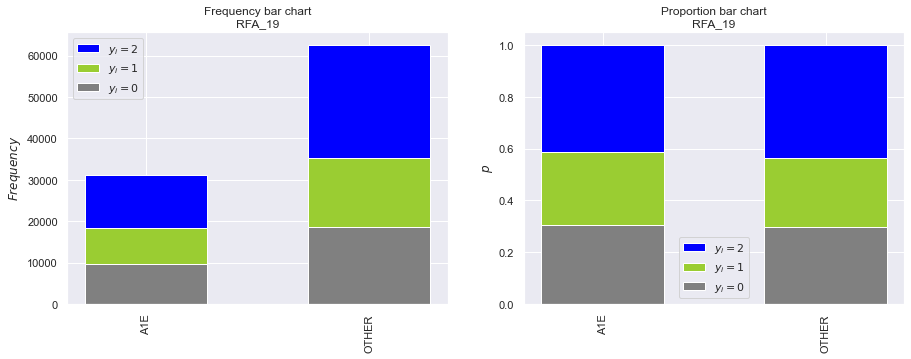

VARIABLE: RFA_21


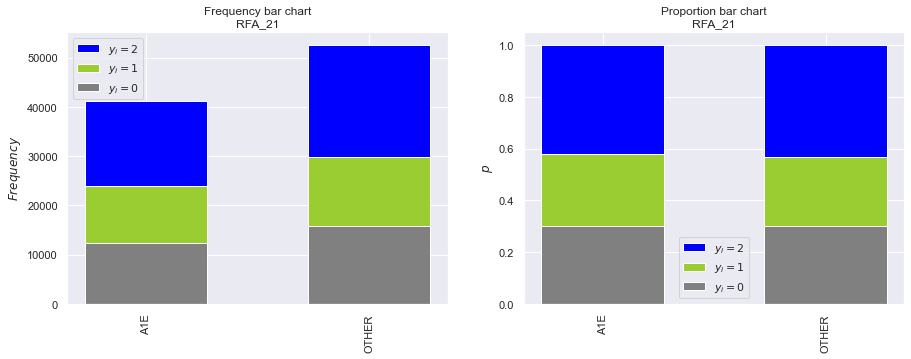

VARIABLE: RFA_22


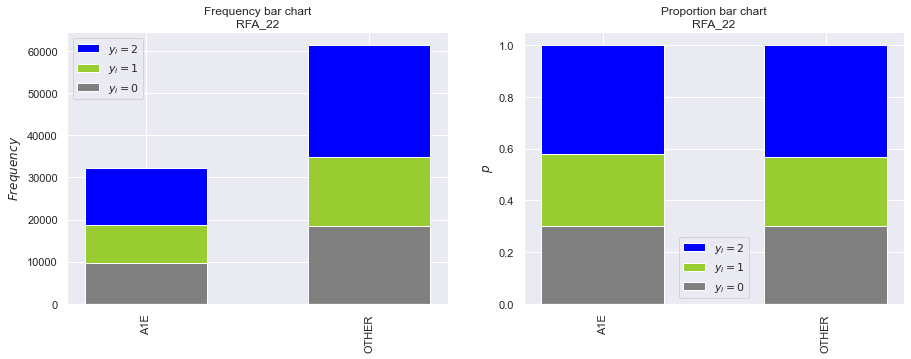

VARIABLE: RFA_24


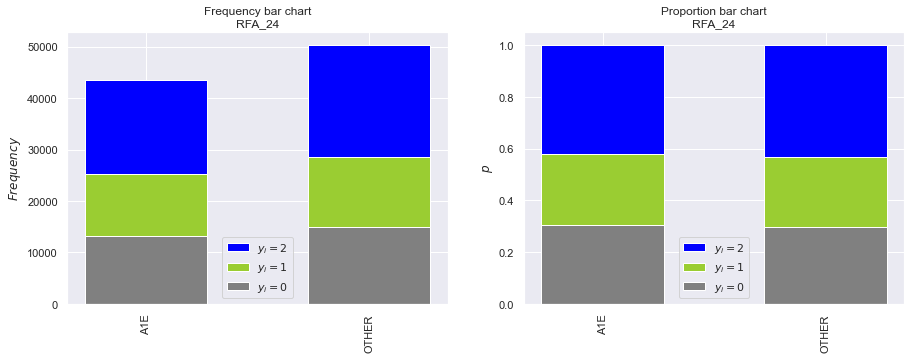

VARIABLE: HPHONE_D


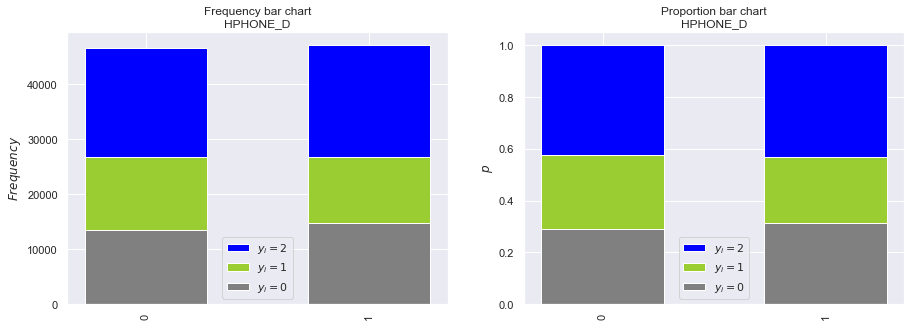

VARIABLE: RFA_2F


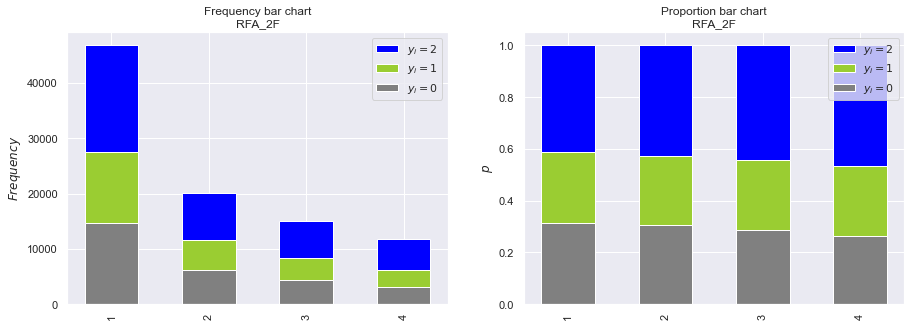

VARIABLE: RFA_2A


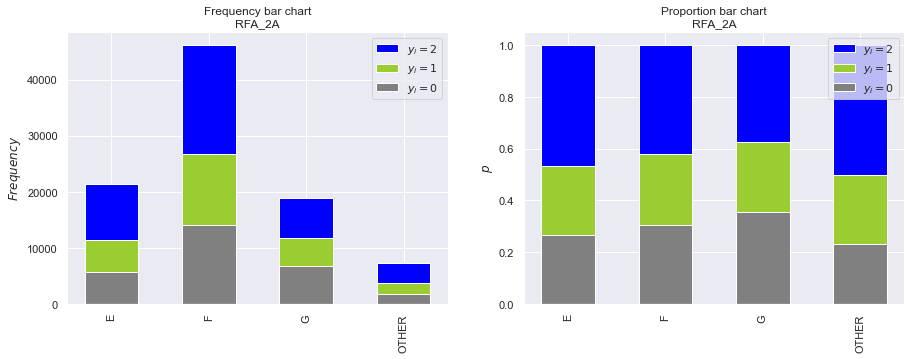

VARIABLE: GEOCODE2


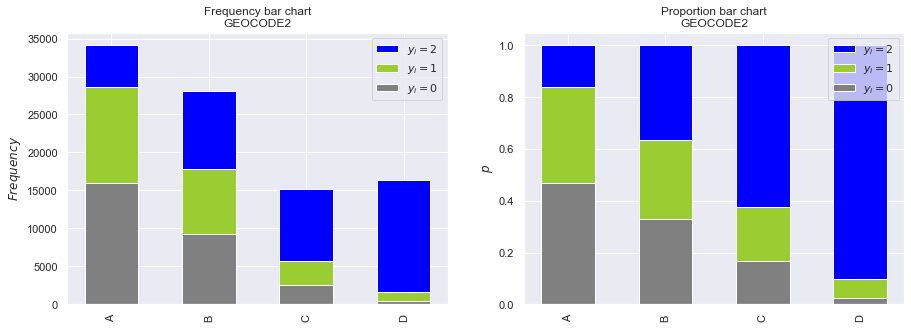

In [103]:
for feature in non_metric_features_no_dummy:
    print('VARIABLE:',feature.upper())
    
    bar_charts_categorical(aux_df2, feature, 'k_means_labels')

#### 12.1.4.3. Visual representation of the choosen categorical features <a class="anchor" id="12.1.4.3"></a>

Based on the previous visualization the following are the variables worth interpreting

In [104]:
categorical_features_to_interpret = ["DOMAIN","HOMEOWNR","GEOCODE","GEOCODE2","INCOME","STATE"]

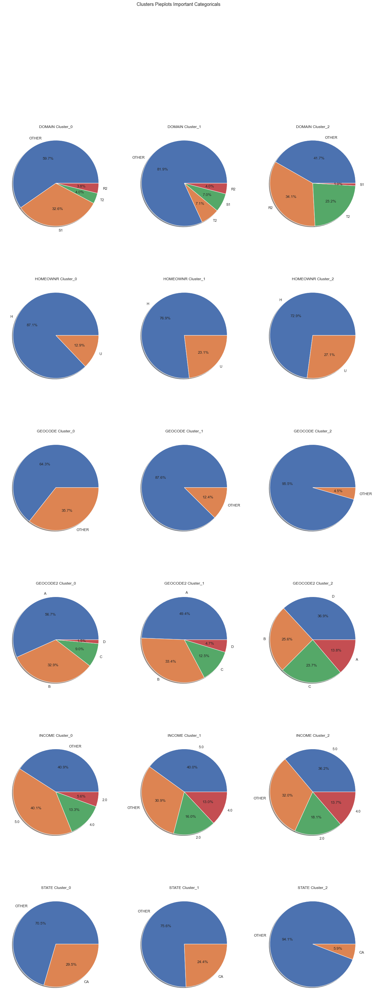

In [105]:
sns.set()


# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(6, 3, figsize=(20, 50))


# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten("F"), categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["k_means_labels"]==0][feat].value_counts(), labels = aux_df2[aux_df2["k_means_labels"]==0][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_0")
for ax, feat in zip(axes.flatten("F")[6:], categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["k_means_labels"]==1][feat].value_counts(), labels = aux_df2[aux_df2["k_means_labels"]==1][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_1")
for ax, feat in zip(axes.flatten("F")[12:], categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["k_means_labels"]==2][feat].value_counts(), labels = aux_df2[aux_df2["k_means_labels"]==2][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_2")

# fig.tight_layout()
# Layout
# Add a centered title to the figure:
title = "Clusters Pieplots Important Categoricals"
plt.suptitle(title)
plt.show()

## 12.1.5. R^2  <a class="anchor" id="12.1.5"></a>

In [106]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_concat[pc_features])  # get total sum of squares
ssw_labels = df_concat[pc_features + ["k_means_labels"]].groupby(by='k_means_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.40236550114896635

## 12.1.6. Visual Representation of the clusters <a class="anchor" id="12.1.6"></a>

<AxesSubplot:xlabel='PC0', ylabel='PC1'>

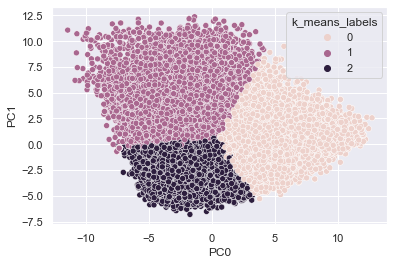

In [107]:
# representation of the clusters on the first 2 PC´s:
sns.scatterplot(x="PC0", y="PC1",hue="k_means_labels",data=df_final_kmeans)

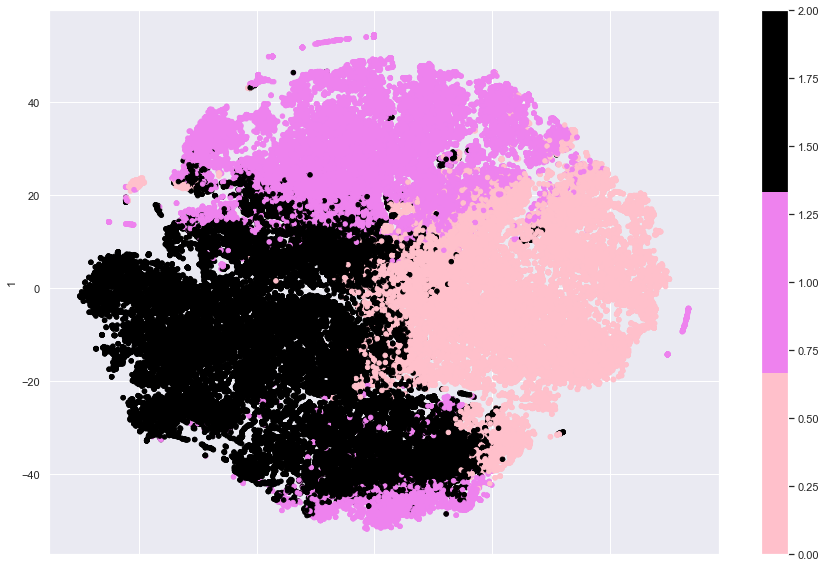

In [109]:
# Cluster visualization using t-SNE
two_dim = TSNE(random_state=42, n_jobs=-1).fit_transform(df_concat[metric_features])#2d representation-> how well our cluster solution
#  fits the intrinsic distribution of our data

# colors:
from matplotlib import colors
cmap = colors.ListedColormap(['pink', 'violet','black'])

# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_concat['k_means_labels'], colormap=cmap, figsize=(15,10))

plt.show()

## 12.1.7. Visualizing the removed outliers in the clustering solution <a class="anchor" id="12.1.7"></a>

In [110]:
scaler2 = StandardScaler()
scaler2.fit(df_final_kmeans[metric_features])
scaled_feat2 = scaler2.transform(df_final_kmeans[metric_features])
df_final_kmeans[metric_features]=scaled_feat2
df_final_kmeans[metric_features]

,,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,MARR4,...,EC4,EC7,EC8,POBC1,VOC1,VOC2,HC12,HC17,HC19,MHUC1
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-1.236434,0.689454,0.966171,0.331100,-0.417029,0.682355,-0.407456,0.206906,-0.839563,-0.447806,...,1.003286,-1.041621,-0.626419,-0.371837,0.333386,0.884441,-0.572086,-1.748692,-0.897871,-0.621358
1,148535,0.851494,-0.435358,-0.655250,-0.874326,4.179007,2.104773,-1.645209,0.845049,-1.529010,0.151200,...,-1.663585,1.646532,1.837186,3.750228,0.591603,1.703004,-0.572086,0.576087,0.761958,3.428883
2,15078,-1.236434,-0.371083,1.789354,0.523968,-0.417029,0.445285,-0.142223,0.366441,-0.379932,-0.447806,...,-0.083217,-0.938231,-0.626419,-0.477531,-0.010904,0.229591,-0.073538,-2.136156,-1.544923,0.246551
3,172556,-1.236434,-0.178258,1.639684,-1.163628,1.213823,0.682355,0.034598,0.366441,-0.379932,0.031399,...,-1.466039,-1.145012,-0.336583,2.376207,0.161241,-0.970968,1.255925,-2.100932,-1.404260,2.271671
5,47784,0.471871,-0.435358,-0.181296,0.379317,-0.268769,0.682355,-0.230634,0.525977,-0.379932,-0.208204,...,-0.181990,0.095675,0.098171,-0.583225,0.333386,0.611587,-0.073538,0.505639,-0.335217,0.246551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,-1.236434,-0.435358,1.814299,0.138232,-0.268769,1.156494,-0.937922,0.605745,-0.150117,-0.567608,...,-0.181990,-0.628059,-0.771337,-0.160449,0.419458,0.611587,1.837565,-2.911082,-2.023179,-0.621358
95407,184568,0.851494,-0.435358,-0.655250,-0.343939,0.176008,0.208216,-0.230634,-0.032398,0.998960,0.151200,...,-0.083217,0.095675,0.098171,-0.266143,0.247313,-0.043264,-0.488995,0.364743,0.733825,2.271671
95408,122706,0.788223,-0.435358,-0.555471,0.282883,-0.120510,0.682355,-1.114744,1.164121,-1.529010,-0.328005,...,-1.663585,2.266876,0.967678,-0.477531,0.591603,1.266437,-0.405903,-0.480631,-0.138288,2.850277


In [111]:
outliers_backup=outliers_df.copy()

In [112]:
# scalling our outliers based on our data, because they were removed before scalling
scaled_outliers = scaler2.transform(outliers_df[metric_features])
outliers_df[metric_features] = scaled_outliers

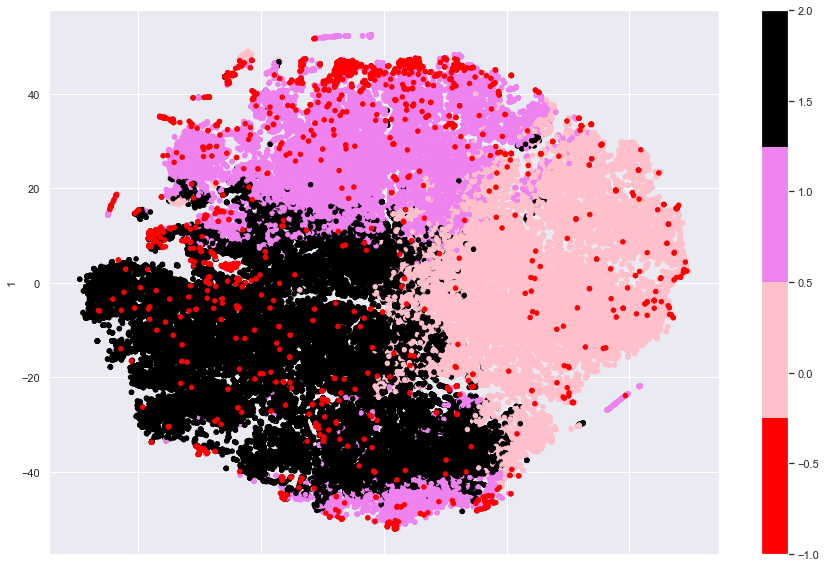

In [113]:
# Cluster visualization using t-SNE

outliers_df['k_means_labels']=-1 # assigning the outliers to a new group, so that when plotting we can distinguish them........
df_merged = pd.concat([df_final_kmeans[metric_features+['k_means_labels']],outliers_df[metric_features+['k_means_labels']]])


two_dim = TSNE(random_state=42, n_jobs=-1).fit_transform(df_merged[metric_features])#2d representation-> how well our cluster solution
#  fits the intrinsic distribution of our data

# colors:
from matplotlib import colors
cmap2 = colors.ListedColormap(['red','pink', 'violet','black'])

# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_merged['k_means_labels'], colormap=cmap2, figsize=(15,10))

plt.show()

## 12.1.8. Labelling our Clusters <a class="anchor" id="12.1.8"></a>

In [114]:
# Getting the variables with their non-scaled values
df_final_kmeans[metric_features]= scaler2.inverse_transform(df_final_kmeans[metric_features]) 

labels_dictionary = {0:'Single People ', 
                 1:'Wealthy People ', 
                 2: 'Countryside people'}

df_final_kmeans['K MEANS LABELS'] = df_final_kmeans['k_means_labels'].map(labels_dictionary)

df_final_kmeans[['K MEANS LABELS']+metric_features+non_metric_features_no_dummy]

,,K MEANS LABELS,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,...,RFA_17,RFA_18,RFA_19,RFA_21,RFA_22,RFA_24,HPHONE_D,RFA_2F,RFA_2A,GEOCODE2
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,Countryside people,0.0,35.0,65.0,92.0,0.0,17.0,18.0,61.0,7.0,...,S4E,S4E,S4E,S4E,S4E,S4E,0,4,E,C
1,148535,Single People,99.0,0.0,0.0,67.0,31.0,23.0,4.0,69.0,4.0,...,A1E,A1E,N1E,N1E,N1E,F1E,0,2,G,A
2,15078,Countryside people,0.0,2.0,98.0,96.0,0.0,16.0,21.0,63.0,9.0,...,A1E,S4D,S4D,A1E,S4D,S3D,1,4,E,C
3,172556,Countryside people,0.0,8.0,92.0,61.0,11.0,17.0,23.0,63.0,9.0,...,S2D,S2D,A1D,A1D,A1D,A1E,1,4,E,C
5,47784,Countryside people,81.0,0.0,19.0,93.0,1.0,17.0,20.0,65.0,9.0,...,N2E,N2E,N2E,N2E,N2E,F1E,0,1,F,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,Countryside people,0.0,0.0,99.0,88.0,1.0,19.0,12.0,66.0,10.0,...,A1E,S3C,S3C,S3C,S3C,S3C,0,4,D,C
95407,184568,Single People,99.0,0.0,0.0,78.0,4.0,15.0,20.0,58.0,15.0,...,A1E,A1E,A1E,A1E,A1E,A1E,0,1,G,C
95408,122706,Single People,96.0,0.0,4.0,91.0,2.0,17.0,10.0,73.0,4.0,...,A1E,A1E,A1E,A1E,A1E,A1E,1,1,F,A


## 12.2. Other Clustering Solutions <a class="anchor" id="12.2"></a>

In [115]:
# updating: non metric features as dummies:
non_metric_features = df.columns[(~df.columns.isin(metric_features)) & ~(df.columns.isin(pc_features))].tolist()

# updating: non metric features in their categorical form:
non_metric_features_no_dummy = df_backup2.loc[:,~(df_backup2.columns.isin(metric_features))].columns.tolist()

### 12.2.1. Kmeans for a big k + Hierarchical Clustering <a class="anchor" id="12.2.1"></a>

#### KMEANS for a big k

Because we have a lot of observations, we are going to perform first the kmeans with a big k in order to reduce the number of observations so we can then apply the hierarchical clustering

Defining  K = 1000 

In [116]:
kmclust = KMeans(n_clusters=1000, init='k-means++', n_init=15, random_state=1,n_jobs=-1) #random_state=1
big_k_kmeans_labels = kmclust.fit_predict(df[pc_features])
big_k_kmeans_labels

array([ 56, 308, 173, ..., 325, 316,  14])

In [117]:
# Reduced Observations:
df_concat_big_k = df.copy()
df_concat_big_k['big_k_means_labels'] = big_k_kmeans_labels

reduced_obs_df = df_concat_big_k.groupby('big_k_means_labels').mean() # getting the clusters centers, which now are my new
                                                                    # observations to be used for the HC, same results as if I
                                                                    #were to use kmclust.cluster_centers_ to get them
reduced_obs_df # Df we are going to use for the hierarchical clustering

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,RFA_2F_2,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C
big_k_means_labels,,,,,,,,,,,,,,,,,,,,,
0,-0.235210,0.430851,-0.811814,-0.441676,-0.210534,1.370686,1.600917,-1.214968,1.096420,-0.080757,...,0.180000,0.140000,0.100000,0.180000,0.560000,0.220000,0.040000,0.260000,0.380000,0.360000
1,-1.253956,2.584039,0.155376,-1.233518,-0.041342,-0.742830,-0.723384,-0.129398,0.239211,0.210782,...,0.182482,0.153285,0.116788,0.218978,0.503650,0.197080,0.080292,0.248175,0.591241,0.160584
2,-1.115402,-1.597673,1.952046,2.089130,-0.192599,-1.017148,0.057960,0.233160,-0.079846,0.224473,...,0.111111,0.166667,0.111111,0.240741,0.462963,0.203704,0.092593,0.333333,0.333333,0.314815
3,6.239433,0.613996,0.330306,-0.732842,0.828274,0.311023,0.285609,1.004872,-1.053578,0.444346,...,0.265306,0.115646,0.088435,0.156463,0.455782,0.360544,0.027211,0.564626,0.353741,0.081633
4,-7.369403,-0.441194,-7.947669,3.992513,11.288085,-4.200820,2.231758,0.357747,0.662701,-0.246829,...,0.233945,0.160550,0.082569,0.169725,0.532110,0.266055,0.032110,0.389908,0.490826,0.119266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.932590,-1.428038,-1.985391,-1.051340,-0.975223,-0.199450,-0.192603,-0.360367,-0.537899,-0.372421,...,0.133333,0.228571,0.076190,0.190476,0.514286,0.209524,0.085714,0.923810,0.076190,0.000000
996,-3.884705,4.276368,0.542399,-0.533951,0.822050,-0.126588,0.327948,-0.115051,-1.652092,-0.521350,...,0.246154,0.123077,0.107692,0.169231,0.538462,0.184615,0.107692,0.369231,0.369231,0.261538
997,-0.030135,3.522574,1.423795,-1.569934,0.955258,-0.202431,-0.832529,0.505603,-0.704738,1.331800,...,0.171429,0.157143,0.114286,0.185714,0.600000,0.157143,0.057143,0.128571,0.642857,0.228571


#### Hierarchical Clustering

Choosing linkage method:

In [118]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.shape[0] - 1))  # =some of squares total if we pass all data, and sum of squares wwithin if 
                                                                                                         # we pass the clusters
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

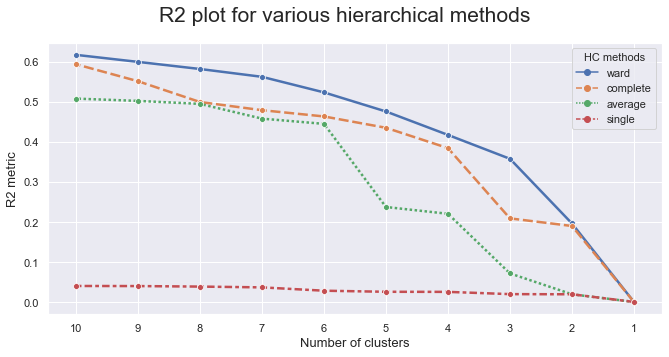

In [119]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack([get_r2_hc(df=reduced_obs_df[pc_features], link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

# clearly by looking at the R^2 value for the different linkage methods the ward is the best one

Defining the number of clusters

In [120]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit(reduced_obs_df[pc_features])
# hclust.fit_predict(reduced_obs_df[pc_features])

AgglomerativeClustering(distance_threshold=0, n_clusters=None)

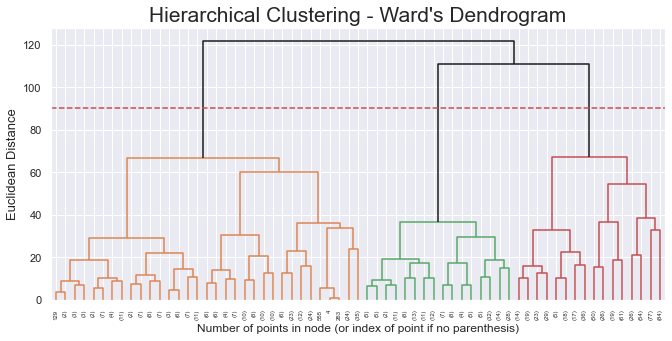

In [121]:
# Adapted from lab class**

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 90
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [122]:
# 3 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc3lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
hc3_labels = hc3lust.fit_predict(reduced_obs_df[pc_features])

In [123]:
# Characterizing the 3 clusters
df_concat = pd.concat((reduced_obs_df[metric_features], pd.Series(hc3_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,POP90C1,POP90C2,POP90C3,ETH1,ETH4,AGEC4,HHN1,MARR1,MARR2,MARR4,...,EC4,EC7,EC8,POBC1,VOC1,VOC2,HC12,HC17,HC19,MHUC1
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.284933,0.181963,0.217978,0.104251,-0.210753,-0.113075,-0.018280,0.196917,-0.043121,-0.274627,...,0.322914,-0.299081,-0.272862,-0.198555,0.131406,-0.026965,0.186281,-0.135449,-0.198618,-0.216634
1,0.484154,0.006288,-0.588534,-0.947228,0.956938,-0.739287,1.023616,-1.368588,0.943804,1.315820,...,-0.493600,-0.002641,0.010271,1.109578,-0.851103,-1.145864,-0.378967,0.493982,0.600573,-0.068954
2,0.555521,-0.188485,-0.491342,0.229735,0.412656,0.832337,-0.449335,0.532908,-0.569073,-0.150433,...,-1.094958,1.385259,1.415965,0.255923,0.444005,0.761683,-0.427394,0.387529,0.395340,1.254382


In [124]:
aux_dictionary=df_concat['labels'].to_dict()
df_concat_big_k['labels']=df_concat_big_k['big_k_means_labels'].map(aux_dictionary)
df_concat_big_k['labels']

       CONTROLN
0      95515       0
1      148535      2
2      15078       0
3      172556      0
5      47784       0
                  ..
95406  35088       0
95407  184568      0
95408  122706      2
95409  189641      0
95410  4693        0
Name: labels, Length: 93730, dtype: int64

In [125]:
df_concat_big_k['labels'].value_counts()

0    61084
1    16347
2    16299
Name: labels, dtype: int64

In [126]:
# ANALYSING THE HC CLUSTERING SOLUTION FOR THE METRIC FEATURES:
df_final_hc = df_not_standardized.loc[df_concat_big_k.index,:] # getting the original values of our variables to interpret them
                                                            # and making sure the observations are the same
df_final_hc['labels']=df_concat_big_k['labels'].copy()
df_final_hc[variables_to_interpret+['labels']].groupby('labels').mean()

,IC1,IC11,HUR2,IC6,IC10,HHAS3,EC7,HV3,IC12,OCC2,...,HC19,HHD10,POP90C3,MARR1,POP90C1,MARR4,HHN1,ETH1,VOC1,POP90C2
labels,,,,,,,,,,,,,,,,,,,,,
0,302.948137,3.958975,45.899646,22.867494,14.851745,41.053369,10.852105,3.507138,1.224036,10.737607,...,62.771168,12.259610,38.527192,61.373568,44.493288,20.631147,21.546346,88.965556,93.959138,16.272772
1,245.991313,3.386309,21.950939,29.651373,10.703432,31.515752,12.846455,4.143023,1.240962,10.736221,...,90.607267,20.807182,1.738668,40.065761,80.608858,32.018352,32.530434,64.886829,79.936747,12.170184
2,581.360083,14.086447,71.262838,7.130560,25.994294,62.267992,27.383520,7.011473,6.906313,21.542119,...,87.439475,10.459353,4.924842,65.679551,89.544082,21.325664,16.638935,91.076262,97.484999,4.710964


#### Visual Analysis of the metric features´ results of the kmeans+HC

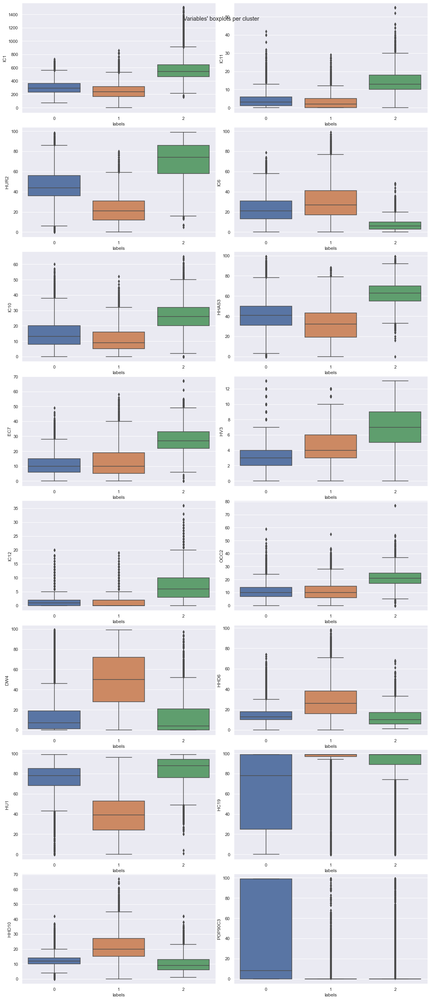

In [127]:
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(8,2, figsize=(15,35))
fig.tight_layout()
# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="labels", y=feat, data=df_final_hc,ax=ax)

# Layout
# Add a centered title to the figure:
title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

#### Hierachical Clustering solution interpretation for the Categorical Variables

In [128]:
aux_df2=df_backup2[non_metric_features_no_dummy].copy()
aux_df2['labels']=df_final_hc['labels'].copy()

##### Contingency table: Categories vs Clusters and Chi-square test of independence 

In [129]:
not_important=[]
for feature in non_metric_features_no_dummy:
    # Contingency table
    contingency = pd.crosstab(aux_df2[feature], aux_df2['labels'])

    # Chi-square test of independence: null hypothesis the categorical feature is independent from the cluster
    # ->if we reject then the feature is important for our model
    c, p, dof, expected = chi2_contingency(contingency)
    
    if p>0.05:
        not_important.append(feature)
        
print('The following variables were dropped according to the Chi-square test of independence:\n',not_important)

non_metric_features_no_dummy=[i for i in non_metric_features_no_dummy if i not in not_important]

for feature in non_metric_features:
    for var in not_important:
        if var in feature:
            non_metric_features.remove(feature)

The following variables were dropped according to the Chi-square test of independence:
 ['RFA_3', 'RFA_4', 'RFA_5', 'RFA_6', 'MAXRDATE']


#### Frequency and Proportion barcharts of the categorical features and clusters obtained before <a class="anchor" id="12.5.2"></a>

In [130]:
# Proportions of the categories of the categorical features among donors
df_concat_big_k[non_metric_features+['labels']].groupby('labels').mean()*100

,TCODE_0,TCODE_1,TCODE_2,TCODE_OTHER,STATE_CA,STATE_OTHER,DOMAIN_OTHER,DOMAIN_R2,DOMAIN_S1,DOMAIN_T2,...,RFA_2F_2,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C
labels,,,,,,,,,,,,,,,,,,,,,
0,42.423548,26.987427,18.689018,11.900007,10.128675,89.871325,53.591775,23.711610,5.043874,17.652740,...,21.643966,16.526423,13.065615,23.993190,48.955537,18.577696,8.473577,25.009823,30.336913,19.836618
1,45.207072,25.631614,15.281091,13.880223,34.012357,65.987643,81.568484,4.190371,7.279623,6.961522,...,20.835627,15.794947,12.546645,21.796048,50.119288,20.560347,7.524316,54.921392,26.934606,11.531168
2,42.284803,27.817658,17.375299,12.522241,31.486594,68.513406,50.990858,3.607583,43.560955,1.840604,...,21.798883,14.620529,10.252163,19.037978,49.524511,25.792993,5.644518,60.371802,31.320940,7.350144


VARIABLE: TCODE


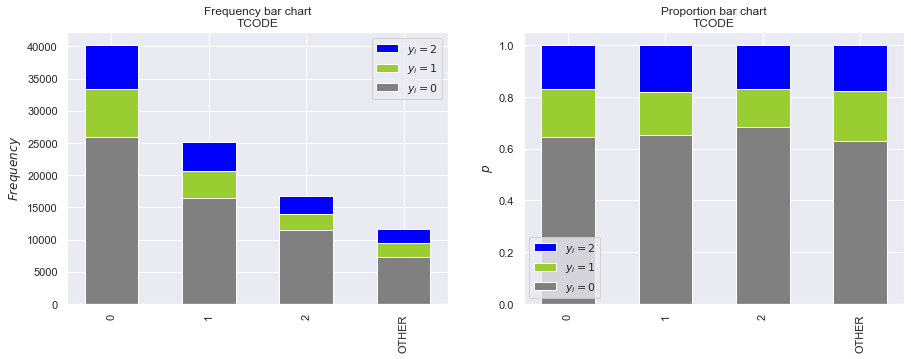

VARIABLE: STATE


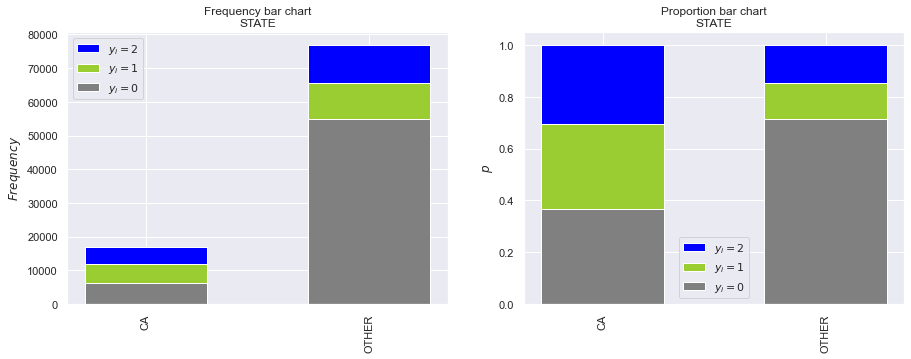

VARIABLE: DOMAIN


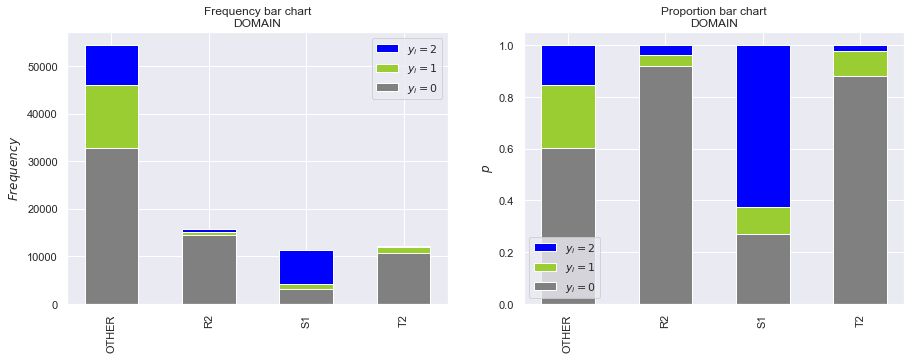

VARIABLE: HOMEOWNR


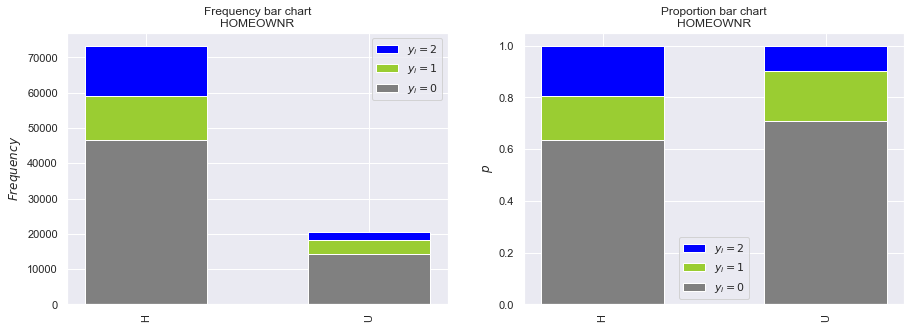

VARIABLE: INCOME


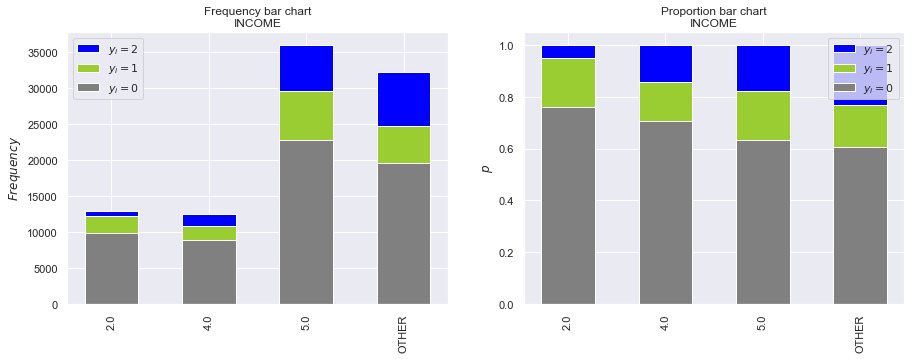

VARIABLE: GENDER


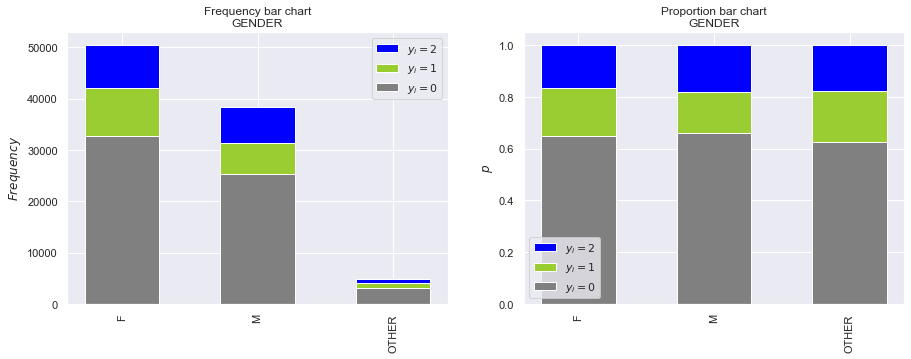

VARIABLE: DATASRCE


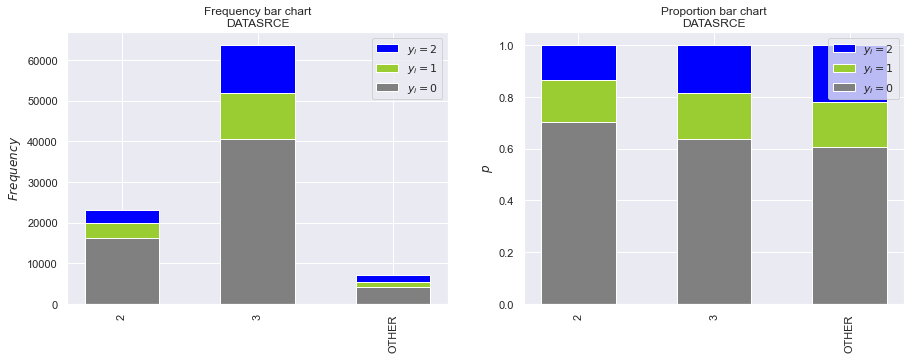

VARIABLE: GEOCODE


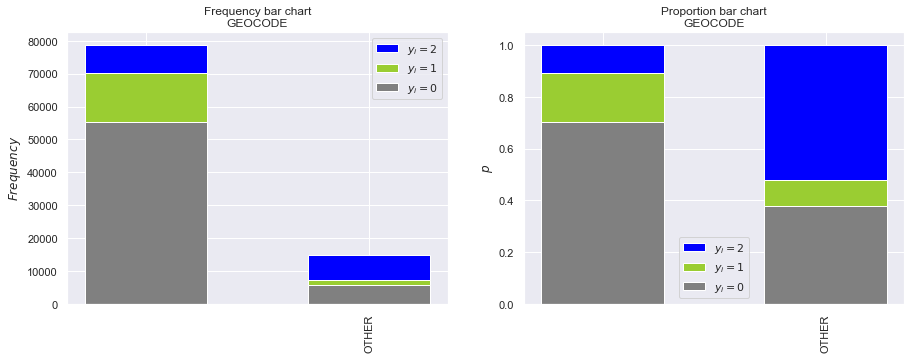

VARIABLE: VETERANS


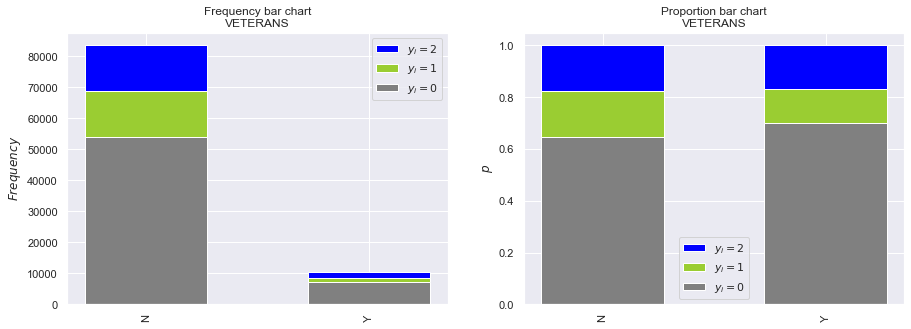

VARIABLE: PETS


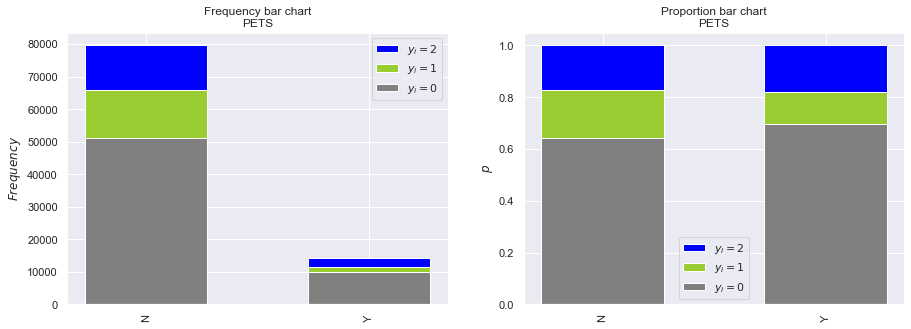

VARIABLE: CDPLAY


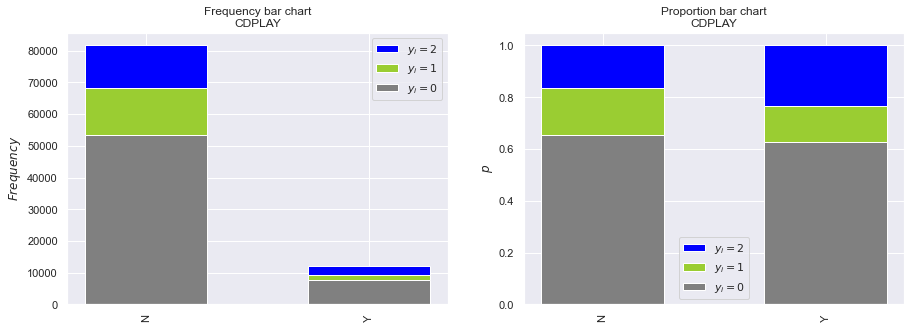

VARIABLE: STEREO


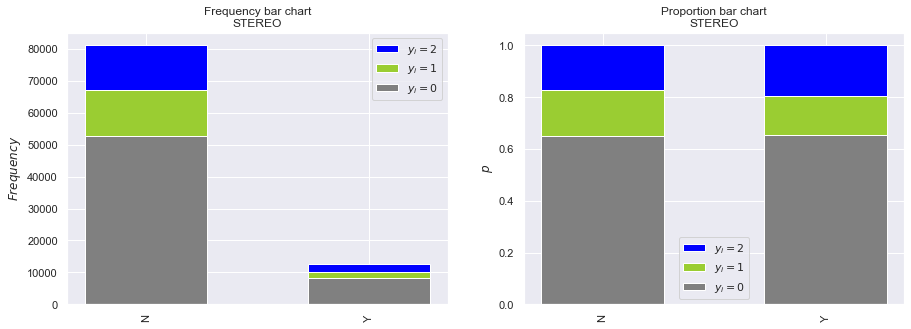

VARIABLE: PCOWNERS


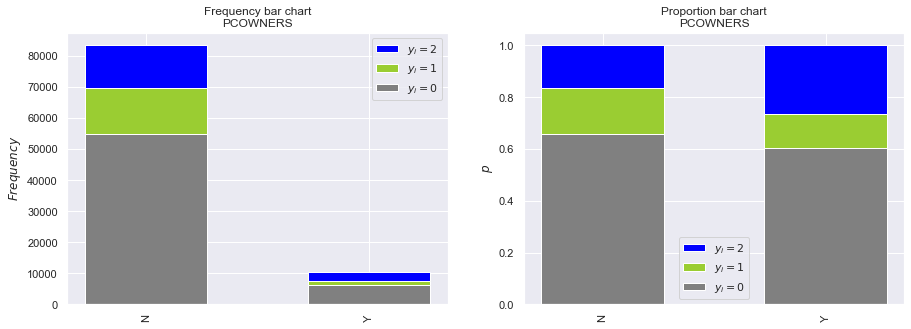

VARIABLE: GARDENIN


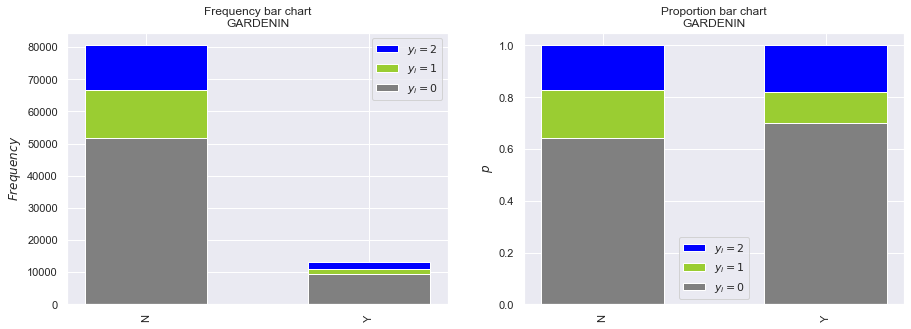

VARIABLE: WALKER


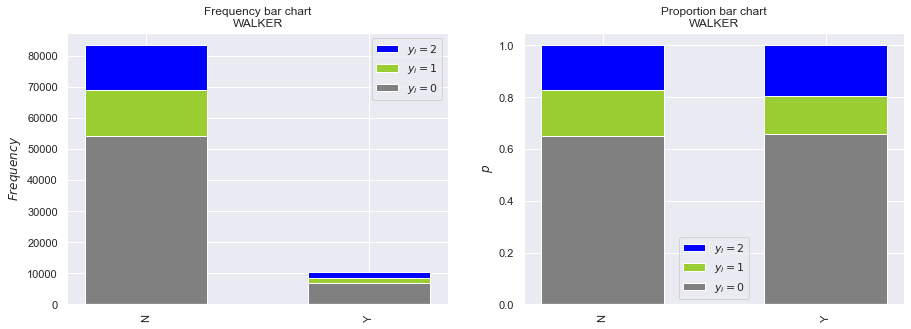

VARIABLE: PEPSTRFL


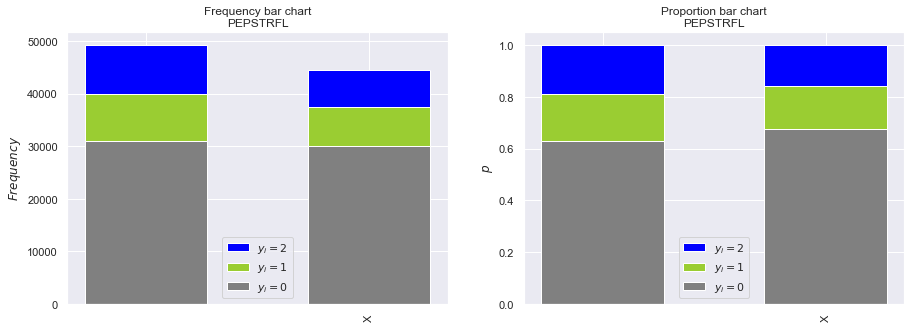

VARIABLE: RFA_2


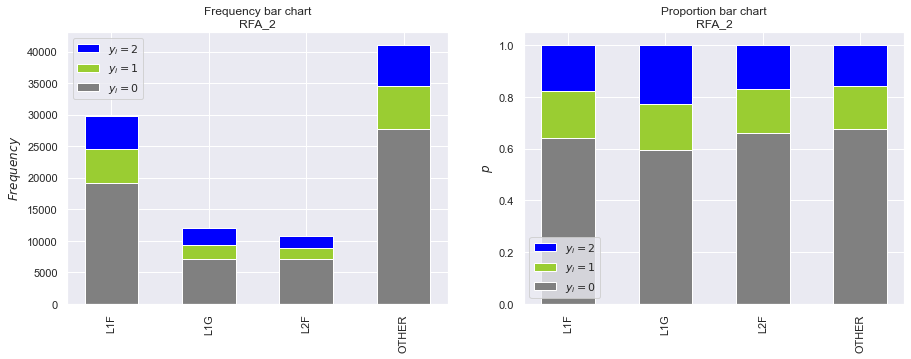

VARIABLE: RFA_7


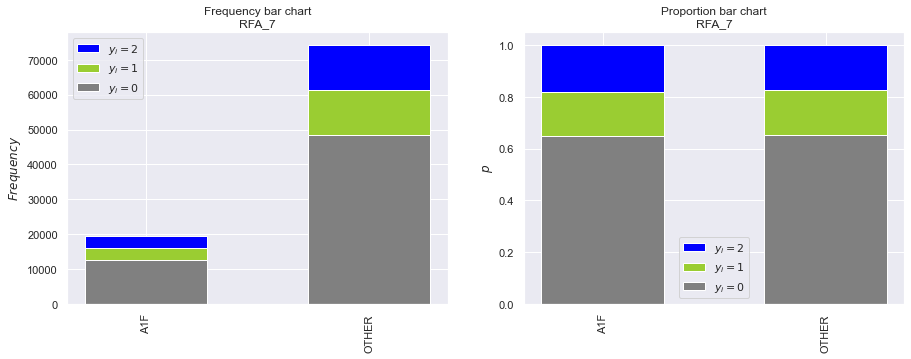

VARIABLE: RFA_8


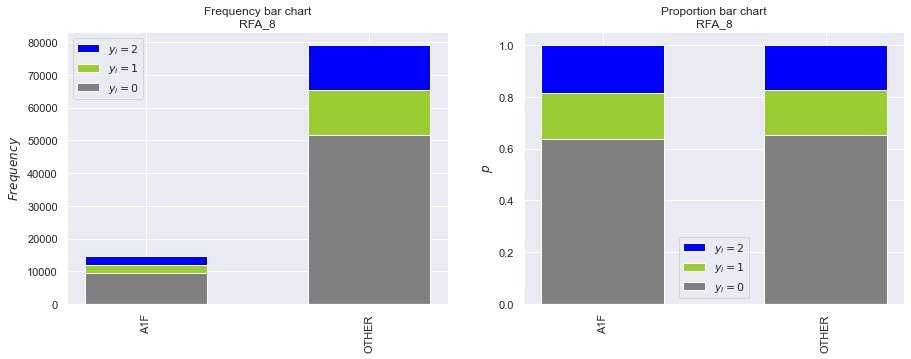

VARIABLE: RFA_9


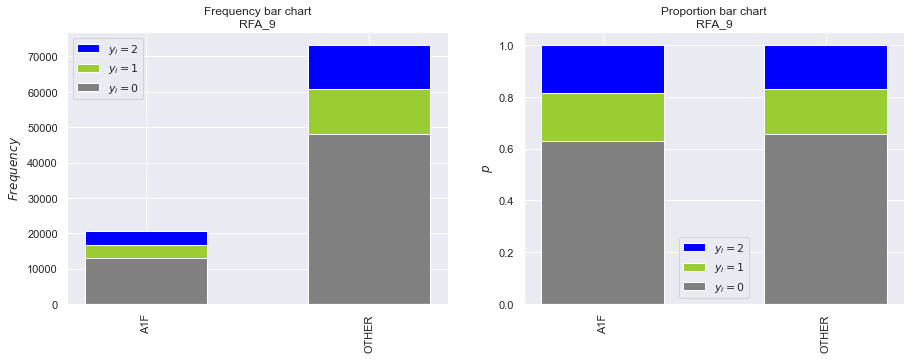

VARIABLE: RFA_10


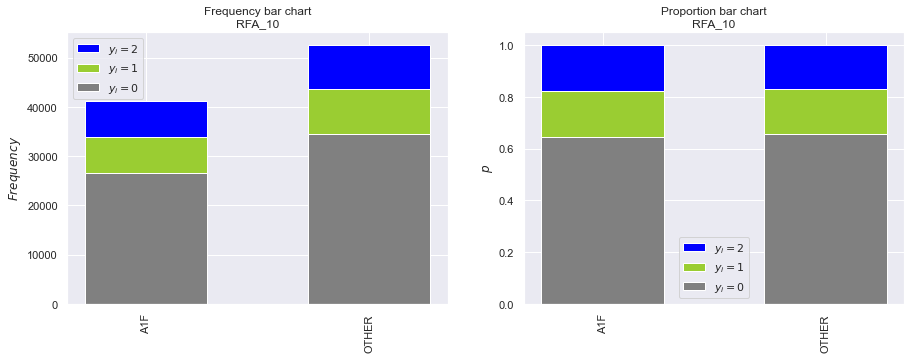

VARIABLE: RFA_11


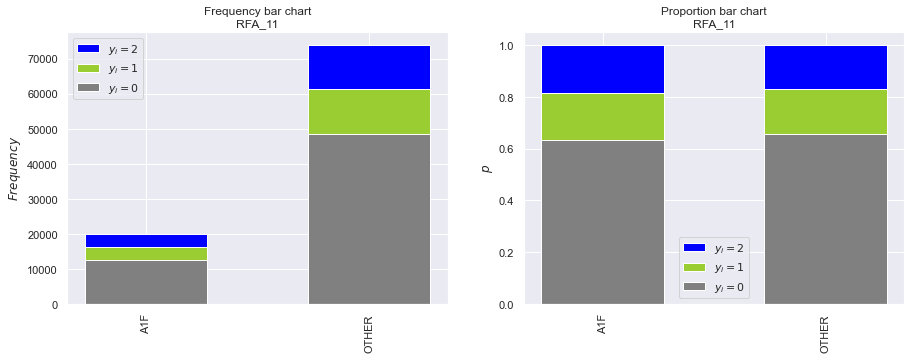

VARIABLE: RFA_12


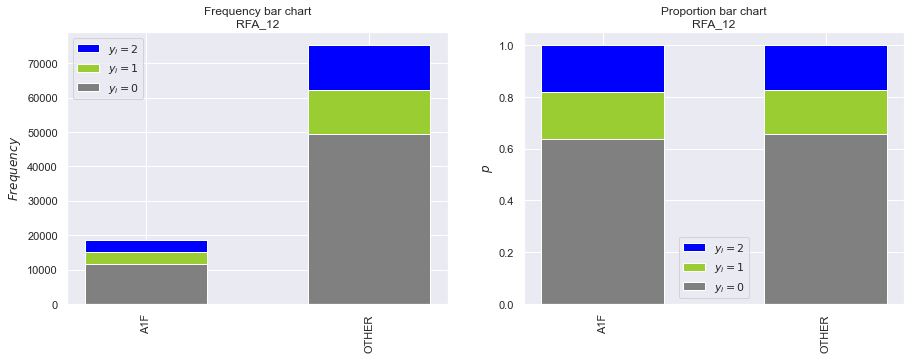

VARIABLE: RFA_14


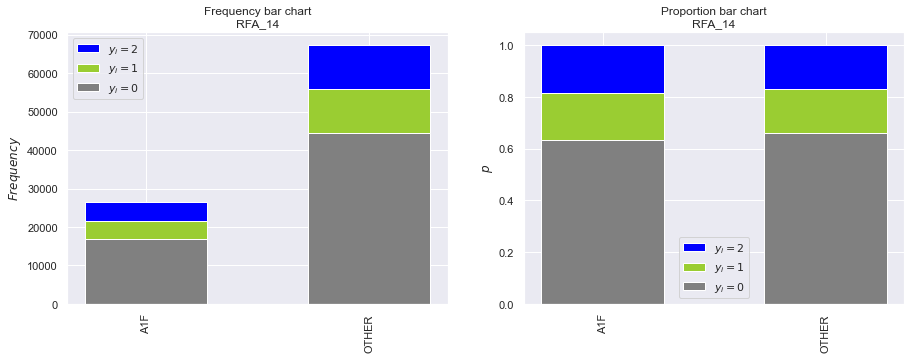

VARIABLE: RFA_16


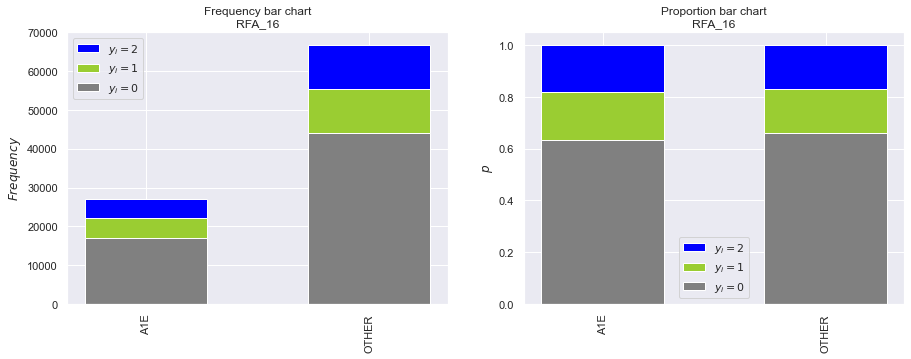

VARIABLE: RFA_17


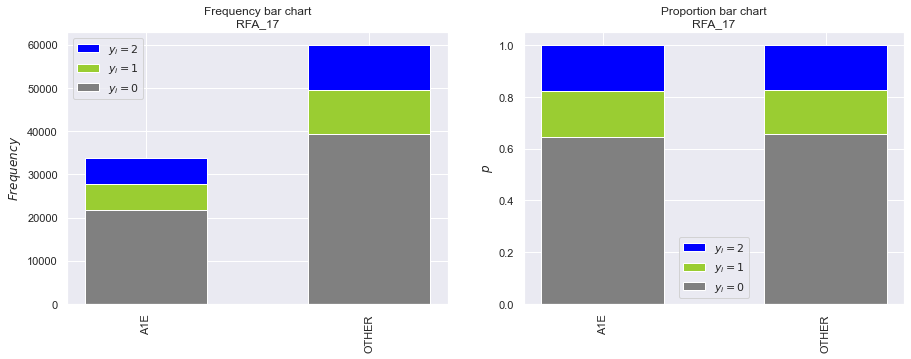

VARIABLE: RFA_18


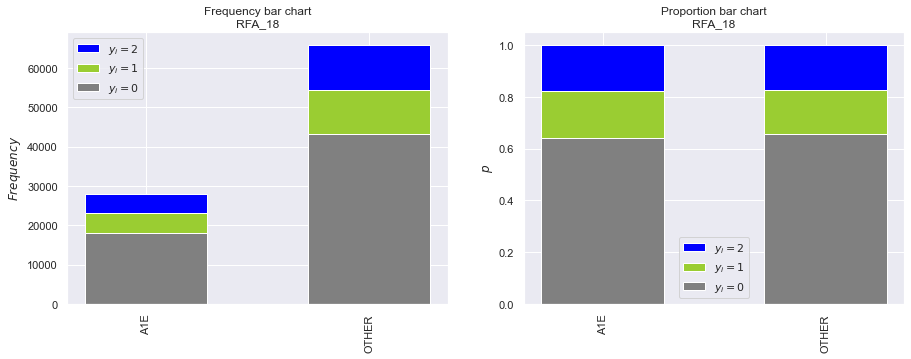

VARIABLE: RFA_19


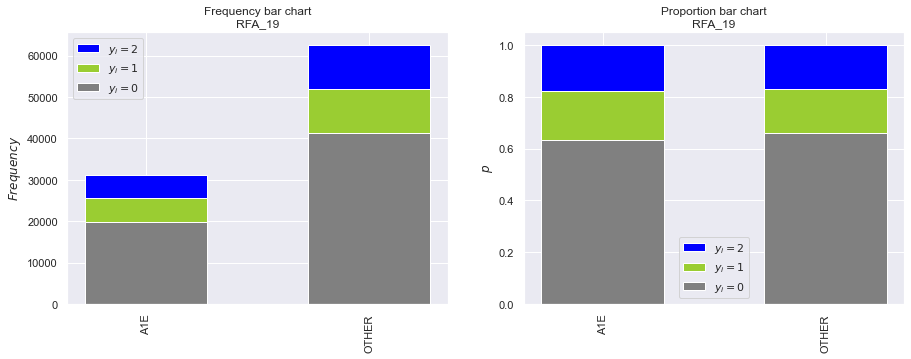

VARIABLE: RFA_21


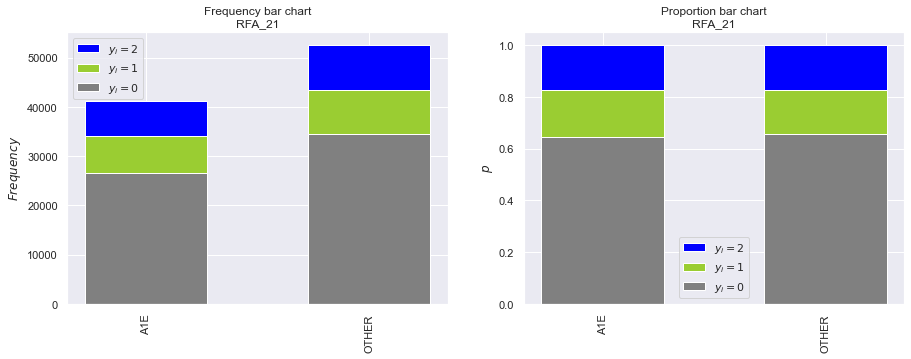

VARIABLE: RFA_22


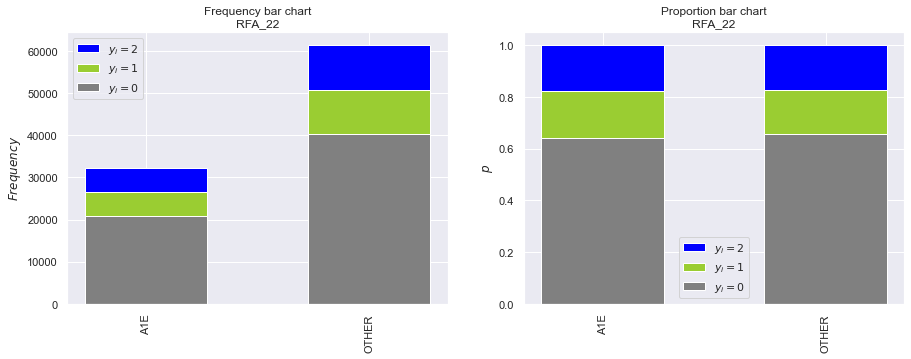

VARIABLE: RFA_24


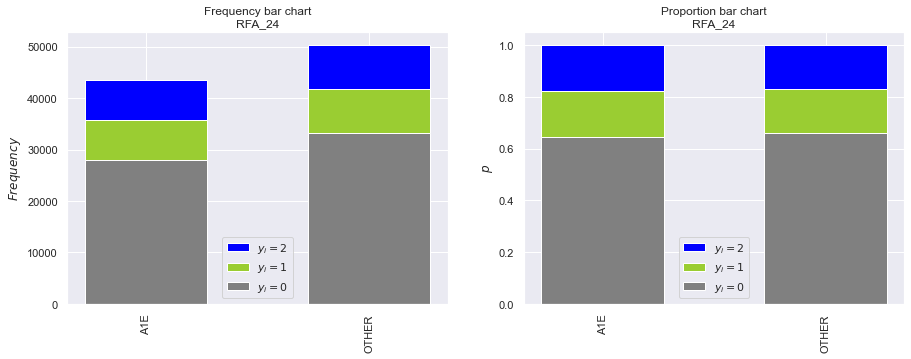

VARIABLE: HPHONE_D


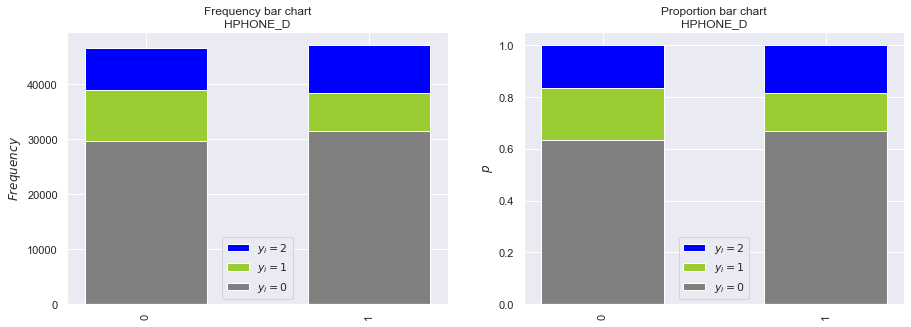

VARIABLE: RFA_2F


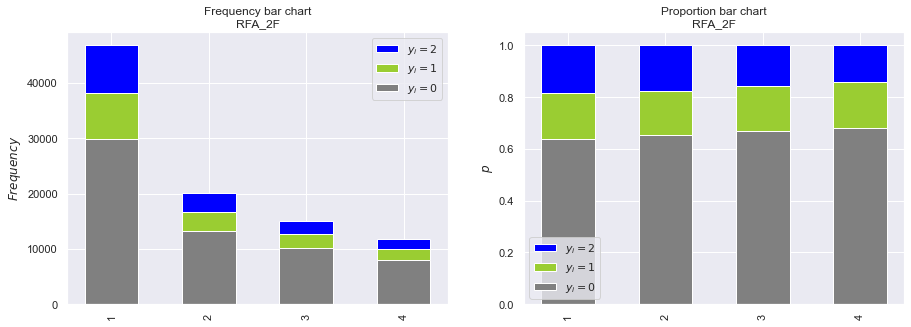

VARIABLE: RFA_2A


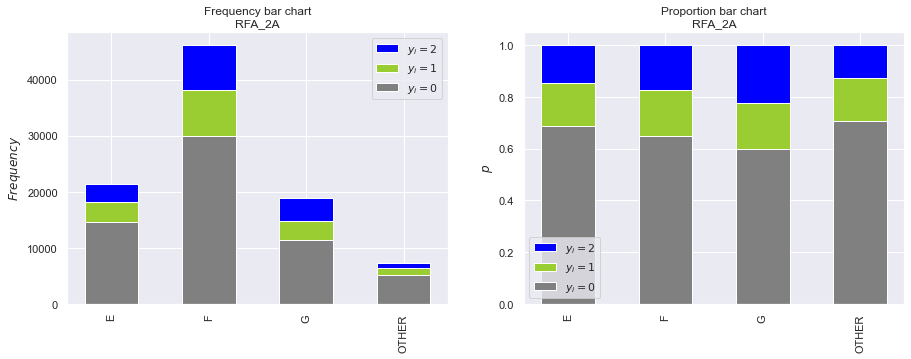

VARIABLE: GEOCODE2


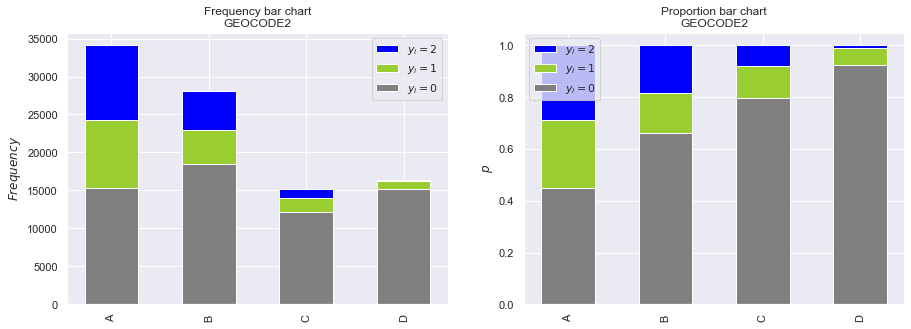

In [131]:
for feature in non_metric_features_no_dummy:
    print('VARIABLE:',feature.upper())
    
    bar_charts_categorical(aux_df2, feature, 'labels')

#### Visual representation of the choosen categorical features

In [132]:
categorical_features_to_interpret = ["DOMAIN","HOMEOWNR","GEOCODE","GEOCODE2","INCOME","STATE"]

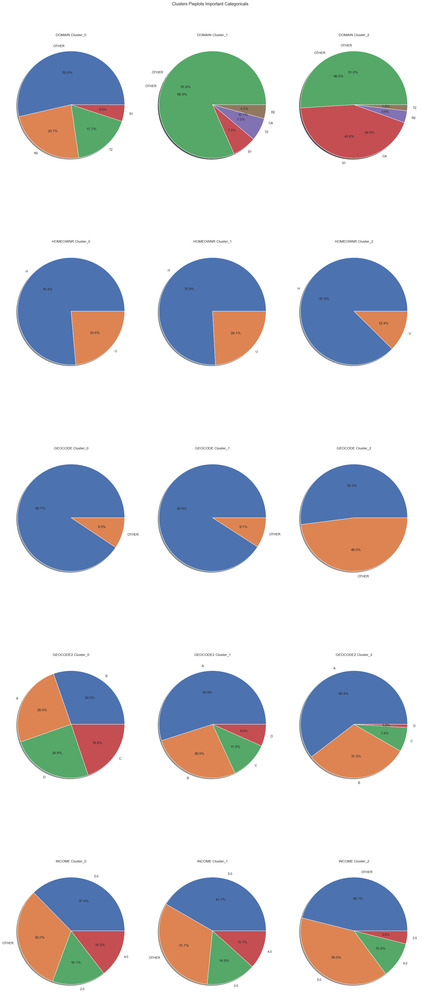

In [133]:
sns.set()


# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(5, 3, figsize=(20, 50))


# Plot data
# Iterate across axes objects and associate each histogram:
for ax, feat in zip(axes.flatten("F"), categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["labels"]==0][feat].value_counts(), labels = aux_df2[aux_df2["labels"]==0][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_0")
for ax, feat in zip(axes.flatten("F")[5:], categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["labels"]==1][feat].value_counts(), labels = aux_df2[aux_df2["labels"]==1][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_1")
for ax, feat in zip(axes.flatten("F")[10:], categorical_features_to_interpret): # Notice the zip() function and flatten() method
    ax.pie(aux_df2[aux_df2["labels"]==2][feat].value_counts(), labels = aux_df2[aux_df2["labels"]==2][feat].value_counts().index, autopct='%1.1f%%', shadow=True, radius=1)
    ax.set_title(feat + " Cluster_2")

fig.tight_layout()
# Layout
# Add a centered title to the figure:
title = "Clusters Pieplots Important Categoricals"
plt.suptitle(title)
plt.show()

#### R^2

In [134]:
# using R^2

sst = get_ss(df_concat_big_k[pc_features])  # get total sum of squares
ssw_labels = df_concat_big_k[pc_features + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.33168341500378956

#### Visual Representation of the clusters

<AxesSubplot:xlabel='PC0', ylabel='PC1'>

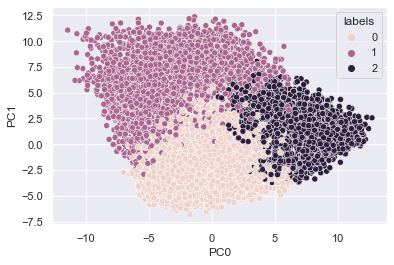

In [135]:
# representation of the clusters on the first 2 PC´s:
sns.scatterplot(x="PC0", y="PC1",hue="labels",data=df_concat_big_k)

### 12.2.2. Density Based Clustering <a class="anchor" id="12.2.2"></a>

#### 12.2.2.1. Mean Shift Clustering <a class="anchor" id="12.2.2.1"></a>

In [136]:
bandwidth = estimate_bandwidth(df[pc_features], quantile=0.02, random_state=1, n_jobs=-1)
bandwidth

3.203820578534928

In [137]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
# bin_seeding if not set to true will take a lot of time to run
ms_labels = ms.fit_predict(df[pc_features])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)


Number of estimated clusters : 8


In [138]:
# Characterizing the 6 clusters
df_concat_ms = df.copy()
df_concat_ms['ms_labels'] = ms_labels

df_final_ms = df_not_standardized.loc[df_concat_ms.index,:]
df_final_ms = pd.concat([df[pc_features],df_final_ms],axis=1)

df_final_ms['ms_labels']=ms_labels

#we also want to compare the clusters with the population:
aux_merge3=df_final_ms[metric_features].mean()
aux_merge3.name='Population'

pd.concat([df_final_ms[metric_features+['ms_labels']].groupby('ms_labels').mean(),pd.DataFrame(aux_merge3).T])[variables_to_interpret]

,IC1,IC11,HUR2,IC6,IC10,HHAS3,EC7,HV3,IC12,OCC2,...,HC19,HHD10,POP90C3,MARR1,POP90C1,MARR4,HHN1,ETH1,VOC1,POP90C2
0,250.469969,2.476762,41.634114,30.003464,10.577852,35.019639,7.471146,2.503161,0.798796,8.308481,...,38.991559,12.178101,70.234161,62.541263,9.146018,19.560869,21.362893,89.594229,93.031914,20.005448
1,420.121178,8.008088,55.554331,14.110886,20.686784,50.605435,18.015152,5.236097,3.279133,15.549510,...,86.235330,12.036542,7.114507,61.271459,81.678027,21.973002,20.340293,88.251742,95.344425,10.403105
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,390.338227,8.446982,33.116911,16.849375,20.870038,35.931485,13.103861,6.505166,2.993475,11.002719,...,92.946710,12.853725,2.185971,53.293094,89.684067,31.082654,15.035345,44.696574,92.225666,7.208809
4,225.772232,3.121597,8.471869,37.979129,9.146098,38.211434,23.060799,4.501815,1.370236,15.675136,...,98.663339,38.313975,0.043557,23.778584,98.963702,48.412886,59.895644,76.296733,70.140653,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,122.525641,0.903846,41.839744,58.141026,4.698718,9.250000,3.769231,2.108974,0.358974,4.301282,...,95.076923,14.506410,1.608974,28.512821,95.820513,40.762821,25.326923,5.698718,56.134615,0.955128
7,237.874129,2.901469,19.955184,32.871341,9.741396,33.789750,14.094564,4.123620,1.089096,11.480755,...,96.965691,23.325185,0.829849,39.919696,83.993245,33.887316,37.804653,71.128230,82.316822,14.236410
Population,341.428486,5.620196,46.133351,21.314094,16.065870,43.079036,14.074629,4.227419,2.215097,12.616195,...,71.915577,13.437299,26.267865,58.406156,58.626054,22.737907,22.608663,85.133138,92.126683,13.546741


<AxesSubplot:xlabel='PC0', ylabel='PC1'>

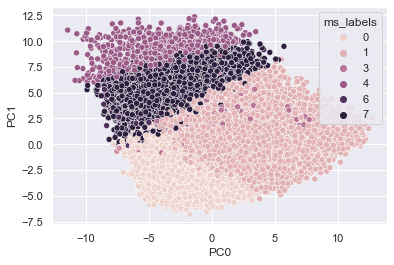

In [139]:
# representation of the clusters on the first 2 PC´s:
sns.scatterplot(x="PC0", y="PC1",hue="ms_labels",data=df_concat_ms)

##### Visual Analysis of the metric features´ results

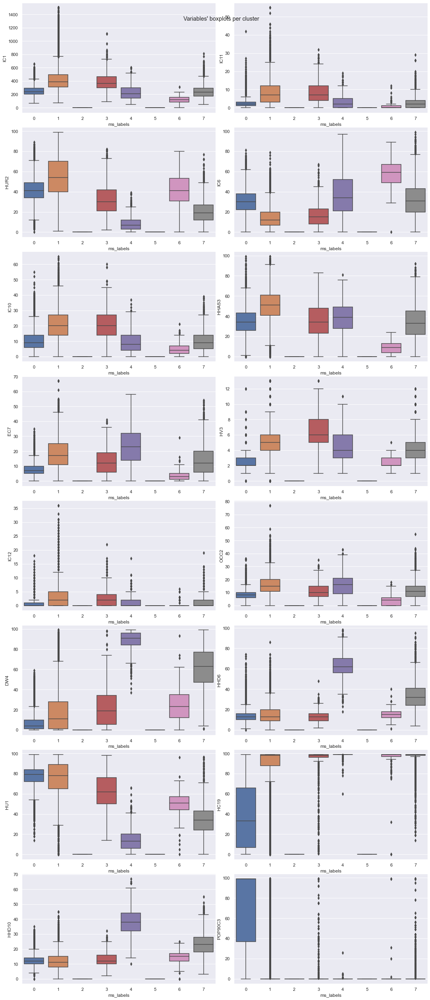

In [140]:
sns.set()

fig, axes = plt.subplots(8,2, figsize=(15,35))
fig.tight_layout()

for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="ms_labels", y=feat, data=df_final_ms,ax=ax)

title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

##### R^2

In [141]:
sst = get_ss(df_concat_ms[pc_features])
ssw_labels = df_concat_ms[pc_features + ["ms_labels"]].groupby(by='ms_labels').apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4242


#### 12.2.2.2. DBSCAN (Density-based spatial clustering of applications with noise) <a class="anchor" id="12.2.2.2"></a>

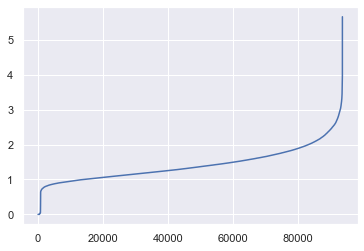

In [142]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df[pc_features])
distances, _ = neigh.kneighbors(df[pc_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [143]:
dbscan = DBSCAN(eps=2.2, min_samples=10, n_jobs=4) 
dbscan_labels = dbscan.fit_predict(df[pc_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 9


In [144]:
# Characterizing the clusters
df_concat_dbscan = df.copy()
df_concat_dbscan['dbscan_labels'] = dbscan_labels

df_final_dbscan = df_not_standardized.loc[df_concat_dbscan.index,:]
df_final_dbscan = pd.concat([df[pc_features],df_final_dbscan],axis=1)

df_final_dbscan['dbscan_labels']=dbscan_labels

#we also want to compare the clusters with the population:
aux_merge4=df_final_dbscan[metric_features].mean()
aux_merge4.name='Population'

pd.concat([df_final_dbscan[metric_features+['dbscan_labels']].groupby('dbscan_labels').mean(),pd.DataFrame(aux_merge4).T])[variables_to_interpret]

,IC1,IC11,HUR2,IC6,IC10,HHAS3,EC7,HV3,IC12,OCC2,...,HC19,HHD10,POP90C3,MARR1,POP90C1,MARR4,HHN1,ETH1,VOC1,POP90C2
-1,306.583700,4.947137,26.204846,30.628855,11.316079,40.873348,14.980176,4.642070,2.783040,13.026432,...,79.220264,21.003304,20.506608,46.970264,56.327093,30.185022,33.699339,71.016520,82.908590,22.254405
0,344.651915,5.674179,46.740687,21.384379,16.248350,43.459970,14.183222,4.257377,2.228272,12.718151,...,72.449670,13.457338,26.547481,59.012769,59.166930,22.836692,22.669654,86.014835,92.990668,13.523651
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,408.000000,12.000000,25.000000,12.000000,23.000000,79.000000,8.000000,4.000000,3.000000,12.000000,...,48.000000,31.000000,39.000000,52.000000,0.000000,28.000000,31.000000,86.000000,93.000000,61.000000
4,349.875000,6.406250,29.843750,19.437500,18.359375,39.468750,12.171875,5.359375,2.343750,9.859375,...,28.437500,14.640625,33.125000,57.468750,0.453125,27.046875,15.734375,35.187500,94.421875,66.000000
5,64.800000,0.066667,2.066667,82.333333,1.000000,22.933333,8.066667,2.000000,0.400000,5.533333,...,99.000000,45.000000,0.000000,13.866667,99.000000,37.533333,86.400000,75.733333,22.866667,0.000000
6,185.833333,1.375000,1.750000,40.750000,5.750000,28.708333,15.583333,4.750000,1.000000,15.750000,...,99.000000,46.291667,0.000000,22.583333,99.000000,51.708333,63.166667,52.500000,50.750000,0.000000
7,236.230769,0.923077,42.153846,17.384615,5.846154,32.076923,15.615385,4.153846,0.538462,9.153846,...,97.384615,2.692308,4.846154,73.000000,0.000000,23.000000,2.692308,76.153846,98.846154,94.538462
Population,341.428486,5.620196,46.133351,21.314094,16.065870,43.079036,14.074629,4.227419,2.215097,12.616195,...,71.915577,13.437299,26.267865,58.406156,58.626054,22.737907,22.608663,85.133138,92.126683,13.546741


##### Visual Analysis of the metric features´ results:

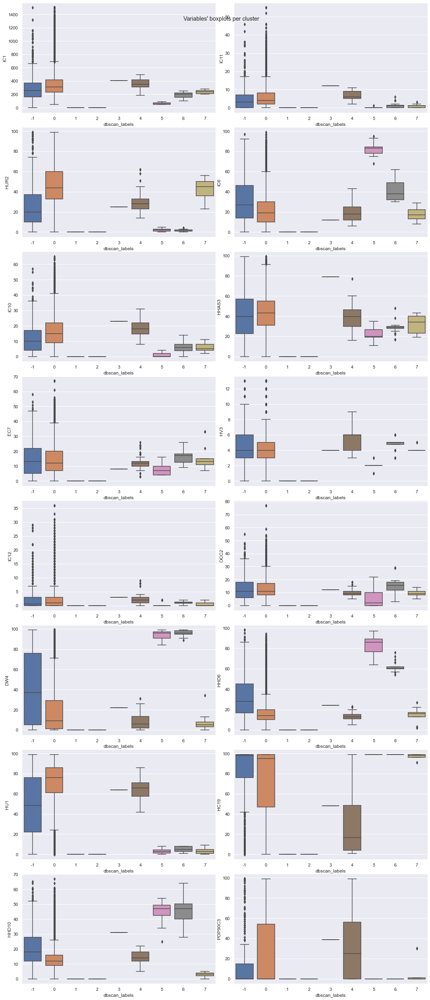

In [145]:
sns.set()

fig, axes = plt.subplots(8,2, figsize=(15,35))
fig.tight_layout()

for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="dbscan_labels", y=feat, data=df_final_dbscan,ax=ax)

title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

<AxesSubplot:xlabel='PC0', ylabel='PC1'>

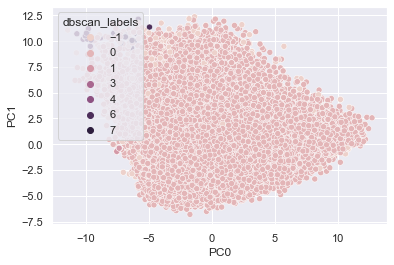

In [146]:
# representation of the clusters on the first 2 PC´s:
sns.scatterplot(x="PC0", y="PC1",hue="dbscan_labels",data=df_concat_dbscan)

##### R^2

In [147]:
df_nonoise = df_concat_dbscan[df_concat_dbscan['dbscan_labels'] != -1]

sst = get_ss(df_concat_dbscan[pc_features])
ssw_labels = df_nonoise[pc_features + ["dbscan_labels"]].groupby(by='dbscan_labels').apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0916


### 12.2.3. Gaussian Mixture Model <a class="anchor" id="12.2.3"></a>

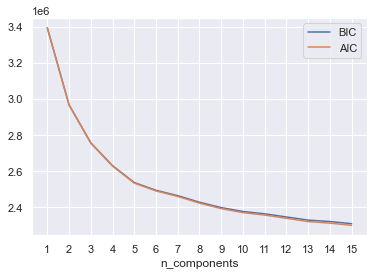

In [148]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df[pc_features])
          for n in n_components]

bic_values = [m.bic(df[pc_features]) for m in models]
aic_values = [m.aic(df[pc_features]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

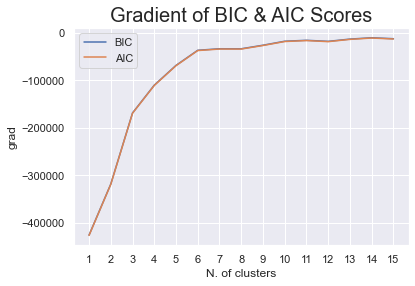

In [149]:
plt.errorbar(n_components, np.gradient(bic_values), label='BIC')
plt.errorbar(n_components, np.gradient(aic_values), label='AIC')
plt.title("Gradient of BIC & AIC Scores", fontsize=20)
plt.xticks(n_components)
plt.xlabel("N. of clusters")
plt.ylabel("grad")
plt.legend()

In [150]:
gmm = GaussianMixture(n_components=6, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df[pc_features])
df_concat_gmm = pd.concat([df[pc_features], pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)

In [151]:
df_concat_gmm['gmm_labels'].value_counts()

0    27080
5    23487
4    17566
2    15447
1     9398
3      752
Name: gmm_labels, dtype: int64

In [152]:
# ANALYSING THE GMM CLUSTERING SOLUTION FOR THE METRIC FEATURES:
df_final_gmm = df_not_standardized.loc[df_concat_gmm.index,:]
df_final_gmm['gmm_labels']=df_concat_gmm['gmm_labels'].copy()
df_final_gmm[variables_to_interpret+['gmm_labels']].groupby('gmm_labels').mean()

,IC1,IC11,HUR2,IC6,IC10,HHAS3,EC7,HV3,IC12,OCC2,...,HC19,HHD10,POP90C3,MARR1,POP90C1,MARR4,HHN1,ETH1,VOC1,POP90C2
gmm_labels,,,,,,,,,,,,,,,,,,,,,
0,459.470273,9.210487,58.837001,11.463552,22.094461,53.697969,20.498154,5.825185,4.008198,17.072230,...,95.834195,12.439845,0.479136,61.216913,98.581499,22.546640,20.343575,90.938663,96.274188,0.007238
1,238.734092,2.421792,30.569908,31.563524,9.888700,34.923814,8.261971,3.341243,0.785486,9.390509,...,69.150990,14.649074,25.444350,56.247712,41.761864,21.986806,25.734944,80.396893,90.277187,32.148968
2,403.814333,7.474849,57.613776,14.471807,20.969768,49.206124,16.628018,4.365573,2.837962,14.570402,...,58.299022,11.370169,29.478151,64.961546,43.349906,20.181330,17.933385,93.797242,96.482230,26.649317
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,293.519754,4.692076,29.272287,26.829329,13.535011,37.057611,14.280884,4.793066,1.722760,12.057099,...,97.038256,19.118923,0.203689,45.122794,98.822043,31.548674,31.298873,65.764317,85.150233,0.003928
5,252.153361,2.414783,44.250862,29.628007,10.768766,35.951888,7.611359,2.361264,0.749223,8.306042,...,37.912760,11.642909,74.554392,63.522417,1.167497,19.078810,21.268617,91.848171,93.387576,23.659173


<AxesSubplot:xlabel='PC0', ylabel='PC1'>

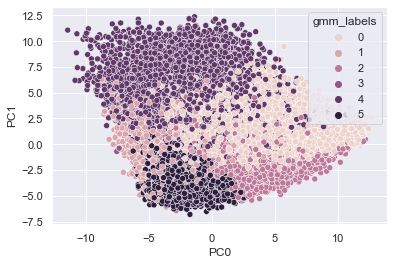

In [153]:
sns.scatterplot(x="PC0", y="PC1",hue="gmm_labels",data=df_concat_gmm)

##### Visual Analysis of the metric features´ results

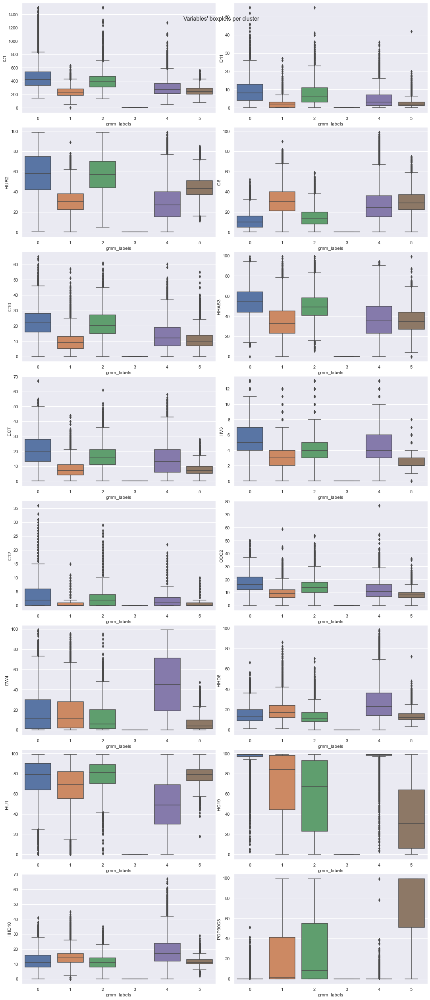

In [154]:
sns.set()

fig, axes = plt.subplots(8,2, figsize=(15,35))
fig.tight_layout()

for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="gmm_labels", y=feat, data=df_final_gmm,ax=ax)

title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

##### R^2

In [155]:
sst = get_ss(df[pc_features])
ssw_labels = df_concat_gmm.groupby(by='gmm_labels').apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3984


### 12.2.4. SOM (Self Organizing Maps) <a class="anchor" id="12.2.4"></a>

In [157]:
# install sompy (use our forked version - the original one has visualization bugs)
!conda install git -y
!pip install -U git+https://github.com/joaopfonseca/SOMPY.git
# IF THIS IT TAKING TOO LONG, TRY TO INSTALL IT FROM THE ANACONDA PROMPT

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\catsd\anaconda3\envs\DM_GroupBA

  added / updated specs:
    - git


The following NEW packages will be INSTALLED:

  git                pkgs/main/win-64::git-2.23.0-h6bb4b03_0


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done
  Cloning https://github.com/joaopfonseca/SOMPY.git to c:\users\catsd\appdata\local\temp\pip-req-build-obs89zof
  Using cached numexpr-2.7.2-cp38-cp38-win_amd64.whl (92 kB)
  Created wheel for SOMPY: filename=SOMPY-1.1.1-py3-none-any.whl size=28249 sha256=d5a861377972e8757bbe07359a2155e106bd83325c3c76437eb72716cc6d297e
  Stored in directory: C:\Users\catsd\AppData\Local\Temp\pip-ephem-wheel-cache-96h1k7hn\wheels\9e\a9\4d\37b0c10e45d0da24b8bc25eb1a5379f46b0428c5ec5175113e
Successfully built SOMPY


You should consider upgrading via the 'C:\Users\catsd\anaconda3\envs\DM_GroupBA\python.exe -m pip install --upgrade pip' command.


In [158]:
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView #we are only importing here to avoid warnings

In [159]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df[pc_features].values, 
    mapsize=(50, 50), 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=pc_features
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.004000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  3.418000, quantization error: 3.687948

 epoch: 2 ---> elapsed time:  3.147000, quantization error: 2.913131

 epoch: 3 ---> elapsed time:  3.184000, quantization error: 2.901502

 epoch: 4 ---> elapsed time:  3.203000, quantization error: 2.897596

 epoch: 5 ---> elapsed time:  3.234000, quantization error: 2.894510

 epoch: 6 ---> elapsed time:  3.608000, quantization error: 2.891698

 epoch: 7 ---> elapsed time:  3.343000, quantization error: 2.889397

 epoch: 8 ---> elapsed time:  3.252000, quantization error: 2.887860

 epoch: 9 ---> elapsed time:  3.421000, quantization error: 2.886934

 epoch: 10 ---> elapsed time:  3.030000, quantization error: 2.886242

 epoch: 11 ---> elapsed time:  3.114000, quantization error: 2.885563

 epoch: 12 ---> elapsed time:  2.897000, quantization error: 2.884870

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  3.683000, quantization error: 2.379992

 epoch: 15 ---> elapsed time:  3.716000, quantization error: 2.372883

 epoch: 16 ---> elapsed time:  3.483000, quantization error: 2.365701

 epoch: 17 ---> elapsed time:  3.843000, quantization error: 2.358444

 epoch: 18 ---> elapsed time:  3.473000, quantization error: 2.351117

 epoch: 19 ---> elapsed time:  3.552000, quantization error: 2.343689

 epoch: 20 ---> elapsed time:  3.482000, quantization error: 2.336162

 epoch: 21 ---> elapsed time:  3.417000, quantization error: 2.328541

 epoch: 22 ---> elapsed time:  3.818000, quantization error: 2.320825

 epoch: 23 ---> elapsed time:  3.423000, quantization error: 2.313032

 epoch: 24 ---> elapsed time:  3.535000, quantization error: 2.305122

 epoch: 25 ---> elapsed time:  3.534000, quantization error: 2.297105

 epoch: 26 ---> elapsed time:  3.492000, quantization error: 2.288996

 epoch: 27 ---> elapsed time:  3.535000, quantization error: 2.280792

 epoch

##### Component Planes

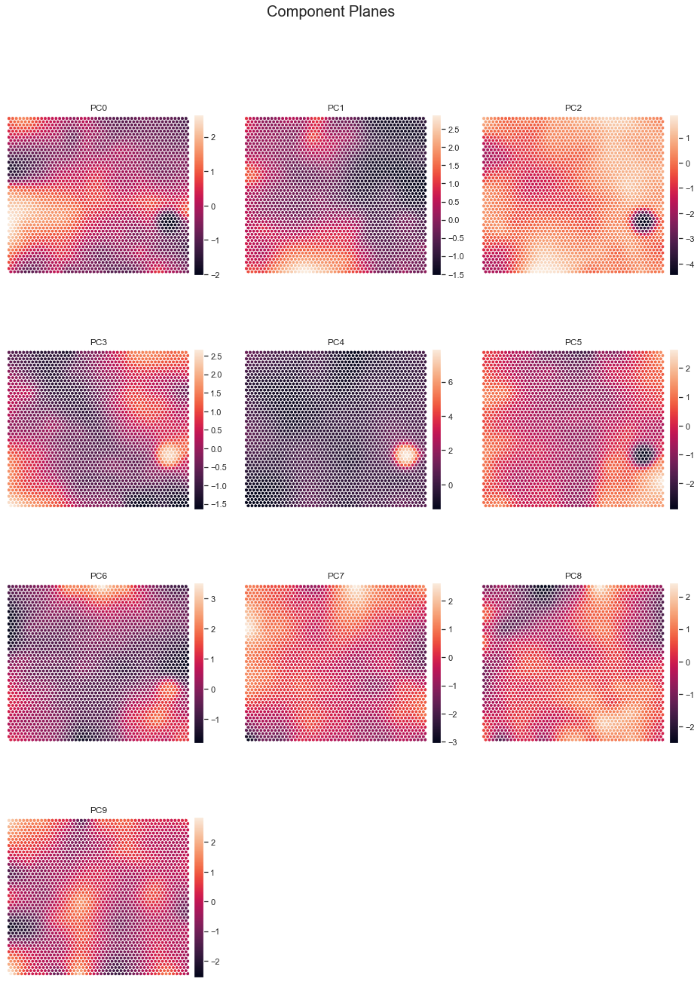

In [160]:
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

##### U-Matrix

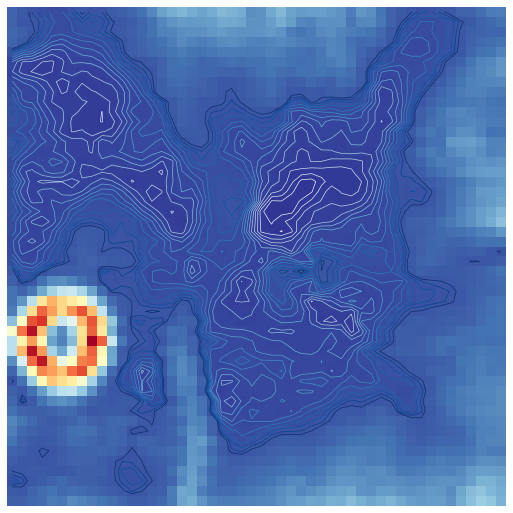

In [161]:
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance2=1, 
    row_normalized=False, 
    show_data=False, 
    contooor=True
)

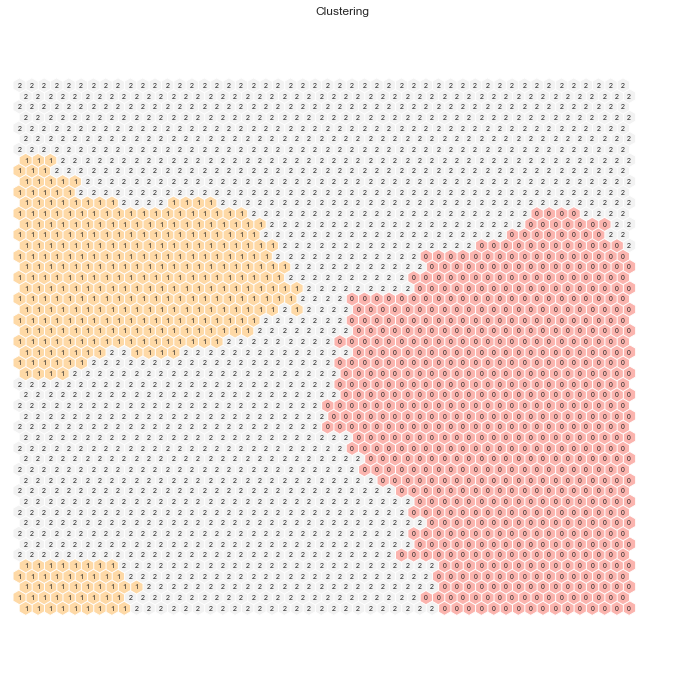

In [162]:
# Perform Hierarchical clustering - Gave us 3
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity="euclidean")
nodeclus_labels = sm.cluster(hierclust)

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [163]:
nodes = sm.get_node_vectors()

df_nodes = pd.DataFrame(nodes, columns=pc_features)
df_nodes['som_labels'] = nodeclus_labels
df_nodes

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,som_labels
0,-4.201290,-2.754087,0.223308,2.203162,0.475254,1.679637,-1.099538,1.258409,-0.633148,0.410513,0
1,-3.913910,-3.073319,0.455709,2.156204,0.384079,1.372690,-1.044206,1.064420,-0.575427,0.290406,0
2,-3.561147,-3.338826,0.665764,2.120021,0.314481,1.093847,-1.009782,0.844900,-0.498432,0.257703,0
3,-3.288015,-3.405715,0.709608,1.954968,0.206048,0.834360,-0.947486,0.755316,-0.315959,0.189637,0
4,-2.968828,-3.523022,0.822693,1.897812,0.147537,0.588914,-0.906938,0.633698,-0.149515,0.137920,0
...,...,...,...,...,...,...,...,...,...,...,...
2495,-3.430387,3.128681,-3.085108,3.269848,-1.967967,1.730151,0.766435,-1.479906,-1.491629,0.499147,2
2496,-2.565849,3.269898,-3.011127,3.463617,-1.999415,1.589003,0.867765,-1.812647,-1.068233,0.897545,2
2497,-1.449908,3.674211,-2.949104,3.767749,-2.031453,1.423875,0.953888,-2.309247,-0.587161,1.428062,2
2498,-0.307521,3.911828,-2.897892,3.984146,-1.986199,1.307626,1.048983,-2.793637,-0.045392,1.984067,2


##### Getting the Best Matching-Unit

In [164]:
bmus_map = sm.find_bmu(df[pc_features])[0]

df_bmus = pd.DataFrame(
    np.concatenate((df, np.expand_dims(bmus_map,1)), axis=1),
    index=df.index, columns=np.append(df.columns,"BMU")
)
df_bmus

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C,BMU
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-0.687400,-3.591257,-0.318401,-0.886766,0.480059,0.686994,-0.941811,-1.779275,-0.193402,0.040146,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1001.0
1,148535,9.968580,1.858562,-1.623432,4.737081,-1.880306,2.502743,2.232904,-0.934507,-0.728176,-0.541862,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1949.0
2,15078,-2.505741,-3.611689,1.220899,1.552296,0.277409,0.428444,-0.238713,0.107321,-0.239932,-0.170799,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,155.0
3,172556,-1.319154,-0.814256,0.121235,4.744637,-0.414887,1.004479,-0.248534,-1.166008,-0.933160,0.866347,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2496.0
5,47784,0.787797,-0.636401,-0.144008,-0.521891,0.176242,-0.070605,-0.603189,0.273283,0.168470,-0.191782,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1023.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,-1.180842,-4.310511,1.577103,2.640190,-0.226037,-1.118162,-0.142071,0.525611,0.006379,-0.413140,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,10.0
95407,184568,1.916301,1.876740,0.516514,0.098975,-0.214878,-0.487245,0.209406,0.178977,1.466590,-1.090230,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2087.0
95408,122706,7.237966,-0.660440,1.040668,1.480215,1.042366,0.750471,0.834931,1.883412,-0.007360,-1.117352,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1599.0


In [165]:
df_final_som = df_bmus.merge(df_nodes['som_labels'], 'left', left_on="BMU", right_index=True)
df_final_som

,,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C,BMU,som_labels
,CONTROLN,,,,,,,,,,,,,,,,,,,,,
0,95515,-0.687400,-3.591257,-0.318401,-0.886766,0.480059,0.686994,-0.941811,-1.779275,-0.193402,0.040146,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1001.0,0
1,148535,9.968580,1.858562,-1.623432,4.737081,-1.880306,2.502743,2.232904,-0.934507,-0.728176,-0.541862,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1949.0,1
2,15078,-2.505741,-3.611689,1.220899,1.552296,0.277409,0.428444,-0.238713,0.107321,-0.239932,-0.170799,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,155.0,0
3,172556,-1.319154,-0.814256,0.121235,4.744637,-0.414887,1.004479,-0.248534,-1.166008,-0.933160,0.866347,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2496.0,2
5,47784,0.787797,-0.636401,-0.144008,-0.521891,0.176242,-0.070605,-0.603189,0.273283,0.168470,-0.191782,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1023.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95406,35088,-1.180842,-4.310511,1.577103,2.640190,-0.226037,-1.118162,-0.142071,0.525611,0.006379,-0.413140,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,10.0,0
95407,184568,1.916301,1.876740,0.516514,0.098975,-0.214878,-0.487245,0.209406,0.178977,1.466590,-1.090230,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2087.0,2
95408,122706,7.237966,-0.660440,1.040668,1.480215,1.042366,0.750471,0.834931,1.883412,-0.007360,-1.117352,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1599.0,1


In [166]:
df_final_som.drop(columns='BMU').groupby('som_labels').mean()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,RFA_2F_2,RFA_2F_3,RFA_2F_4,RFA_2A_E,RFA_2A_F,RFA_2A_G,RFA_2A_OTHER,GEOCODE2_A,GEOCODE2_B,GEOCODE2_C
som_labels,,,,,,,,,,,,,,,,,,,,,
0,-1.447714,-3.280104,0.799375,0.956567,0.438605,-0.198789,-0.381348,-0.235615,-0.121039,-0.041948,...,0.217119,0.162394,0.132475,0.241292,0.488171,0.184506,0.086031,0.123677,0.238280,0.235823
1,5.118822,0.325659,-0.371873,0.034384,0.144780,0.071547,0.008169,0.389281,-0.118645,-0.010623,...,0.217080,0.149857,0.109503,0.198953,0.497827,0.243604,0.059617,0.590833,0.328904,0.078238
2,-1.330489,1.502742,-0.289110,-0.554722,-0.297706,0.063581,0.184825,-0.043136,0.112145,0.010488,...,0.213600,0.164314,0.127319,0.232233,0.492673,0.193268,0.081826,0.394039,0.318494,0.158863


In [167]:
df_concat_som = pd.concat([df_final_som.iloc[:,:10] , df_final_som.iloc[:,-1]], axis=1)

##### R^2

In [168]:
sst = get_ss(df_concat_som[pc_features])
ssw_labels = df_concat_som[pc_features + ["som_labels"]].groupby(by='som_labels').apply(get_ss)
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
r2

0.3477314247808694

<AxesSubplot:xlabel='PC0', ylabel='PC1'>

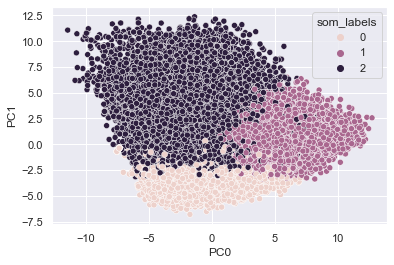

In [169]:
sns.scatterplot(x="PC0", y="PC1",hue="som_labels",data=df_concat_som)

In [170]:
# ANALYSING THE SOM CLUSTERING SOLUTION FOR THE METRIC FEATURES:
df_final_som = df_not_standardized.loc[df_concat_som.index,:]
df_final_som['som_labels']=df_concat_som['som_labels'].copy()
df_final_som[variables_to_interpret+['som_labels']].groupby('som_labels').mean()

,IC1,IC11,HUR2,IC6,IC10,HHAS3,EC7,HV3,IC12,OCC2,...,HC19,HHD10,POP90C3,MARR1,POP90C1,MARR4,HHN1,ETH1,VOC1,POP90C2
som_labels,,,,,,,,,,,,,,,,,,,,,
0,276.000317,3.367228,45.321696,25.113137,12.902675,36.501882,8.474856,2.611650,1.096850,8.829166,...,25.216168,11.251635,84.036457,63.048108,6.880246,18.727284,18.338260,88.960055,91.795047,5.448742
1,552.715499,12.933765,71.494221,7.446310,26.318236,59.194063,24.656772,6.708337,5.931098,19.903734,...,86.555320,9.811963,5.579818,66.143633,91.704188,20.867974,15.260200,90.528895,97.579324,1.897659
2,286.989285,3.729652,35.916060,25.146262,13.418226,39.756886,12.562975,4.031462,1.240668,11.538913,...,90.197061,16.101681,4.734979,52.731580,71.809861,25.620179,27.925677,80.867458,90.012125,22.670252


##### Visual Analysis of the metric features´ results

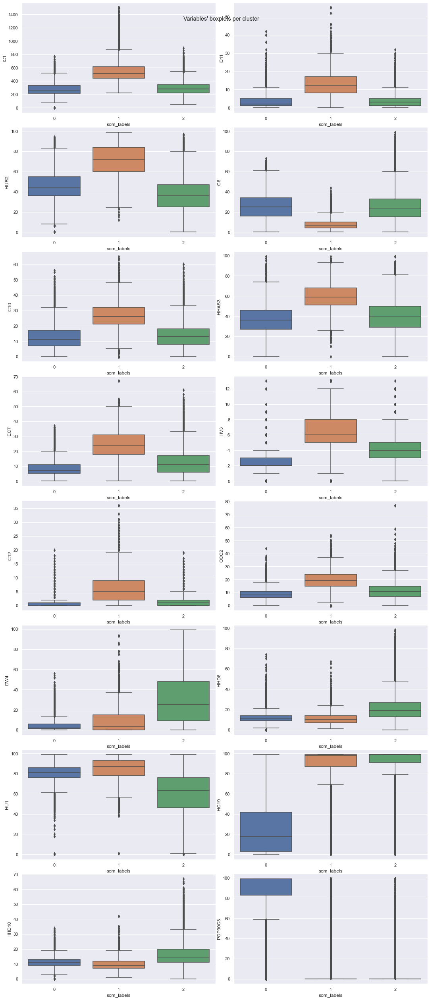

In [171]:
sns.set()

fig, axes = plt.subplots(8,2, figsize=(15,35))
fig.tight_layout()

for ax, feat in zip(axes.flatten(), variables_to_interpret):
    sns.boxplot(x="som_labels", y=feat, data=df_final_som,ax=ax)

title = "Variables' boxplots per cluster"
plt.suptitle(title)
plt.show()

In [173]:
pip freeze > Project_Notebook_GroupBA.txt

Note: you may need to restart the kernel to use updated packages.
